In [1]:
setwd('../Thyroid_code')
source('Tumor_analysis_functions.R')
library(Seurat)
library(ggsci)
library(dplyr)
library(ggplot2)
library(reshape2)
library(cowplot)
library(ggpubr)
library(glue)
library(vegan)
library(ComplexHeatmap)
library(ggrepel)
process_seurat_noIG <-function(obj, dim=30, n.components=2,resolution=0.5,npcs=50){
  obj <- NormalizeData(obj, normalization.method = "LogNormalize", scale.factor = 10000)
  obj <- FindVariableFeatures(obj, selection.method = "vst", nfeatures = 2000)
  vf_gene = VariableFeatures(obj)
  #vf_gene = grep('^IG', vf_gene,value = T, invert = T)
  obj <- ScaleData(obj, features = vf_gene)
  obj <- RunPCA(obj, features = vf_gene, npcs = npcs, verbose = TRUE)
  obj = RunHarmony(obj, "patient", plot_convergence = TRUE)
  obj <- FindNeighbors(obj, reduction = "harmony",dims = 1:dim)
  obj <- FindClusters(obj, resolution = resolution)
  obj <- RunUMAP(obj,dims = 1:dim,reduction = "harmony", n.components=n.components)
  return(obj)
}
source('../color_definition.R')
output_dir='./Figure5/'

Warning message:
“package ‘Seurat’ was built under R version 4.2.3”
Attaching SeuratObject

Seurat v4 was just loaded with SeuratObject v5; disabling v5 assays and
validation routines, and ensuring assays work in strict v3/v4
compatibility mode

Warning message:
“package ‘dplyr’ was built under R version 4.2.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message:
“package ‘harmony’ was built under R version 4.2.3”
Loading required package: Rcpp

Warning message:
“package ‘Rcpp’ was built under R version 4.2.3”
Warning message:
“package ‘reshape2’ was built under R version 4.2.3”

Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths



Attaching package: ‘cowplot’


The following object is masked from ‘package:ggpubr’:

    get_legend


Warning message:
“package ‘glue’ was built un

# Define EIC process

In [ ]:
project_list = readRDS('../output/9_benign_nodule_patients_T2BP_mapping.rds')
a = lapply(names(project_list), function(x){
  tmp = project_list[[x]]@meta.data %>%
    filter(!is.na(predicted.id))%>%
    group_by(predicted.id, patient) %>%
    summarise(cell_num=n())
  tmp$total_num = sum(tmp$cell_num) 
  tmp$prop=tmp$cell_num/tmp$total_num
  tmp
})

# Average distance between B and P in UMAP
b = lapply(names(project_list), function(x){
  tmp = project_list[[x]]
  tmp = subset(tmp, Tissue_desc%in%c('B', 'P'))
  umap_xy = as.data.frame(tmp@reductions$umap@cell.embeddings)
  umap_xy$sc3_cluster = tmp$sc3_cluster
  umap_xy_center = umap_xy %>% group_by(sc3_cluster) %>% summarise_all(list(mean))
  umap_dist = dist(umap_xy_center[,2:3])
  umap_dist = as.matrix(umap_dist)
  
  center_dist = umap_dist[!grepl('P', umap_xy_center$sc3_cluster), grepl('P', umap_xy_center$sc3_cluster), drop=F]
  center_dist = apply(center_dist, 1, max)
  res = data.frame(sc3_cluster=umap_xy_center$sc3_cluster[!grepl('P', umap_xy_center$sc3_cluster)],
                   dist=center_dist)
  res
})
b_res = do.call(rbind, b) 
a_res = as.data.frame(do.call(rbind, a))


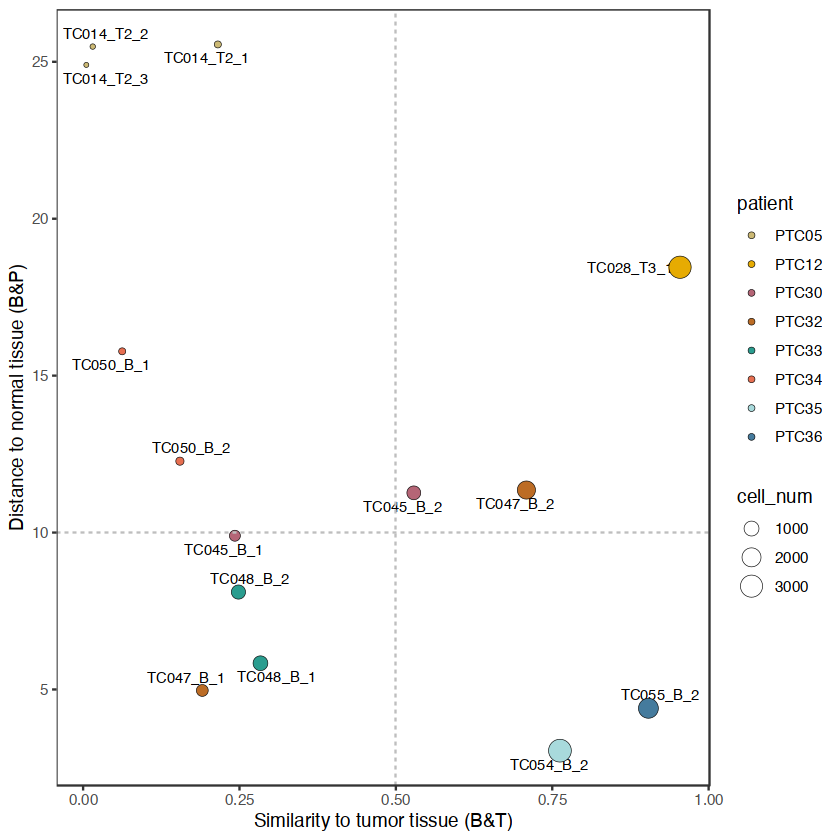

In [35]:


ab_res = merge(a_res, b_res, by.x = 'predicted.id', by.y = 'sc3_cluster')
library(ggrepel)
a=ab_res%>%
  ggplot(aes(x=prop, y=dist, fill=patient))+
  geom_text_repel(aes(label=predicted.id), size=3)+
  geom_point(aes(size=cell_num),shape=21, stroke=0.2)+
  geom_hline(yintercept = 10, linetype='dashed', color='gray')+
  geom_vline(xintercept = 0.5, linetype='dashed', color='gray')+
  scale_fill_manual(values = all_patient_color)+
  labs(x='Similarity to tumor tissue (B&T)', y='Distance to normal tissue (B&P)')+
  theme_bw()+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/define_EIC.pdf'), plot = a, width = 5, height = 4)


# EICs UMAP

In [2]:

mal_B = c('TC028_T3_1', 'TC045_B_2', 'TC047_B_2')
srt_B = readRDS('../output/MB_B.rds')
srt_B[['Type']] = 'NB'
srt_B@meta.data[srt_B$malignant_tendencies=='Yes', 'Type'] = 'EICs'

Centering and scaling data matrix

PC_ 1 
Positive:  GADD45A, MAFF, FOSB, ANXA1, KLF6, EMP1, ATF3, MYADM, LMNA, ETS2 
	   JUND, MCL1, PPP1R15A, ERRFI1, NR4A1, SERTAD1, CSRNP1, CDKN1A, GPRC5A, SFPQ 
	   TRIB1, DNAJA1, CLDN4, MIR22HG, MIDN, SPSB1, SLC25A25, KLF10, DUSP5, LUCAT1 
Negative:  MT1H, MT1G, MT1F, MYL9, COL9A3, CTSB, SFRP1, IYD, S100A4, MT1E 
	   HHEX, SMIM1, SLC40A1, AQP5, TXNIP, FGF7, CYP27A1, EMID1, CNTN6, WFDC2 
	   MZT2A, A1BG, ACAD8, LMO3, ZNF486, ERP27, NMU, LYPLA2, TMEM37, BCAT1 
PC_ 2 
Positive:  NUPR1, PKHD1L1, CRABP1, CAV1, MATN2, ADIRF, ID1, PLA2R1, ID3, IGFBP7 
	   LRP2, ANXA2, SLC43A3, ZFP36L2, TXNIP, ANXA3, CAV2, SELENOP, CRYAB, SMOC2 
	   FHL1, IFITM3, SOD3, CRIM1, PPP1R14C, NPM2, GGT5, ABLIM1, HSD17B6, GSN 
Negative:  SFRP1, S100A4, COL9A3, CRABP2, AQP5, EMID1, CLDN9, CAMK2N1, SMIM1, NMU 
	   CRTAC1, MT1H, KRT19, AK1, HLA-B, BCAT1, CYP27A1, NRN1L, CKB, TGFBI 
	   MAG, CNTFR, ABI3BP, SLC9A3R1, CDKN1A, SCGB2A1, MZT2A, HLA-C, PRKCD, MFAP2 
PC_ 3 
Positive:  BCAM, 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12586
Number of edges: 400900

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8573
Number of communities: 9
Elapsed time: 1 seconds


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
09:05:56 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

09:05:56 Read 12586 rows and found 10 numeric columns

09:05:56 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

09:05:56 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:05:57 Writing NN index file to 

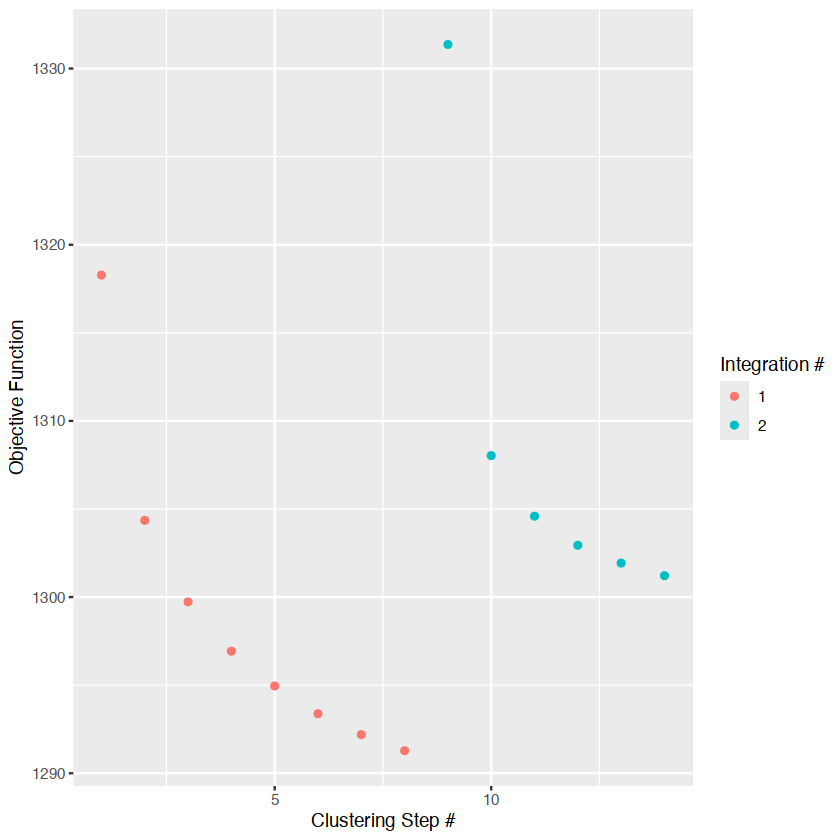

In [3]:
set.seed(1234)
process_seurat_noIG <-function(obj, dim=30, n.components=2,resolution=0.5,npcs=50){
  obj <- NormalizeData(obj, normalization.method = "LogNormalize", scale.factor = 10000)
  obj <- FindVariableFeatures(obj, selection.method = "vst", nfeatures = 2000)
  vf_gene = VariableFeatures(obj)
  #vf_gene = grep('^IG', vf_gene,value = T, invert = T)
  obj <- ScaleData(obj, features = vf_gene)
  obj <- RunPCA(obj, features = vf_gene, npcs = npcs, verbose = TRUE)
  obj = RunHarmony(obj, "patient", plot_convergence = TRUE)
  obj <- FindNeighbors(obj, reduction = "harmony",dims = 1:dim)
  obj <- FindClusters(obj, resolution = resolution)
  obj <- RunUMAP(obj,dims = 1:dim,reduction = "harmony", n.components=n.components)
  return(obj)
}
srt_B = process_seurat_noIG(srt_B, dim=10,npcs=50)

In [4]:
saveRDS(srt_B, '../output/MB_B_umap.rds')

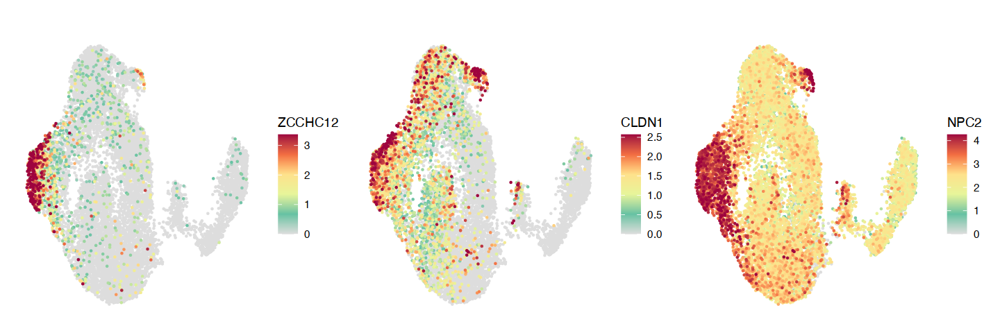

In [19]:
options(repr.plot.width=12, repr.plot.height=4)
umap = as.data.frame(srt_B@reductions$umap@cell.embeddings)
umap[,c('NPC2','ZCCHC12','CLDN1')] = FetchData(srt_B, vars = c('NPC2','ZCCHC12','CLDN1'))

umap$CLDN1[umap$CLDN1>quantile(umap$CLDN1,0.99)] = quantile(umap$CLDN1,0.99)
umap$ZCCHC12[umap$ZCCHC12>quantile(umap$ZCCHC12,0.99)] = quantile(umap$ZCCHC12,0.99)
umap$NPC2[umap$NPC2>quantile(umap$NPC2,0.99)] = quantile(umap$NPC2,0.99)
#umap = umap %>% arrange(Type)
a=umap %>%
  arrange(ZCCHC12)%>%
  ggplot(aes(x=UMAP_1, y=UMAP_2))+
  geom_point(aes(fill=ZCCHC12),shape=21,size=1, stroke=NA)+
  scale_fill_gradientn(colours = c('#dddddd','#66C2A3','#E7F59A', '#FEE18B','#F26D42','#9E033E'))+
  theme_classic()+
  theme(
    axis.line = element_blank(),
    axis.ticks = element_blank(), # Hide ticks
    axis.text = element_blank(), # Hide tick text
    axis.title = element_blank(),
    legend.background = element_rect(fill = "white", size = 1, colour = "white"),
  )+
  labs('title'='')
b=umap %>%
  arrange(CLDN1)%>%
  ggplot(aes(x=UMAP_1, y=UMAP_2))+
  geom_point(aes(fill=CLDN1),shape=21,size=1, stroke=NA)+
  scale_fill_gradientn(colours = c('#dddddd','#66C2A3','#E7F59A', '#FEE18B','#F26D42','#9E033E'))+
  theme_classic()+
  theme(
    axis.line = element_blank(),
    axis.ticks = element_blank(), # Hide ticks
    axis.text = element_blank(), # Hide tick text
    axis.title = element_blank(),
    legend.background = element_rect(fill = "white", size = 1, colour = "white"),
  )+
  labs('title'='')
c=umap %>%
  arrange(NPC2)%>%
  ggplot(aes(x=UMAP_1, y=UMAP_2))+
  geom_point(aes(fill=NPC2),shape=21,size=1, stroke=NA)+
  scale_fill_gradientn(colours = c('#dddddd','#66C2A3','#E7F59A', '#FEE18B','#F26D42','#9E033E'))+
  # scale_fill_gradientn(colours = c('#dddddd','#FDAE61','#D7191C'))+
  theme_classic()+
  theme(
    axis.line = element_blank(),
    axis.ticks = element_blank(), # Hide ticks
    axis.text = element_blank(), # Hide tick text
    axis.title = element_blank(),
    legend.background = element_rect(fill = "white", size = 1, colour = "white"),
  )+
  labs('title'='')
a|b|c

In [17]:
ggsave(glue('{output_dir}/Marker_umap.pdf'), plot = a|b|c,  
       width=260, height=80, units='mm', dpi = 450, bg = 'transparent')

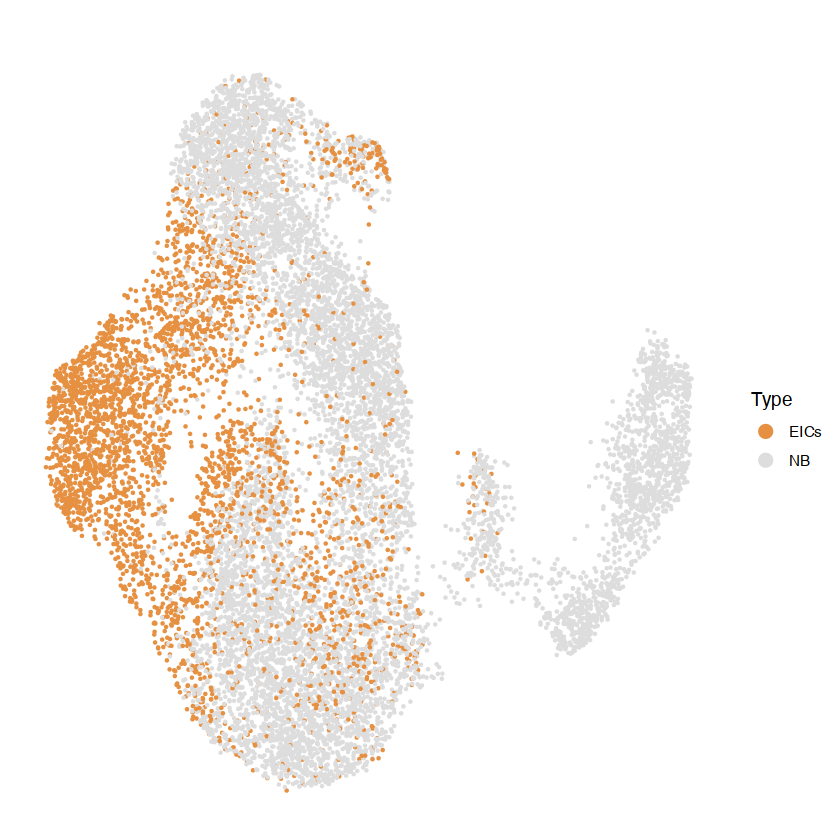

In [62]:
umap = as.data.frame(srt_B@reductions$umap@cell.embeddings)
umap$Type = srt_B$Type#factor(srt_B$Type, c('NB','EICs'))
#umap = umap %>% arrange(Type)
all_cells=umap %>%
  ggplot(aes(x=UMAP_1, y=UMAP_2))+
  geom_point(aes(fill=Type),shape=21,size=1, stroke=NA)+
  scale_fill_manual(values = c('NB'='#dddddd', 'EICs'='#E69042'))+
  theme_classic()+
  theme(
    axis.line = element_blank(),
    axis.ticks = element_blank(), # Hide ticks
    axis.text = element_blank(), # Hide tick text
    axis.title = element_blank(),
    legend.background = element_rect(fill = "white", size = 1, colour = "white"),
  )+
  guides(fill = guide_legend(override.aes = list(size=4, stroke=NA,shape=21)))+ # Legend size
  labs('title'='')
all_cells

In [63]:
ggsave(glue('{output_dir}/EIC_umap.pdf'), plot = all_cells,  
       width=100, height=80, units='mm', dpi = 450, bg = 'transparent')

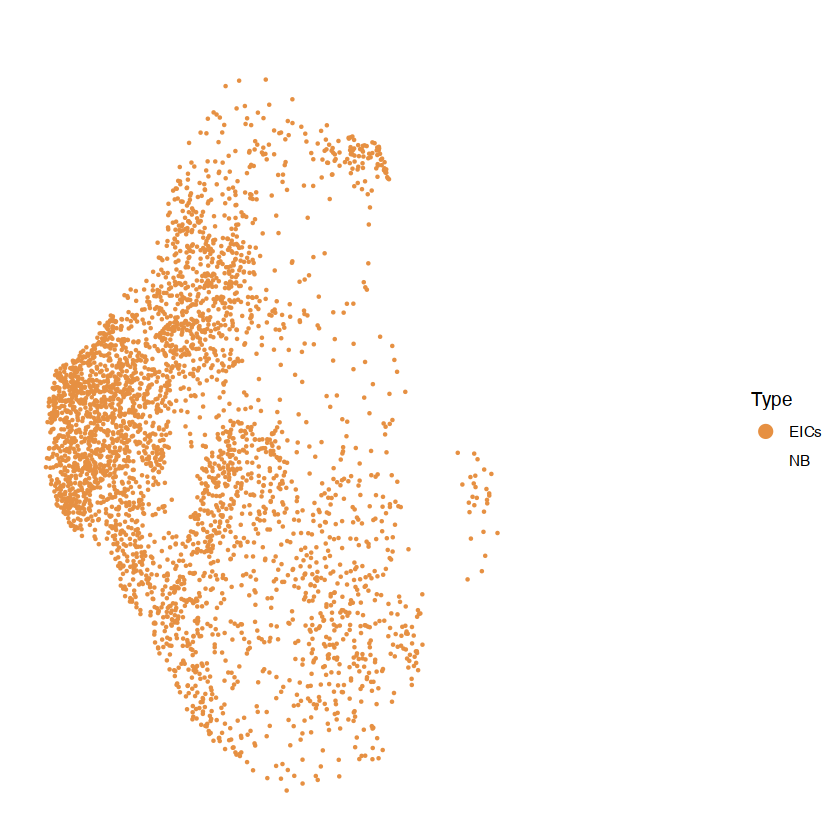

In [76]:
umap = as.data.frame(srt_B@reductions$umap@cell.embeddings)
umap$Type = srt_B$Type#factor(srt_B$Type, c('NB','EICs'))
#umap = umap %>% arrange(Type)
all_cells=umap %>%
  ggplot(aes(x=UMAP_1, y=UMAP_2))+
  geom_point(aes(fill=Type),shape=21,size=1, stroke=NA)+
  scale_fill_manual(values = c('NB'='NA', 'EICs'='#E69042'))+
  theme_classic()+
  theme(
    axis.line = element_blank(),
    axis.ticks = element_blank(), # Hide ticks
    axis.text = element_blank(), # Hide tick text
    axis.title = element_blank(),
    legend.background = element_rect(fill = "white", size = 1, colour = "white"),
  )+
  guides(fill = guide_legend(override.aes = list(size=4, stroke=NA,shape=21)))+ # Legend size
  labs('title'='')
all_cells

In [77]:
ggsave(glue('{output_dir}/EIC_umap2.pdf'), plot = all_cells,  
       width=100, height=80, units='mm', dpi = 450, bg = 'transparent')

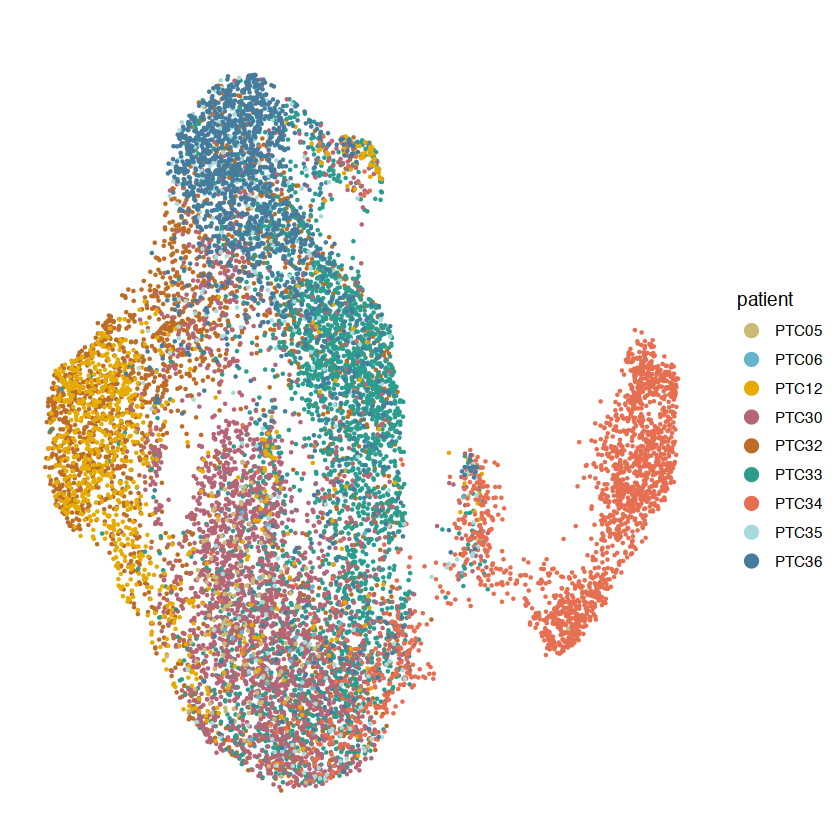

In [64]:
umap = as.data.frame(srt_B@reductions$umap@cell.embeddings)
umap$patient = srt_B$patient#factor(srt_B$Type, c('NB','EICs'))
#umap = umap %>% arrange(Type)
all_cells=umap %>%
  ggplot(aes(x=UMAP_1, y=UMAP_2))+
  geom_point(aes(fill=patient),shape=21,size=1, stroke=NA)+
  scale_fill_manual(values = all_patient_color)+
  theme_classic()+
  theme(
    axis.line = element_blank(),
    axis.ticks = element_blank(), # Hide ticks
    axis.text = element_blank(), # Hide tick text
    axis.title = element_blank(),
    legend.background = element_rect(fill = "white", size = 1, colour = "white"),
  )+
  guides(fill = guide_legend(override.aes = list(size=4, stroke=NA,shape=21)))+ # Legend size
  labs('title'='')
all_cells
ggsave(glue('{output_dir}/EIC_umap(patient).pdf'), plot = all_cells,  
       width=100, height=80, units='mm', dpi = 450, bg = 'transparent')

# EIC comparison with benign nodules

## CytoTRACE

In [11]:
library(CytoTRACE)

Welcome to the CytoTRACE R package, a tool for the unbiased prediction of differentiation states in scRNA-seq data. For more information about this method, visit https://cytotrace.stanford.edu.




Warning message:
“The ScanoramaCT python module is not accessible. The iCytoTRACE function for integration across multiple datasets will be disabled. Please follow the instructions in https://github.com/gunsagargulati/CytoTRACE to install the necessary Python packages for this application.”


In [ ]:
other_srt = readRDS('../output/clean_rds/All_ann_97_new.rds')
other_srt = subset(other_srt, Tissue_desc=='B')
other_srt = subset(other_srt, batch=='new')
other_srt = subset(other_srt, Cluster=='Epithelial')

In [22]:
other_srt[['group']] = 'B'
srt_B[['group']] = srt_B$Type
tmp_srt = merge(other_srt, srt_B)

In [24]:
batch_srt = subset(tmp_srt, group!='EICs')
DefaultAssay(batch_srt) ='RNA'
count_mat = as.matrix(GetAssayData(batch_srt, assay = 'RNA', slot ='counts'))

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 5.4 GiB”


In [26]:
library(sva)
count_mat_corrected <- ComBat(dat = count_mat, batch = batch_srt$group)

Loading required package: mgcv

Loading required package: nlme


Attaching package: ‘nlme’


The following object is masked from ‘package:dplyr’:

    collapse




This is mgcv 1.9-3. For overview type 'help("mgcv-package")'.

Loading required package: genefilter


Attaching package: ‘genefilter’


The following object is masked from ‘package:ComplexHeatmap’:

    dist2


Loading required package: BiocParallel



Found 6979 genes with uniform expression within a single batch (all zeros); these will not be adjusted for batch.


Found2batches

Adjusting for0covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data




In [ ]:
count_mat_corrected = round(count_mat_corrected, 0)
count_mat_corrected[is.na(count_mat_corrected)] = 0
count_mat_corrected[count_mat_corrected<0] = 0

In [75]:
saveRDS(count_mat_corrected, '../output/Cytotrace/count_mat_corrected.rds')

In [ ]:
results <- CytoTRACE(count_mat_corrected)
saveRDS(results, '../output/Cytotrace/pure_benign.rds')

The number of cells in your dataset exceeds 3,000. CytoTRACE will now be run in fast mode (see documentation). You can multi-thread this run using the 'ncores' flag. To disable fast mode, please indicate 'enableFast = FALSE'.

Warning message in CytoTRACE(count_mat_corrected2):
“4221 genes have zero expression in the matrix and were filtered”
CytoTRACE will be run on 24 sub-sample(s) of approximately 1006 cells each using 1 / 1 core(s)

Pre-processing data and generating similarity matrix...

Calculating gene counts signature...

Smoothing values with NNLS regression and diffusion...

Calculating genes associated with CytoTRACE...

Done



In [12]:
only_B_results = readRDS('../output/Cytotrace/pure_benign.rds')
B_MB_results = readRDS('../output/Cytotrace/srt_B_MB.rds')
all_epi_results = readRDS('../output/Cytotrace/epi87.rds')

In [13]:
srt = readRDS('../output/clean_rds/97_sample_epithelial_mapping.rds')

In [14]:
srt@meta.data[names(all_epi_results$CytoTRACE),'cytotrace_score'] = all_epi_results$CytoTRACE
srt@meta.data[names(only_B_results$CytoTRACE),'cytotrace_score'] = only_B_results$CytoTRACE
srt@meta.data[names(B_MB_results$CytoTRACE),'cytotrace_score'] = B_MB_results$CytoTRACE

In [ ]:
srt$cytotrace_score[1:3]

: 

In [15]:
srt@meta.data$group = srt$Tissue_desc
srt@meta.data[colnames(srt_B), 'group'] = srt_B$Type
srt@meta.data[srt$group=='NB', 'group'] = 'MB'
unique(srt@meta.data$group)

[1] "P"    "B"    "MB"   "EICs" "T"    "LN_M"

In [ ]:
# results = readRDS('../output/Cytotrace/srt_B_MB.rds')
# tmp_srt@meta.data[names(results$CytoTRACE),'cytotrace_score'] = results$CytoTRACE
# tmp_srt@meta.data[tmp_srt$group=='NB', 'group'] = 'MB'
# saveRDS(tmp_srt, '../output/Cytotrace/srt_B_MB_EIC.rds')

In [48]:
filter_bc = read.csv('../output/trajectory/epi_bc_raw_traj.csv', row.names = 1)

In [49]:
filter_bc = rownames(filter_bc[filter_bc$new_batch!='TinP',])

In [50]:
filter_bc2 = setdiff(rownames(srt@meta.data[srt$Tissue_desc%in%c('T', 'LN_M'), ]), filter_bc)

In [19]:
srt$bc = rownames(srt@meta.data)

In [20]:
library(ggridges)

In [21]:
patient_levels = c(
'P',
'PTC06','PTC19','PTC40','PTC33','PTC34','PTC37',
    'PTC38','PTC39','PTC05','PTC36','PTC35',

    'PTC30','PTC32','PTC41','PTC12','T')

In [22]:
tmp_data = srt@meta.data %>%
  #filter(!bc%in%filter_bc2) %>% 
  filter(group%in%c('T','B','EICs', 'MB','P')) %>%
  mutate(patient=ifelse(group=='P', 'P', patient)) %>%
  mutate(patient=ifelse(group=='T', 'T', patient)) 
tmp_func = function(x){
    # Filter outliers beyond quartiles in x
    x = na.omit(x)
    qnt <- quantile(x, probs=c(.25, .75), na.rm = T)
    H <- 1.5 * IQR(x, na.rm = T)
    y <- x
    y[x < (qnt[1] )] <- NA
    y[x > (qnt[2] )] <- NA
    return(y)
}
tmp_data = tmp_data %>%
    group_by(patient,group) %>%
    summarise(cytotrace_score=tmp_func(cytotrace_score),) %>%
    ungroup() %>%
    mutate(group=ifelse(patient%in%c('PTC12','PTC30','PTC32'), 'MB', group))


dens_df <- tmp_data %>%
  group_by(patient,group) %>%
  do({
    d <- density(.$cytotrace_score, bw = 0.05,  from = -0.1, to = 1.1,na.rm = TRUE)  # You can change the range here
    tibble(x = d$x, y = d$y)
  }) %>%
  ungroup() %>%
  mutate(patient = factor(patient, rev(patient_levels)))  # Keep original order


Warning message:
“Returning more (or less) than 1 row per `summarise()` group was deprecated in dplyr 1.1.0.
ℹ Please use `reframe()` instead.
ℹ When switching from `summarise()` to `reframe()`, remember that `reframe()` always returns an ungrouped data frame and adjust
  accordingly.”
`summarise()` has grouped output by 'patient', 'group'. You can override using the `.groups` argument.


In [26]:
dens_df[dens_df$patient=='PTC19', 'group'] = 'MB'

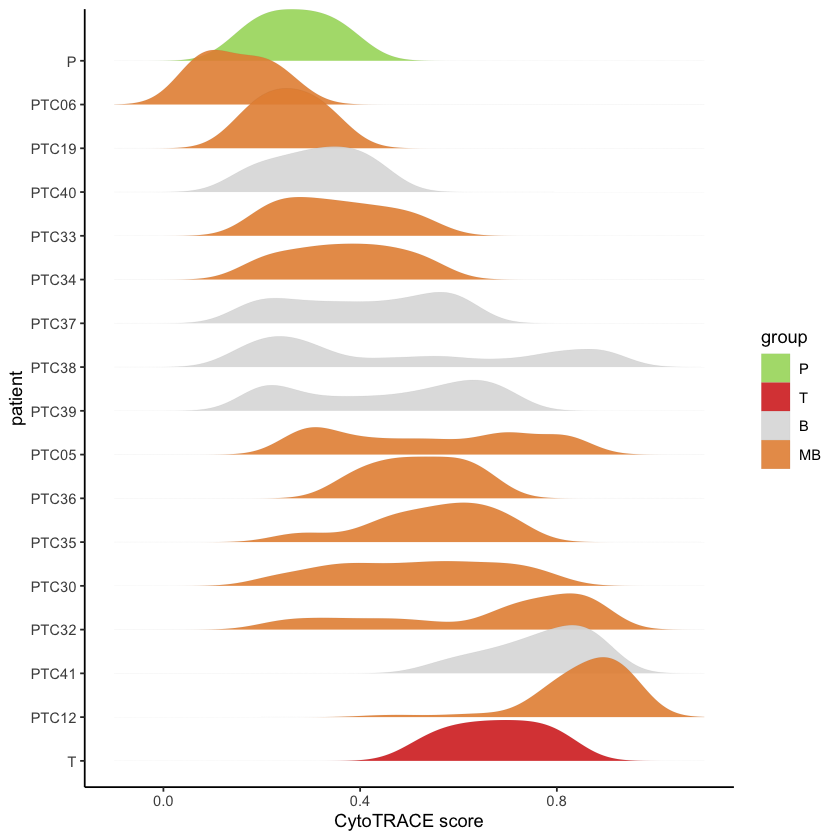

In [27]:
a=ggplot(dens_df, aes(x = x, y = patient, height = y, fill = group)) +
  geom_ridgeline(
    scale = 0.3,
    alpha = 0.9,
    color = "black",
    size=0.01
  ) +
    scale_fill_manual(values = c(tissue_colors[c('P','T')],'B'="#dddddd", 'MB'='#E69042' ))+
  labs(x='CytoTRACE score', y='patient')+
  theme_classic() 
a
ggsave(glue('{output_dir}/Cytotrace_ridge.pdf'), plot = a,  
       width=70, height=80, units='mm', dpi = 450, bg = 'transparent')

In [28]:
kruskal_res <- rstatix::kruskal_test(cytotrace_score ~ patient, data = tmp_data)


In [29]:
kruskal_res

,.y.,n,statistic,df,p,method
,<chr>,<int>,<dbl>,<int>,<dbl>,<chr>
1,cytotrace_score,140153,51185.83,16,0,Kruskal-Wallis


In [115]:
eta2_res <- rstatix::eta_squared(aov(cytotrace_score ~ patient, data = tmp_data))
eta2_res

patient 
0.7977591

Picking joint bandwidth of 0.0328

Warning message:
“Removed 69890 rows containing non-finite values (stat_density_ridges).”


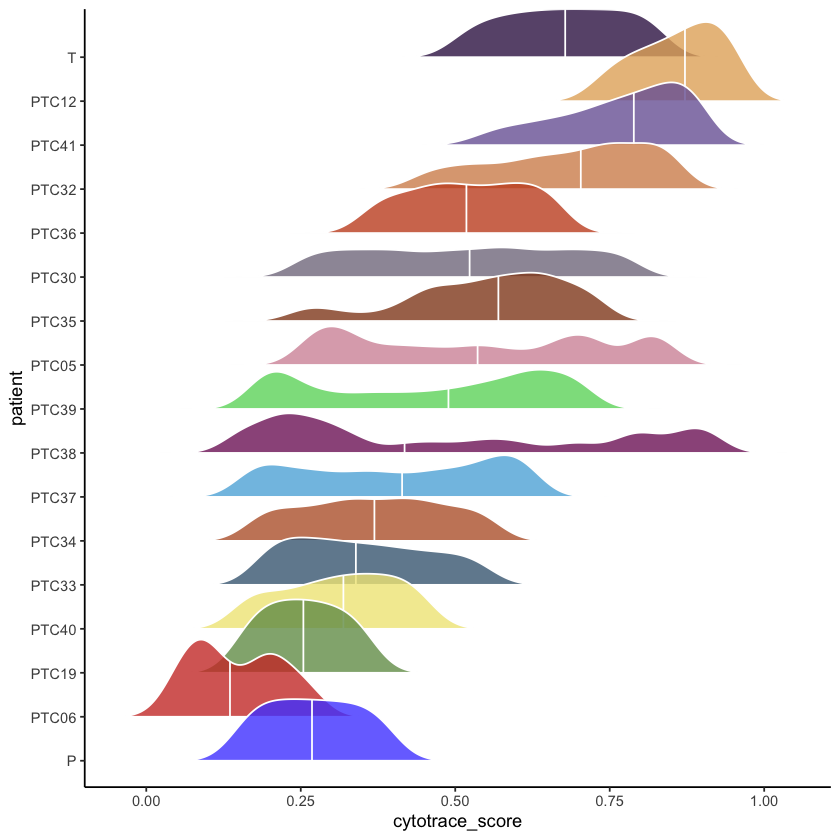

In [67]:
tmp_data %>%
  mutate(patient=factor(patient, patient_levels)) %>%
    ggplot(aes(x=cytotrace_score, y=patient, fill = patient))+
    geom_density_ridges2(scale = 1.8, #rel_min_height = 0.1,bw = 0.2,  
      quantile_lines= TRUE,quantiles= 2, color='white', alpha=0.8)+
    scale_fill_igv()+
    theme_classic()+
    theme(legend.position = 'none')

`summarise()` has grouped output by 'group', 'orig.ident'. You can override using the `.groups` argument.
Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 5 rows containing non-finite values (stat_signif).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”
Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 5 rows containing non-finite values (stat_signif).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”


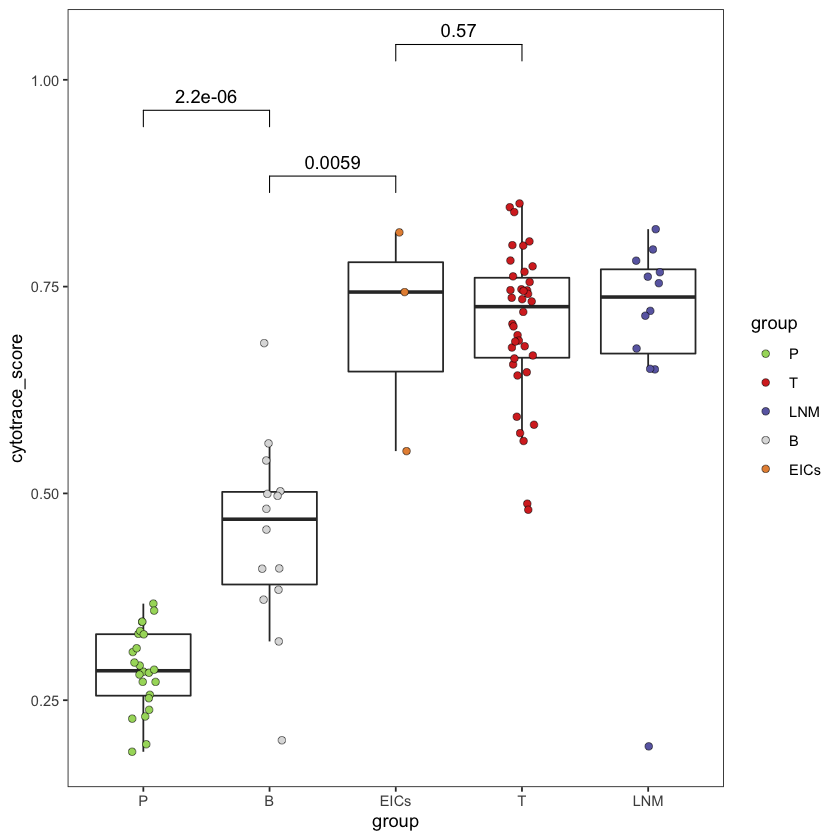

In [54]:
a=srt@meta.data %>%
  filter(!bc%in%filter_bc2) %>%
  #filter(Tissue_desc=="B")%>%
  mutate(group=as.vector(group)) %>%
  mutate(group=ifelse(group=='LN_M', 'LNM', group)) %>%
  mutate(group=ifelse(group=='MB', 'B', group)) %>%
  filter(patient!='PTC19')%>%
  group_by(group, orig.ident, patient) %>%
  summarise(cytotrace_score = mean(cytotrace_score)) %>%
  as.data.frame() %>%
  mutate(group=factor(group, c('P','B','MB','EICs','T', 'LNM'))) %>%
  ggplot(aes(x=group, y=cytotrace_score))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=group),width = 0.1,size=2, shape=21, stroke=0.2)+
  #scale_fill_manual(values = c('P'='#A6D96A', 'B'="#A6D96A",'MB'="#dddddd", 'EICs'='#E69042', 'T'="#D73027"))+
  scale_fill_manual(values = c(tissue_colors[c('P','T')],'LNM'='#6A6AB1','B'="#dddddd", 'EICs'='#E69042' ))+
  
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'B'),c('B', 'P'),c('T', 'EICs')),
   method = 'wilcox.test', method.args = list(alternative='greater'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_Cytotrace_ratio_box3.pdf'), plot = a,  
       width=4.5, height=4, dpi = 450, bg = 'transparent')


`summarise()` has grouped output by 'Type'. You can override using the
`.groups` argument.


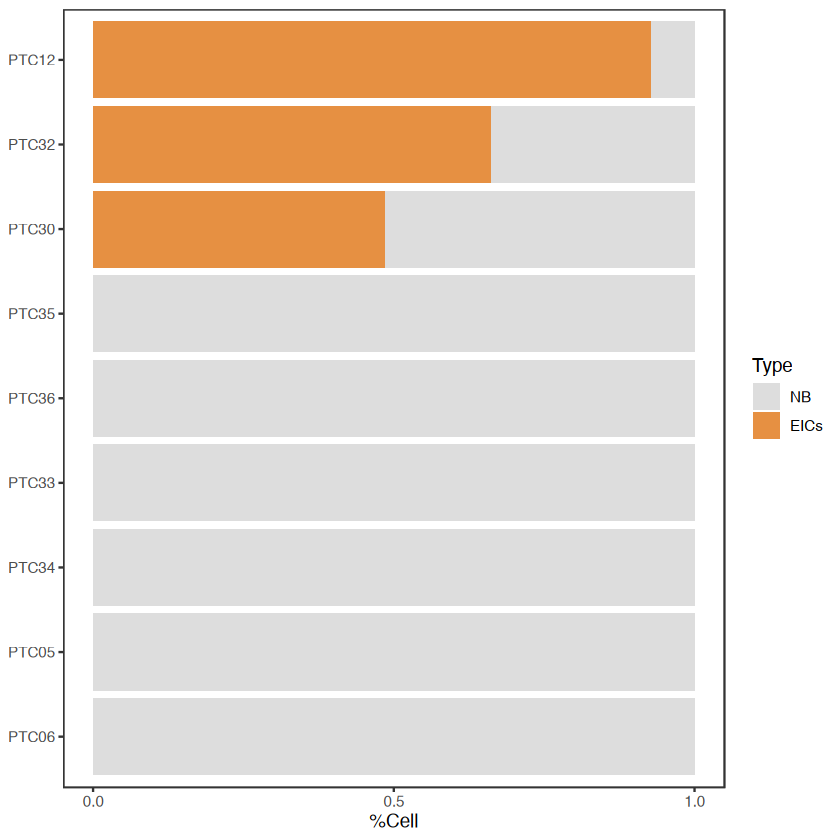

In [20]:

a=srt_B@meta.data%>%
  filter(!is.na(Type)) %>%
  group_by(Type, patient) %>%
  summarise(n=n()) %>%
  mutate(patient=factor(patient, rev(c("PTC12", "PTC32","PTC30",  "PTC35", "PTC36" ,"PTC33", "PTC34", "PTC05", "PTC06")))) %>%
  mutate(Type=factor(Type, c('NB','EICs'))) %>%
  ggplot(aes(x=patient, y=n, fill=Type))+
  geom_bar(stat='identity', position = 'fill')+
  scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  scale_y_continuous(breaks = c(0,0.5,1))+
  labs(y='%Cell')+
  theme_bw()+
  theme(panel.grid = element_blank(),
        axis.title.y = element_blank())+
  coord_flip()
a
ggsave(glue('{output_dir}/EIC_patient_distribution.pdf'), plot = a,  
       width=2.2, height=2, dpi = 450, bg = 'transparent')

## function评分

`summarise()` has grouped output by 'Type', 'orig.ident'. You can override using the `.groups` argument.


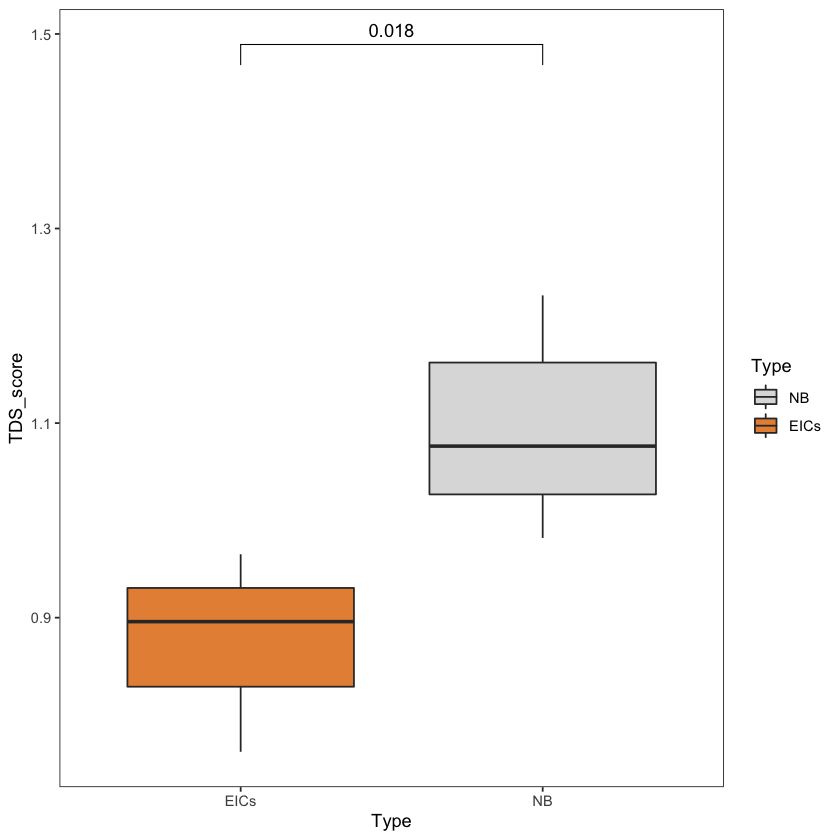

In [42]:

a=srt_B@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  group_by(Type, orig.ident, patient) %>%
  summarise(TDS_score = mean(TDS_score)) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=TDS_score))+
  geom_boxplot(aes(fill=Type),alpha=1, outlier.shape = NA)+
  # geom_jitter(aes(fill=patient),width = 0.2,size=4, shape=21, stroke=0.2)+
  # scale_fill_manual(values = c('PTC05'="#837B8DFF", 'PTC06'="#802268FF",
  #                              'PTC12'='#0099CCFF', 'PTC30'='#33CC00FF',
  #                              'PTC32'='#D595A7FF', 'PTC33'='#CDDEB7FF',
  #                              'PTC34'='#AE1F63FF', 
  #                              'PTC35'="#E7C76FFF", 'PTC36'="#0A47FFFF"))+
  # scale_fill_igv()+
  scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 'wilcox.test', method.args = list(alternative='less')
                     )+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_TDS比较.pdf'), plot = a,  
       width=4, height=4, dpi = 450, bg = 'transparent')

In [55]:
tmp_srt = readRDS('../output/clean_rds/97_sample_epithelial_mapping.rds')
DefaultAssay(tmp_srt) = 'RNA'
tmp_srt = subset(tmp_srt, Tissue_desc=='B')
tmp_srt[['Type']] = 'B'
tmp_srt@meta.data[colnames(srt_B), 'Type'] = srt_B$Type

In [ ]:
tmp_srt

An object of class Seurat 
53145 features across 29454 samples within 4 assays 
Active assay: RNA (30077 features, 0 variable features)
 2 layers present: counts, data
 3 other assays present: SCT, integrated, prediction.score.ref_data
 1 dimensional reduction calculated: umap

In [ ]:
tmp_srt = AddModuleScore(tmp_srt, features = list(TDS_marker, BRAF_marker, RAS_marker), name=c('tds', 'braf', 'raf'))

Warning message:
“The following features are not present in the object: ANXA2P2, not searching for symbol synonyms”


In [ ]:
tmp_score = tmp_srt@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  group_by(Type, orig.ident, patient) %>%
  summarise(TDS_score = mean(tds1),
            BRAF_score = mean(braf2),
            RAS_score = mean(raf3)) %>%
  as.data.frame()


tmp_score = tmp_srt@meta.data[, c('tds1', 'braf2', 'raf3', 'Type','Tissue_desc', 'orig.ident', 'patient')]
colnames(tmp_score) = c('TDS_score', 'BRAF_score', 'RAS_score', 'Type', 'Tissue_desc', 'orig.ident', 'patient')
tmp_score$batch = tmp_score$Type
#tmp_score$batch[tmp_score$Type=='NB'] = 'NB'
tmp_score$batch[tmp_score$patient=='PTC38'] = 'PTC38'


`summarise()` has grouped output by 'Type', 'orig.ident'. You can override using the `.groups` argument.


In [ ]:
tmp_score_cor = tmp_score[tmp_score$Type!='EICs',]

In [ ]:
thr = quantile(tmp_score_cor[tmp_score_cor$Type=='B', 'TDS_score'],0.25)
thr

25% 
0.4392631

In [ ]:
tmp_score_cor = tmp_score_cor %>% filter(!(Type=='B' & TDS_score<thr))
tmp_score_cor = tmp_score_cor %>% filter(!(Type=='NB' & TDS_score<0.9))
tmp_score_cor[tmp_score_cor$Type=='NB', 'TDS_score'] = tmp_score_cor[tmp_score_cor$Type=='NB', 'TDS_score']+0.5


In [ ]:
library(sva)
tmp_score_cor_corrected <- ComBat(dat = t(tmp_score_cor[,c('TDS_score', 'BRAF_score', 'RAS_score')]),
                              batch = tmp_score_cor$batch)

Loading required package: mgcv

Warning message:
“package ‘mgcv’ was built under R version 4.2.3”
Loading required package: nlme

Warning message:
“package ‘nlme’ was built under R version 4.2.2”

Attaching package: ‘nlme’


The following object is masked from ‘package:dplyr’:

    collapse


This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

Loading required package: genefilter


Attaching package: ‘genefilter’


The following object is masked from ‘package:ComplexHeatmap’:

    dist2


Loading required package: BiocParallel

Found3batches

Adjusting for0covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data




In [ ]:
tmp_score_cor[,c('TDS_score', 'BRAF_score', 'RAS_score')] = t(tmp_score_cor_corrected)

In [ ]:
tmp_score_new = rbind(tmp_score[tmp_score$Type!='B',], tmp_score_cor[tmp_score_cor$Type=='B',])

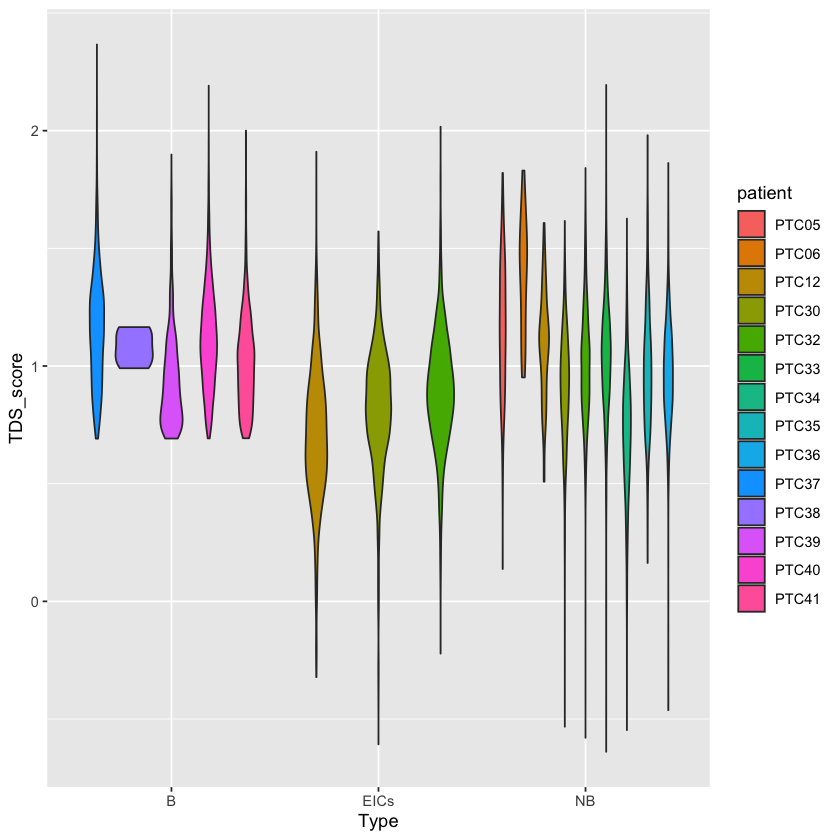

In [ ]:
tmp_score_new %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  ggplot(aes(x=Type, y=TDS_score, fill=patient))+
  geom_violin()

In [ ]:
tmp_score_new = tmp_score_new %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  group_by(Type, orig.ident, patient) %>%
  summarise(TDS_score = mean(TDS_score),
            BRAF_score = mean(BRAF_score),
            RAS_score = mean(RAS_score)) %>%
  as.data.frame()
tmp_score_new

`summarise()` has grouped output by 'Type', 'orig.ident'. You can override using the `.groups` argument.


Type,orig.ident,patient,TDS_score,BRAF_score,RAS_score
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
B,TC063_B,PTC37,1.1509461,-0.014517811,0.074839541
B,TC064_B,PTC38,1.0797170,-0.007328601,0.007315771
B,TC065_B,PTC39,0.9393608,0.014731619,0.060747995
B,TC066_B,PTC40,1.1154880,-0.019892303,-0.013161825
B,TC068_B,PTC41,1.0156043,0.022563457,-0.028655785
EICs,TC028_T3,PTC12,0.7019949,0.005573492,0.039626488
EICs,TC045_B,PTC30,0.8174249,-0.013445074,-0.044527971
EICs,TC047_B,PTC32,0.8905692,-0.003640345,0.074932524
NB,TC014_T2,PTC05,1.1641526,-0.013936230,0.027755371


In [56]:
write.csv(tmp_score_new, '../output/EIC_TDS_BRAF_RAS_score.csv', row.names = F)

In [56]:
tmp_score_new = read.csv('../output/EIC_TDS_BRAF_RAS_score.csv')


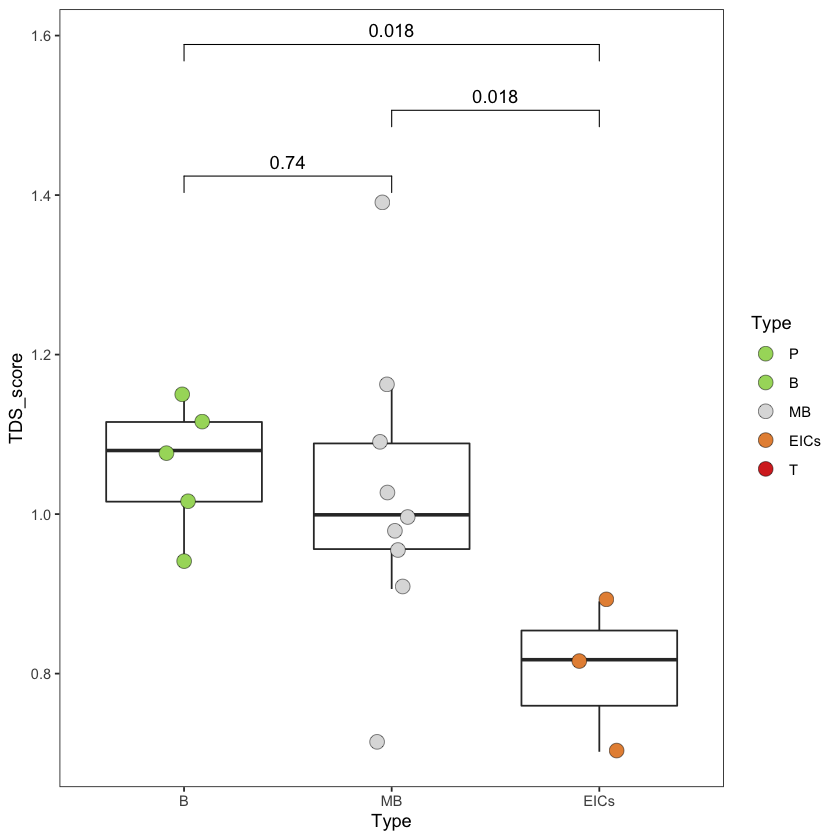

In [59]:
a=tmp_score_new%>%
  mutate(Type=ifelse(Type=='NB', 'MB', Type)) %>%
  mutate(Type=factor(Type, c('B','MB','EICs'))) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=TDS_score))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=Type),width = 0.1,size=4, shape=21, stroke=0.2)+
  scale_fill_manual(values = c('P'='#A6D96A', 'B'="#A6D96A",'MB'="#dddddd", 'EICs'='#E69042', 'T'="#D73027"))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('B', 'MB'),c('EICs', 'MB'),c('EICs', 'B')), method = 'wilcox.test', method.args = list(alternative='less'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_TDS比较(box2).pdf'), plot = a,  
       width=4, height=4, dpi = 450, bg = 'transparent')

In [60]:
srt = readRDS('../output/clean_rds/97_sample_epithelial_mapping.rds')

In [61]:
other_sample_tds = srt@meta.data %>%
    #filter(!bc%in%filter_bc2) %>%
    group_by(Tissue_desc, orig.ident) %>%
    summarise(TDS_score=mean(TDS_score)) %>%
    filter(!orig.ident%in%tmp_score_new$orig.ident)
colnames(other_sample_tds) = c('Type', 'orig.ident','TDS_score')
tmp_score_new2 = tmp_score_new[, c('Type', 'orig.ident','TDS_score')]
tmp_score_new2 = rbind(tmp_score_new2,other_sample_tds)

`summarise()` has grouped output by 'Tissue_desc'. You can override using the `.groups` argument.


Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 5 rows containing non-finite values (stat_signif).”


Warning message:
“Removed 5 rows containing missing values (geom_point).”
Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 5 rows containing non-finite values (stat_signif).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”


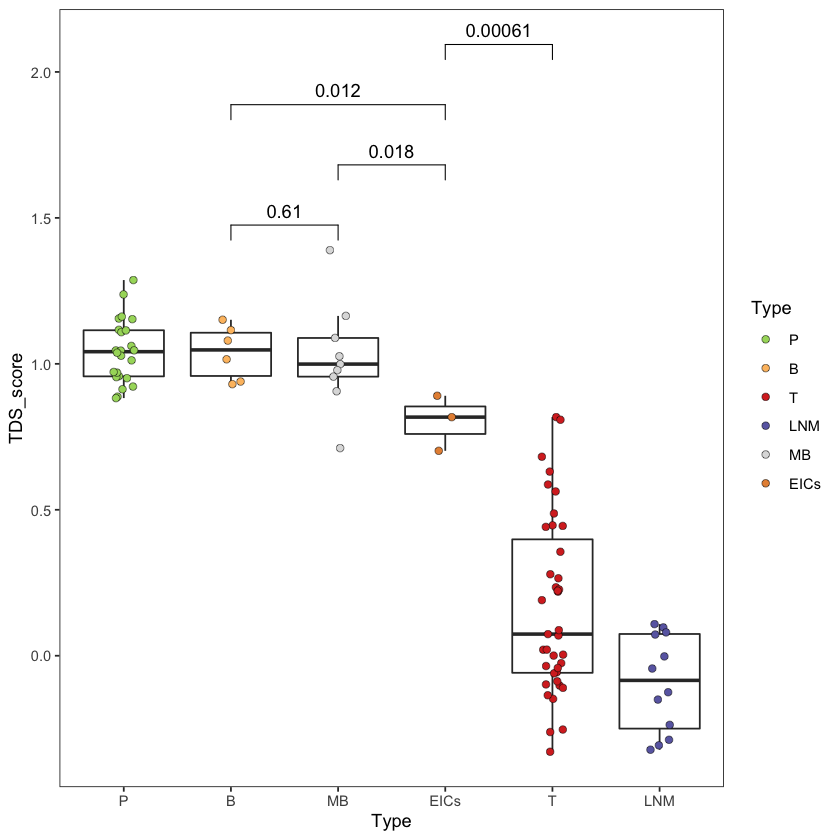

In [62]:
a=tmp_score_new2%>%
  mutate(Type=ifelse(Type=='LN_M', 'LNM', Type)) %>%
  mutate(Type=ifelse(Type=='NB', 'MB', Type)) %>%
  mutate(Type=factor(Type, c('P','B','MB','EICs','T', 'LNM'))) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=TDS_score))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=Type),width = 0.1,size=2, shape=21, stroke=0.2)+
  scale_fill_manual(values = c(tissue_colors[c('P','B','T')],'LNM'='#6A6AB1','MB'="#dddddd", 'EICs'='#E69042' ))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('B', 'MB'),c('EICs', 'MB'),c('EICs', 'B'), c('T','EICs')), 
  method = 'wilcox.test', method.args = list(alternative='less'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_TDS比较(box3).pdf'), plot = a,  
       width=4.5, height=4, dpi = 450, bg = 'transparent')

Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”


Warning message:
“Removed 5 rows containing non-finite values (stat_signif).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”
Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 5 rows containing non-finite values (stat_signif).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”


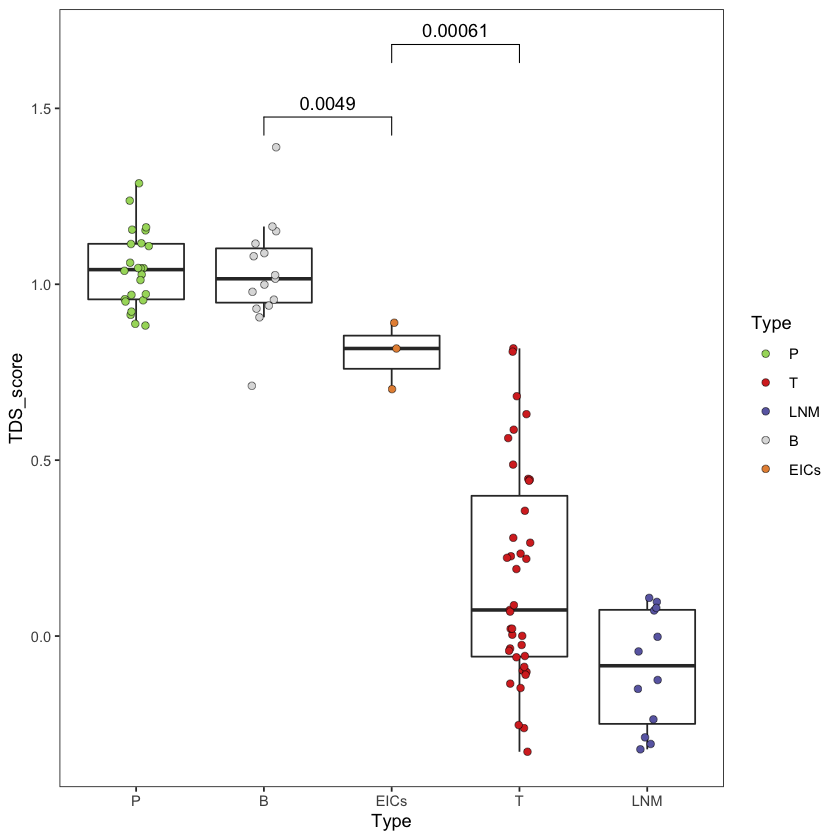

In [66]:
a=tmp_score_new2%>%
  mutate(Type=ifelse(Type=='LN_M', 'LNM', Type)) %>%
  mutate(Type=ifelse(Type=='NB', 'MB', Type)) %>%
  mutate(Type=ifelse(Type=='MB', 'B', Type))%>%
  mutate(Type=factor(Type, c('P','B','MB','EICs','T', 'LNM'))) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=TDS_score))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=Type),width = 0.1,size=2, shape=21, stroke=0.2)+
  scale_fill_manual(values = c(tissue_colors[c('P','T')],'LNM'='#6A6AB1','B'="#dddddd", 'EICs'='#E69042' ))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'B'), c('T','EICs')), 
  method = 'wilcox.test', method.args = list(alternative='less'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_TDS比较(box4).pdf'), plot = a,  
       width=4.5, height=4, dpi = 450, bg = 'transparent')

In [ ]:
mutate(group=as.vector(group)) %>%
  mutate(group=ifelse(group=='LN_M', 'LNM', group)) %>%
  filter(patient!='PTC19')%>%
  group_by(group, orig.ident, patient) %>%
  summarise(cytotrace_score = mean(cytotrace_score)) %>%
  as.data.frame() %>%
  mutate(group=factor(group, c('P','B','MB','EICs','T', 'LNM'))) %>%
  ggplot(aes(x=group, y=cytotrace_score))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=group),width = 0.1,size=2, shape=21, stroke=0.2)+
  #scale_fill_manual(values = c('P'='#A6D96A', 'B'="#A6D96A",'MB'="#dddddd", 'EICs'='#E69042', 'T'="#D73027"))+
  scale_fill_manual(values = c(tissue_colors[c('P','B','T')],'LNM'='#6A6AB1','MB'="#dddddd", 'EICs'='#E69042' ))+
  

In [13]:
geneSets <- list('TDS_score'=TDS_marker, 'BRAF_score'=BRAF_marker, 'RAS_score'=RAS_marker)
cells_AUCell <- AUCell_calcAUC(geneSets, only_b_mat$cells_rankings, nCores = 10)
auc_matrix <- as.data.frame(getAUC(cells_AUCell))

Using 3 cores with doMC.

Genes in the gene sets NOT available in the dataset: 
	BRAF_score: 	1 (2% of 58)



In [15]:
files = c(
  'TC063_B',
  'TC064_B',
  'TC065_B',
  'TC066_B',
  'TC068_B'
)
auc_matrix[, files]

,TC063_B,TC064_B,TC065_B,TC066_B,TC068_B
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TDS_score,0.6530497,0.63398592,0.6577257,0.6728328,0.6601922
BRAF_score,0.1294915,0.14466845,0.1299316,0.1312519,0.1326554
RAS_score,0.1040543,0.09711731,0.0995324,0.1074457,0.1041570


`summarise()` has grouped output by 'Type', 'orig.ident'. You can override
using the `.groups` argument.


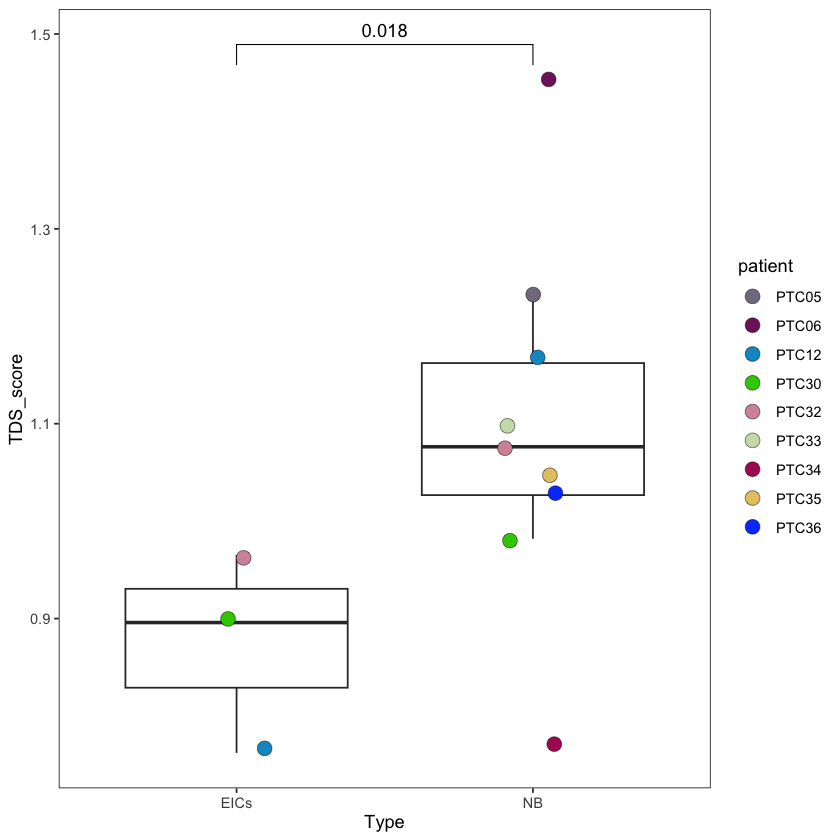

In [6]:
a=srt_B@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  group_by(Type, orig.ident, patient) %>%
  summarise(TDS_score = mean(TDS_score)) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=TDS_score))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=patient),width = 0.1,size=4, shape=21, stroke=0.2)+
  scale_fill_manual(values = c('PTC05'="#837B8DFF", 'PTC06'="#802268FF",
                               'PTC12'='#0099CCFF', 'PTC30'='#33CC00FF',
                               'PTC32'='#D595A7FF', 'PTC33'='#CDDEB7FF',
                               'PTC34'='#AE1F63FF', 
                               'PTC35'="#E7C76FFF", 'PTC36'="#0A47FFFF",
                               'NB'='#dddddd', 'EICs'='#E69042'))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 'wilcox.test', method.args = list(alternative='less')
  )+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_TDS比较(box).pdf'), plot = a,  
       width=4, height=4, dpi = 450, bg = 'transparent')

`summarise()` has grouped output by 'Type', 'orig.ident'. You can override
using the `.groups` argument.


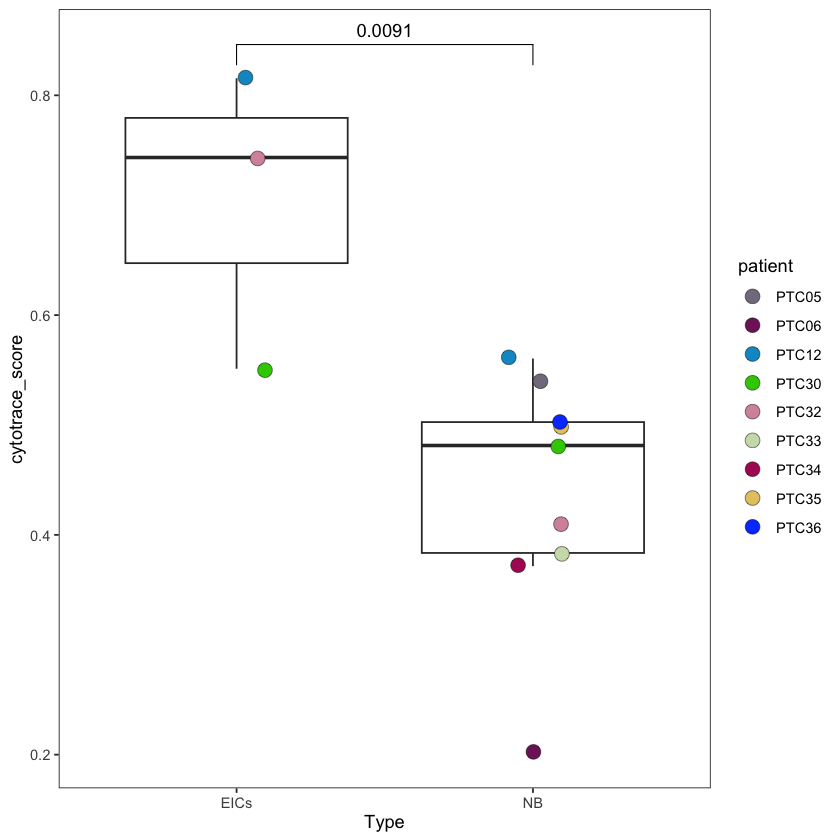

In [7]:
a=srt_B@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  group_by(Type, orig.ident, patient) %>%
  summarise(cytotrace_score = mean(cytotrace_score)) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=cytotrace_score))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=patient),width = 0.1,size=4, shape=21, stroke=0.2)+
   scale_fill_manual(values = c('PTC05'="#837B8DFF", 'PTC06'="#802268FF",
                                'PTC12'='#0099CCFF', 'PTC30'='#33CC00FF',
                                'PTC32'='#D595A7FF', 'PTC33'='#CDDEB7FF',
                                'PTC34'='#AE1F63FF', 
                                'PTC35'="#E7C76FFF", 'PTC36'="#0A47FFFF"))+
  # scale_fill_igv()+
  #scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 'wilcox.test', method.args = list(alternative='greater'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_Cytotrace_ratio_box较.pdf'), plot = a,  
       width=4, height=4, dpi = 450, bg = 'transparent')


Warning message:
“The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


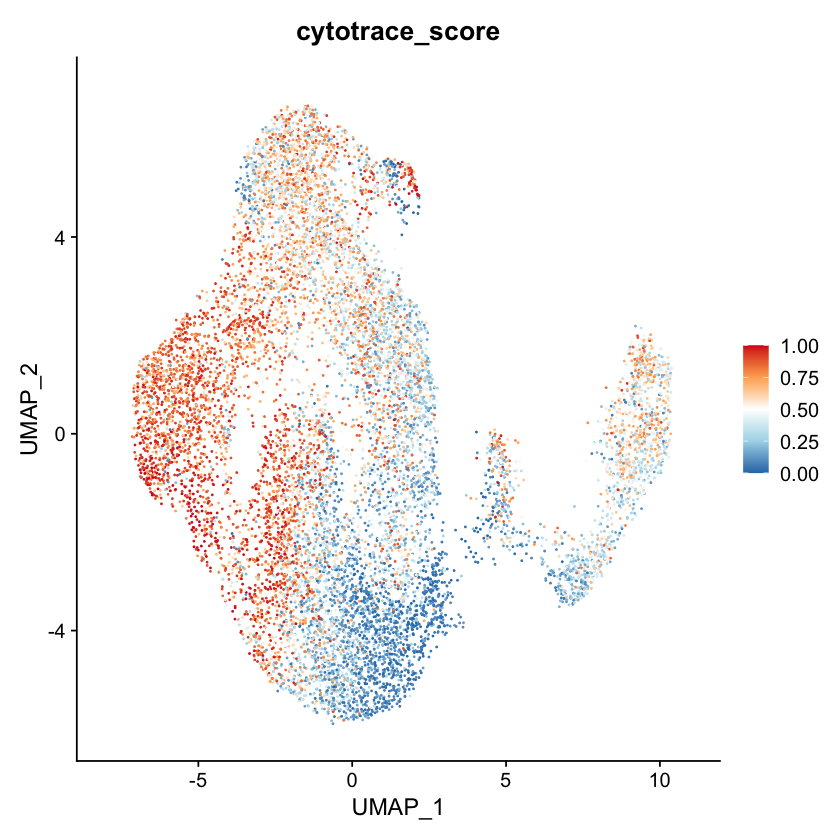

In [8]:
a=FeaturePlot(srt_B, features = 'cytotrace_score') + 
  scale_colour_gradientn(colours = c('#2C7BB6','#ABD9E9','#FFFFFF','#FDAE61','#D7191C'))
a
ggsave(glue('{output_dir}/EIC_Cytotrace_UMAP.pdf'),a, width=4, height=3.5)


`summarise()` has grouped output by 'Type', 'orig.ident'. You can override
using the `.groups` argument.
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


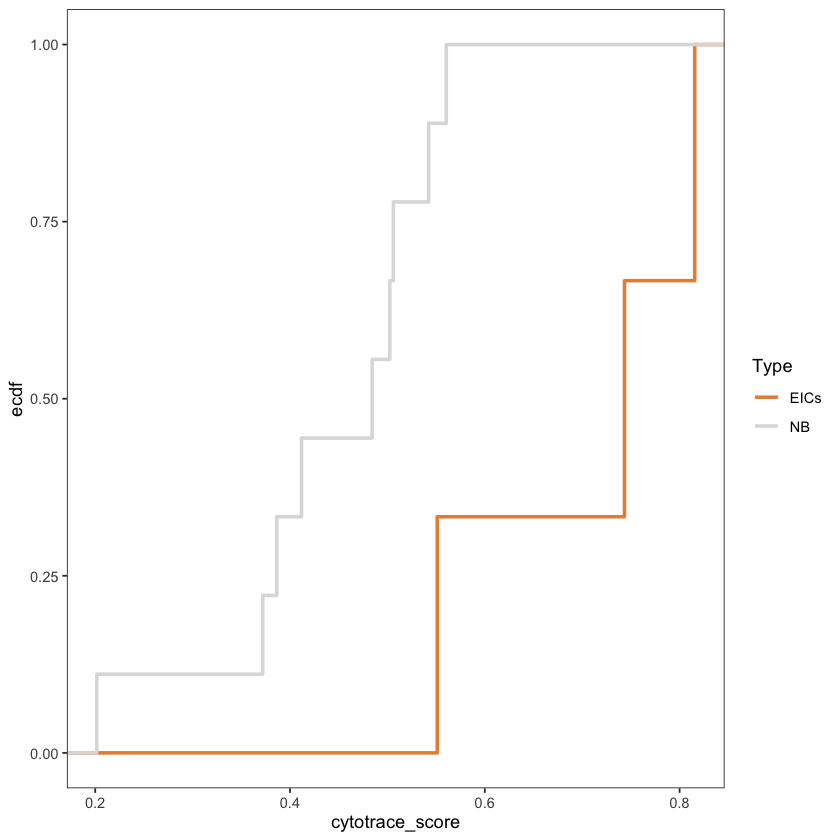

In [9]:
srt_B@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  group_by(Type, orig.ident, patient) %>%
  summarise(cytotrace_score = mean(cytotrace_score)) %>%
  as.data.frame() %>%
  ggplot(aes(color=Type, x=cytotrace_score))+
 # geom_density(bw=0.05)+
  stat_ecdf(geom = "step", size = 1, n=100) +
  #geom_boxplot(aes(color=Type),alpha=1, outlier.shape = NA)+
  #geom_jitter(aes(fill=patient),width = 0.2,size=4, shape=21, stroke=0.2)+
  # scale_fill_igv()+
  scale_color_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  theme_bw()+
  #stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 'wilcox.test', method.args = list(alternative='greater'))+
  theme(panel.grid = element_blank())

## TDS

Warning message in geom_violin(aes(fill = Type), alpha = 1, outlier.shape = NA):
“Ignoring unknown parameters: `outlier.shape`”
Warning message:
“Removed 76 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message:
“Removed 76 rows containing non-finite outside the scale range
(`stat_boxplot()`).”
Warning message:
“Removed 76 rows containing non-finite outside the scale range
(`stat_signif()`).”
Warning message:
“Removed 76 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message:
“Removed 76 rows containing non-finite outside the scale range
(`stat_boxplot()`).”
Warning message:
“Removed 76 rows containing non-finite outside the scale range
(`stat_signif()`).”


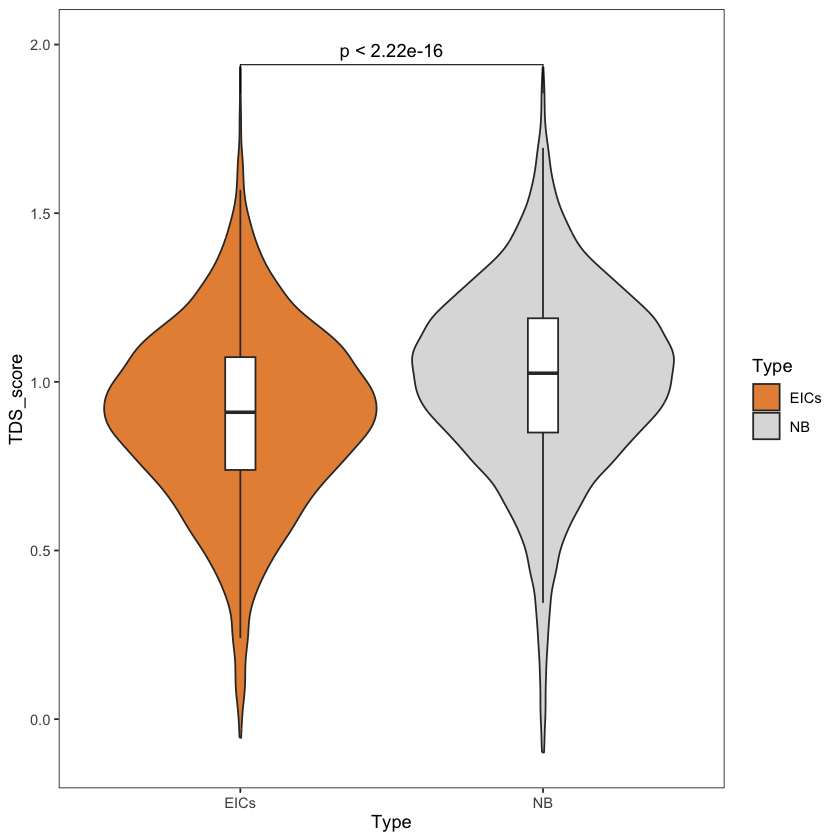

In [10]:
a=srt_B@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  ggplot(aes(x=Type, y=TDS_score))+
  geom_violin(aes(fill=Type),alpha=1, outlier.shape = NA)+
  geom_boxplot(width=0.1, outlier.shape = NA)+
  #geom_jitter(aes(fill=patient),width = 0.2,size=4, shape=21, stroke=0.2)+
  scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  labs(y='TDS_score')+
  lims(y=c(-0.1,2))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 't.test', label.y = 1.8)+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_TDS比较单细胞水平.pdf'), plot = a,  
       width=4, height=4, dpi = 450, bg = 'transparent')


Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”


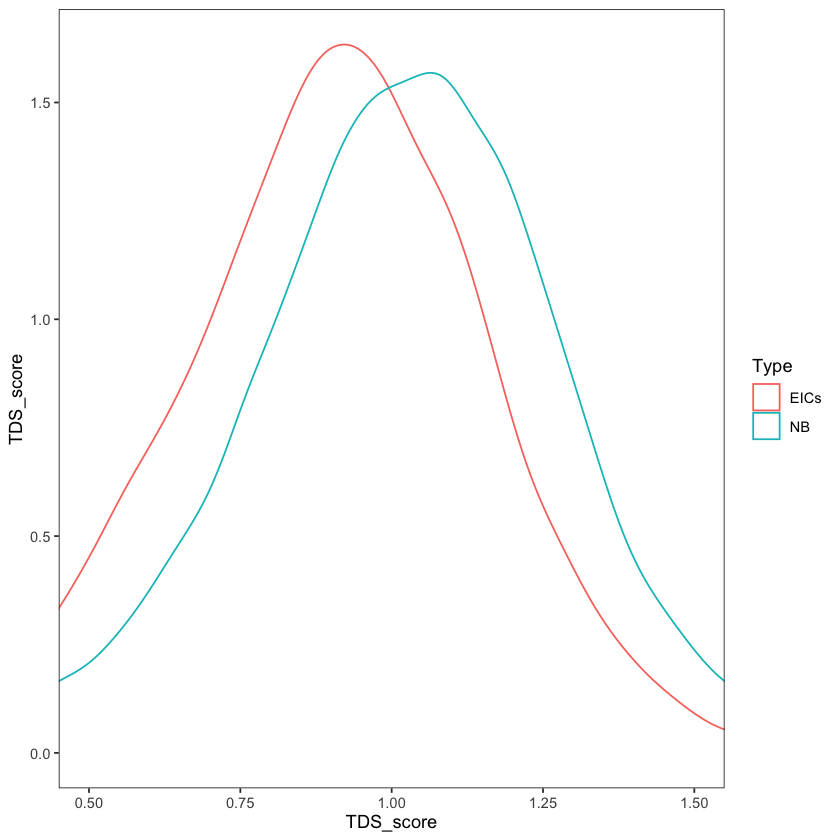

In [11]:
a=srt_B@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  ggplot(aes(x=TDS_score,color=Type))+
  geom_density()+
  #geom_jitter(aes(fill=patient),width = 0.2,size=4, shape=21, stroke=0.2)+
  scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  labs(y='TDS_score')+
  coord_cartesian(xlim = c(0.5, 1.5))+ 
  #lims(x=c(0.5,1.5))+
  theme_bw()+
  #stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 't.test', label.y = 1.8)+
  theme(panel.grid = element_blank())
a

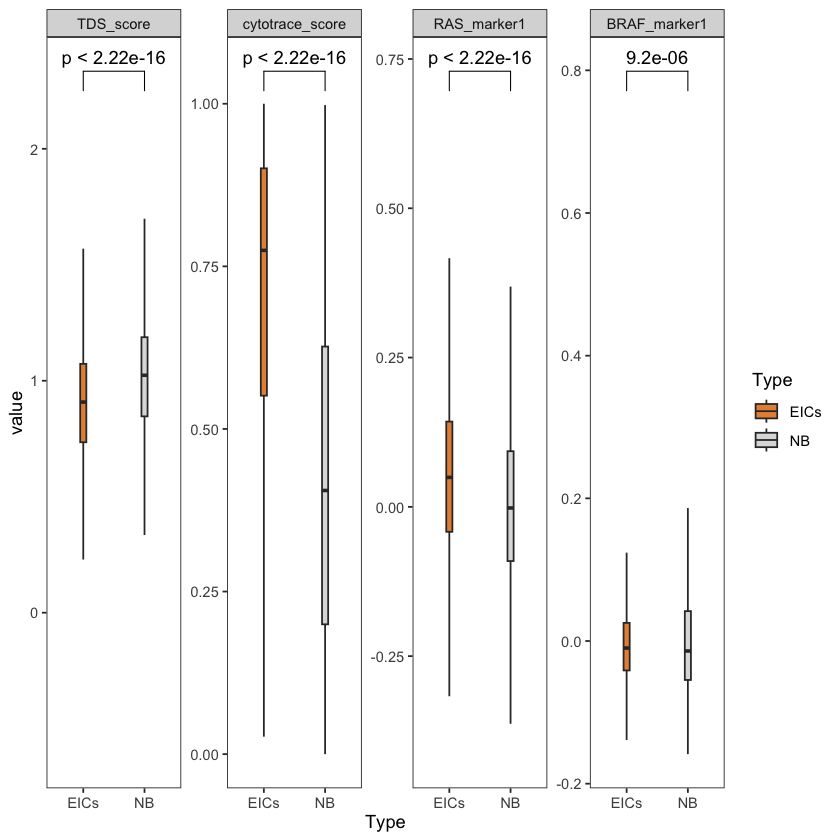

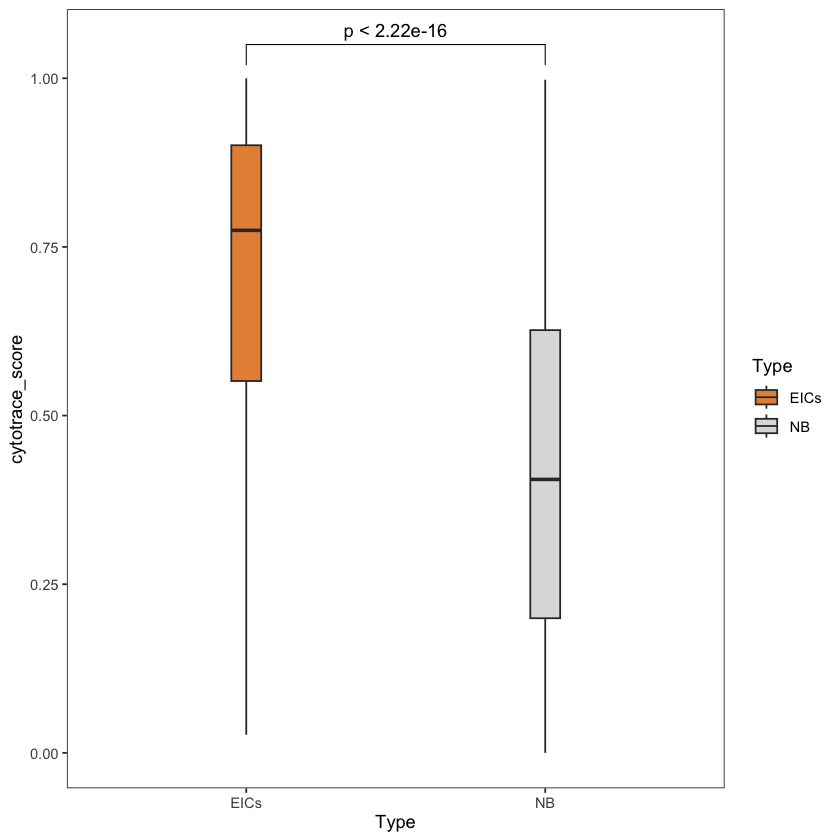

In [13]:
srt_B@meta.data[,c('patient', 'Type', 'TDS_score', 'cytotrace_score', 
                   'RAS_marker1', 'BRAF_marker1')] %>%
  reshape2::melt(id=c('patient', 'Type')) %>%
  ggplot(aes(x=Type, y=value))+
  geom_boxplot(aes(fill=Type),width=0.1, outlier.shape = NA)+
  scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  facet_wrap(~variable, scales = 'free_y', nrow=1)+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 't.test')+
  theme(panel.grid = element_blank())

a=srt_B@meta.data %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  ggplot(aes(x=Type, y=cytotrace_score))+
  #geom_violin(aes(fill=Type),alpha=1,  bw=0.3)+
  geom_boxplot(aes(fill=Type),width=0.1, outlier.shape = NA)+
  #geom_jitter(aes(fill=patient),width = 0.2,size=4, shape=21, stroke=0.2)+
  scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  labs(y='cytotrace_score')+
  #lims(y=c(-0.1,2))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 't.test')+
  theme(panel.grid = element_blank())
a

## C4&C5

In [67]:
ph_marker = read.table('../output/87sampleEpithelial_P_markers.csv', sep=',')
C4_marker = ph_marker %>% filter(cluster=='C4_SPARC',p_val_adj<0.05, avg_log2FC>0) %>% arrange(-avg_log2FC)
C5_marker = ph_marker %>% filter(cluster=='C5_HLA-DRA',p_val_adj<0.05, avg_log2FC>0) %>% arrange(-avg_log2FC)

In [68]:
tmp_srt = readRDS('../output/clean_rds/97_sample_epithelial_mapping.rds')
DefaultAssay(tmp_srt) = 'RNA'
tmp_srt = subset(tmp_srt, Tissue_desc=='B')
tmp_srt[['Type']] = 'B'
tmp_srt@meta.data[colnames(srt_B), 'Type'] = srt_B$Type

In [69]:
colnames(tmp_srt@meta.data)

[1] "orig.ident"                         "nCount_RNA"                        
 [3] "nFeature_RNA"                       "percent.mt"                        
 [5] "patient"                            "Tissue_desc"                       
 [7] "Sex"                                "Age_at_diagnosis_years"            
 [9] "Tumor_metastasis"                   "LN_metastasis"                     
[11] "Extrathyroidal_extension"           "Laterality"                        
[13] "Multifocality"                      "Tumor_size"                        
[15] "AJCC_TNM_stage"                     "Coexisting_HT"                     
[17] "sample_id"                          "seurat_clusters"                   
[19] "Cluster"                            "sub_cluster"                       
[21] "sample"                             "S.Score"                           
[23] "G2M.Score"                          "Phase"                             
[25] "CellType"                           "TDS_score"                         
[27] "KNN_pred"                           "Filter_P"                          
[29] "nCount_SCT"                         "nFeature_SCT"                      
[31] "nCount_integrated"                  "nFeature_integrated"               
[33] "nCount_prediction.score.ref_data"   "nFeature_prediction.score.ref_data"
[35] "RNA_snn_res.0.5"                    "integrated_snn_res.0.4"            
[37] "integrated_snn_res.0.5"             "RNA_snn_res.1"                     
[39] "batch"                              "RNA_snn_res.0.2"                   
[41] "test"                               "predicted.id"                      
[43] "prediction.score.C1_TPO"            "prediction.score.C2_JUN"           
[45] "prediction.score.C4_SPARC"          "prediction.score.C0_MAFF"          
[47] "prediction.score.C5_HLA.DRA"        "prediction.score.C3_MT1G"          
[49] "prediction.score.max"               "predicted.ref_data.score"          
[51] "predicted.ref_data"                 "sc3_cluster"                       
[53] "Type"

In [70]:
tmp_srt = AddModuleScore(tmp_srt, features = list(C4_marker$gene, C5_marker$gene))

In [71]:
tmp_d = AverageExpression(tmp_srt, features = C4_marker$gene, group.by = 'Type', assays = 'RNA')$RNA


In [72]:
tmp_gene_filter = rownames(tmp_d)[tmp_d[,2]>tmp_d[,3]]

In [ ]:
# tmp_srt = AddModuleScore(tmp_srt, features = list(tmp_gene_filter, C5_marker$gene))

In [73]:
tmp_srt = readRDS('../output/clean_rds/97_sample_epithelial_mapping.rds')
DefaultAssay(tmp_srt) = 'RNA'
tmp_srt = AddModuleScore(tmp_srt, features = list(tmp_gene_filter, C5_marker$gene))


In [74]:
tmp_srt[['Type']] = tmp_srt$Tissue_desc
tmp_srt@meta.data[colnames(srt_B), 'Type'] = srt_B$Type

Warning message:
“Ignoring unknown parameters: outlier.shape”


Warning message:
“Computation failed in `stat_signif()`:
not enough 'y' observations”


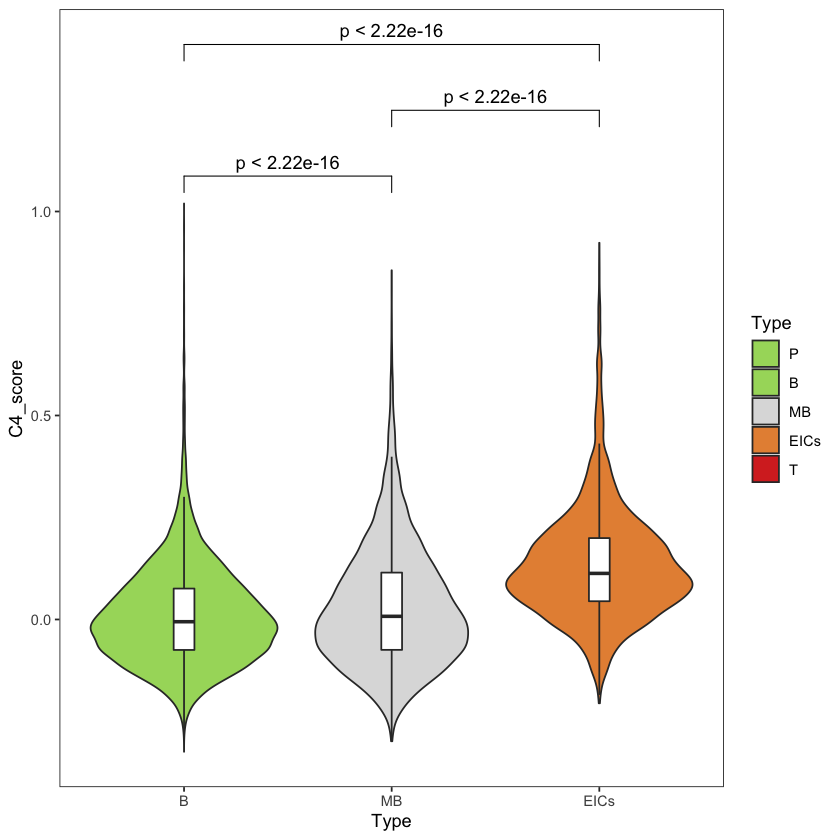

In [75]:
a=tmp_srt@meta.data %>%
    filter(Tissue_desc=="B")%>%
    filter(patient!='PTC19')%>%
    mutate(Type = ifelse(Type=='NB', 'MB', Type)) %>%
    mutate(Type=factor(Type, c('B','MB','EICs'))) %>%
    ggplot(aes(x=Type, y=Cluster1))+
    geom_violin(aes(fill=Type),alpha=1, outlier.shape = NA)+
    geom_boxplot(width=0.1, outlier.shape = NA)+
    scale_fill_manual(values = c('P'='#A6D96A', 'B'="#A6D96A",'MB'="#dddddd", 'EICs'='#E69042', 'T'="#D73027"))+
    stat_compare_means(comparisons = list(c('B', 'MB'),c('EICs', 'MB'),c('EICs', 'B')), method = 'wilcox.test')+
    labs(y='C4_score')+
    #lims(y=c(-0.2,0.4))+
    theme_bw()+
    stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 't.test')+
    theme(panel.grid = element_blank())
a
#ggsave(glue('{output_dir}/EIC_C4比较单细胞水平2.pdf'), plot = a,  
#       width=4, height=4, dpi = 450, bg = 'transparent')

`summarise()` has grouped output by 'Type'. You can override using the `.groups` argument.


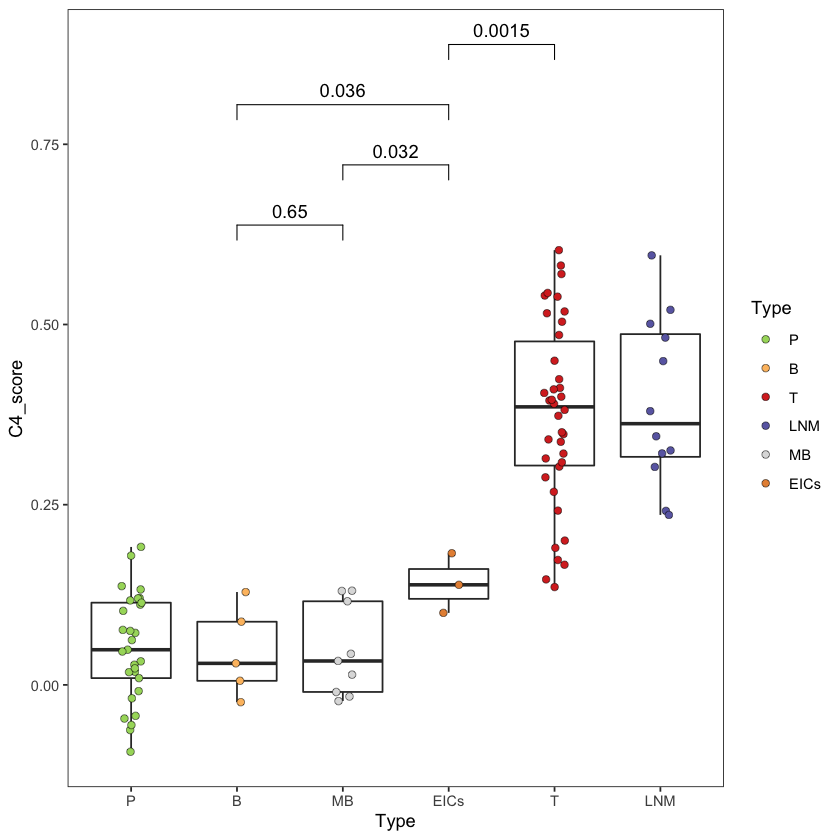

In [ ]:
a=tmp_srt@meta.data %>%
    filter(patient!='PTC19')%>%
    group_by(Type, orig.ident) %>%
    summarise(Cluster1=mean(Cluster1))%>%
  mutate(Type=ifelse(Type=='LN_M', 'LNM', Type)) %>%
  mutate(Type=ifelse(Type=='NB', 'MB', Type)) %>%
  mutate(Type=factor(Type, c('P','B','MB','EICs','T', 'LNM'))) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=Cluster1))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=Type),width = 0.1,size=2, shape=21, stroke=0.2)+
  scale_fill_manual(values = c(tissue_colors[c('P','B','T')],'LNM'='#6A6AB1','MB'="#dddddd", 'EICs'='#E69042' ))+
  theme_bw()+
  labs(y='C4_score')+
  stat_compare_means(comparisons = list(c('B', 'MB'),c('EICs', 'MB'),c('EICs', 'B'), c('T','EICs')), 
  method = 'wilcox.test', method.args = list(alternative='greater'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_C4比较单细胞水平3.pdf'), plot = a,  
       width=4.5, height=4, dpi = 450, bg = 'transparent')

`summarise()` has grouped output by 'Type'. You can override using the `.groups` argument.


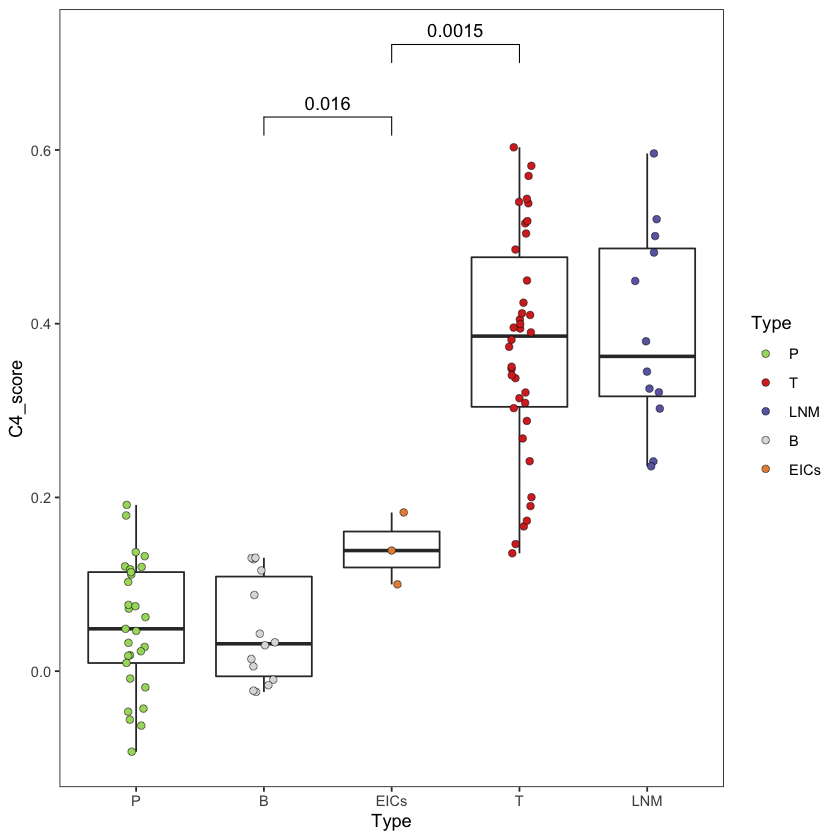

In [76]:
a=tmp_srt@meta.data %>%
    filter(patient!='PTC19')%>%
    group_by(Type, orig.ident) %>%
    summarise(Cluster1=mean(Cluster1))%>%
  mutate(Type=ifelse(Type=='LN_M', 'LNM', Type)) %>%
  mutate(Type=ifelse(Type=='NB', 'MB', Type)) %>%
    mutate(Type=ifelse(Type=='MB', 'B', Type))%>%
  mutate(Type=factor(Type, c('P','B','MB','EICs','T', 'LNM'))) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=Cluster1))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=Type),width = 0.1,size=2, shape=21, stroke=0.2)+
  scale_fill_manual(values = c(tissue_colors[c('P','T')],'LNM'='#6A6AB1','B'="#dddddd", 'EICs'='#E69042' ))+
  theme_bw()+
  labs(y='C4_score')+
  stat_compare_means(comparisons = list(c('EICs', 'B'), c('T','EICs')), 
  method = 'wilcox.test', method.args = list(alternative='greater'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_C4比较单细胞水平4.pdf'), plot = a,  
       width=4.5, height=4, dpi = 450, bg = 'transparent')

Warning message:
“Ignoring unknown parameters: outlier.shape”


Warning message:
“Computation failed in `stat_signif()`:
not enough 'y' observations”
Warning message:
“Computation failed in `stat_signif()`:
not enough 'y' observations”


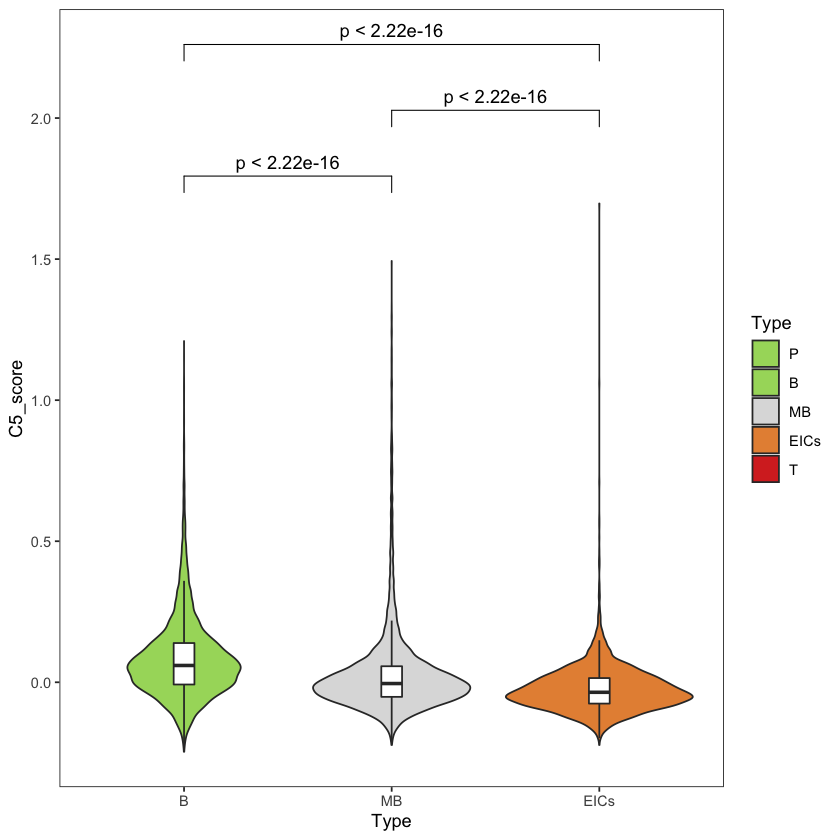

In [125]:
a=tmp_srt@meta.data %>%
    filter(Tissue_desc=="B")%>%
    filter(patient!='PTC19')%>%
    mutate(Type = ifelse(Type=='NB', 'MB', Type)) %>%
    mutate(Type=factor(Type, c('B','MB','EICs'))) %>%
    ggplot(aes(x=Type, y=Cluster2))+
    geom_violin(aes(fill=Type),alpha=1, outlier.shape = NA)+
    geom_boxplot(width=0.1, outlier.shape = NA)+
    scale_fill_manual(values = c('P'='#A6D96A', 'B'="#A6D96A",'MB'="#dddddd", 'EICs'='#E69042', 'T'="#D73027"))+
    stat_compare_means(comparisons = list(c('B', 'MB'),c('EICs', 'MB'),c('EICs', 'B')), method = 't.test')+
    labs(y='C5_score')+
    #lims(y=c(-0.1,0.5))+
    theme_bw()+
    stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 't.test')+
    theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_C5比较单细胞水平2.pdf'), plot = a,  
       width=4, height=4, dpi = 450, bg = 'transparent')


`summarise()` has grouped output by 'Type'. You can override using the `.groups` argument.


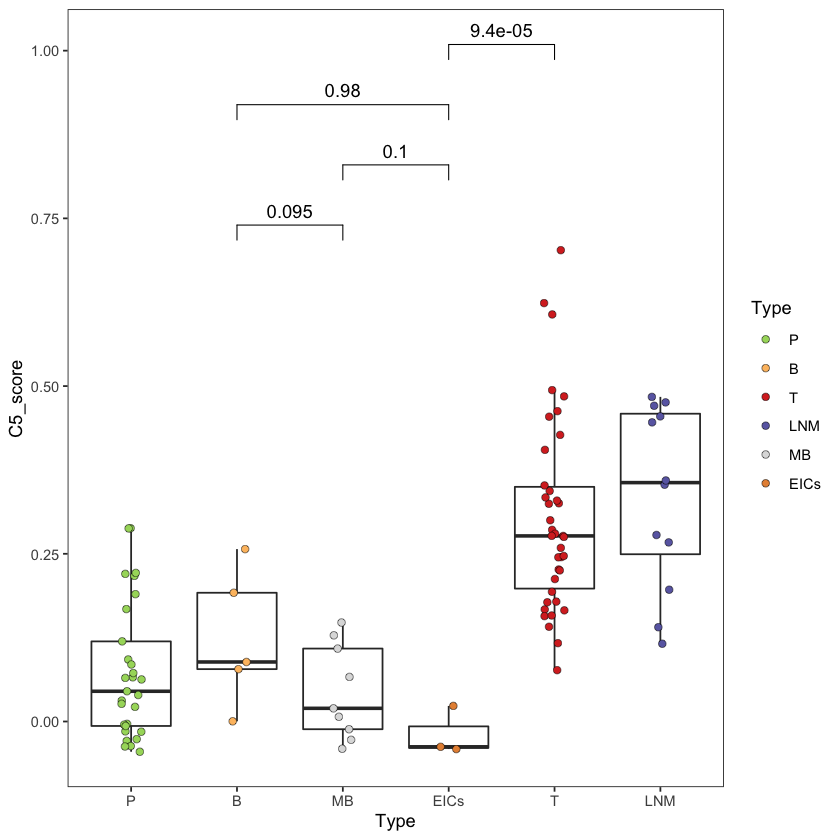

In [112]:
a=tmp_srt@meta.data %>%
    filter(patient!='PTC19')%>%
    group_by(Type, orig.ident) %>%
    summarise(Cluster2=mean(Cluster2))%>%
  mutate(Type=ifelse(Type=='LN_M', 'LNM', Type)) %>%
  mutate(Type=ifelse(Type=='NB', 'MB', Type)) %>%
  mutate(Type=factor(Type, c('P','B','MB','EICs','T', 'LNM'))) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=Cluster2))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=Type),width = 0.1,size=2, shape=21, stroke=0.2)+
  scale_fill_manual(values = c(tissue_colors[c('P','B','T')],'LNM'='#6A6AB1','MB'="#dddddd", 'EICs'='#E69042' ))+
  theme_bw()+
  labs(y='C5_score')+
  stat_compare_means(comparisons = list(c('B', 'MB'),c('MB','EICs'),c('EICs', 'B'), c('T','EICs')), 
  method = 'wilcox.test', method.args = list(alternative='greater'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_C5比较单细胞水平3.pdf'), plot = a,  
       width=4.5, height=4, dpi = 450, bg = 'transparent')

`summarise()` has grouped output by 'Type'. You can override using the `.groups` argument.


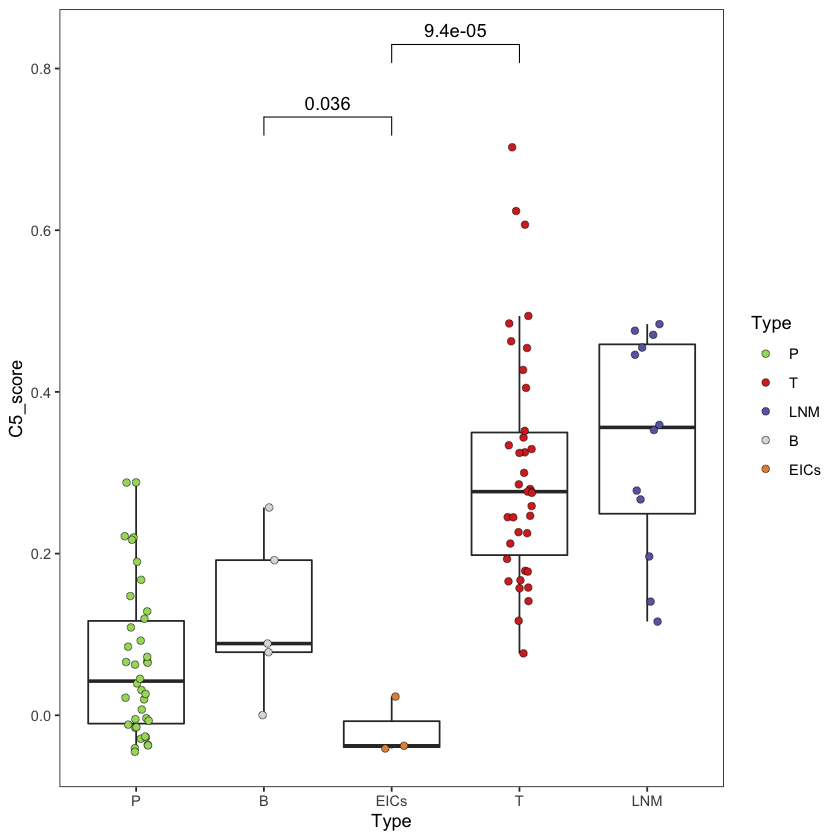

In [79]:
a=tmp_srt@meta.data %>%
    filter(patient!='PTC19')%>%
    group_by(Type, orig.ident) %>%
    summarise(Cluster2=mean(Cluster2))%>%
  mutate(Type=ifelse(Type=='LN_M', 'LNM', Type)) %>%
  mutate(Type=ifelse(Type=='NB', 'MB', Type)) %>%
  mutate(Type=ifelse(Type=='MB', 'P', Type)) %>%
  
  mutate(Type=factor(Type, c('P','B','MB','EICs','T', 'LNM'))) %>%
  as.data.frame() %>%
  ggplot(aes(x=Type, y=Cluster2))+
  geom_boxplot(aes(),alpha=1, outlier.shape = NA)+
  geom_jitter(aes(fill=Type),width = 0.1,size=2, shape=21, stroke=0.2)+
  scale_fill_manual(values = c(tissue_colors[c('P','T')],'LNM'='#6A6AB1','B'="#dddddd", 'EICs'='#E69042' ))+
  theme_bw()+
  labs(y='C5_score')+
  stat_compare_means(comparisons = list(c('B','EICs'), c('T','EICs')), 
  method = 'wilcox.test', method.args = list(alternative='greater'))+
  theme(panel.grid = element_blank())
a
ggsave(glue('{output_dir}/EIC_C5比较单细胞水平4.pdf'), plot = a,  
       width=4.5, height=4, dpi = 450, bg = 'transparent')

Warning message in geom_violin(aes(fill = Type), alpha = 1, outlier.shape = NA):
“Ignoring unknown parameters: `outlier.shape`”


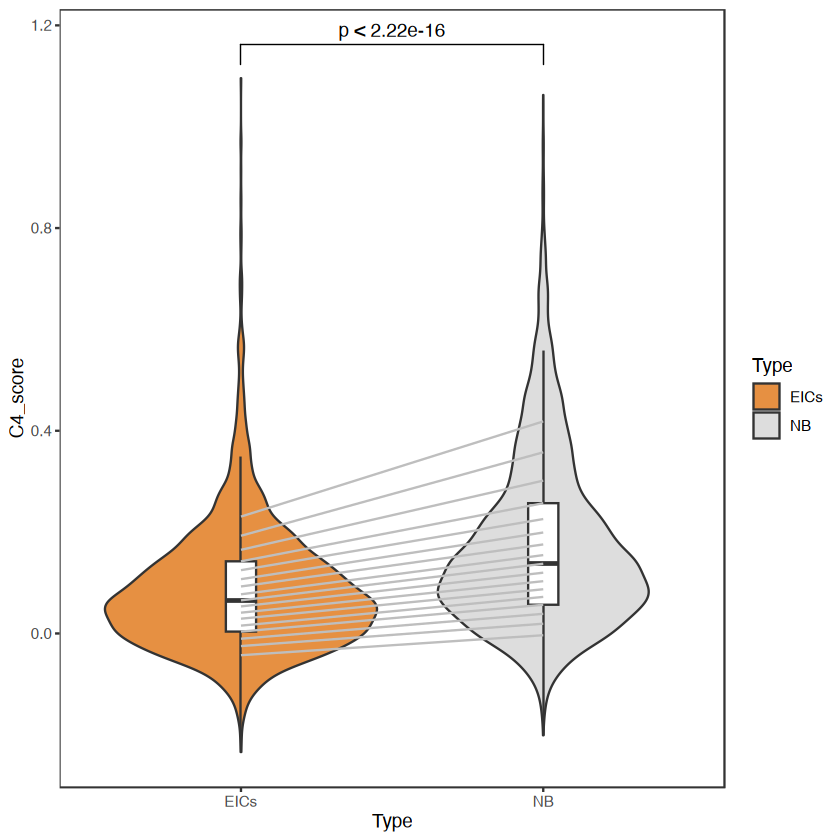

In [183]:
d1 = tmp_srt@meta.data%>%filter(Type=='EICs')# %>% filter(Cluster1>-0.1,Cluster1<0.4)
d2 = tmp_srt@meta.data%>%filter(Type=='NB') #%>% filter(Cluster1>-0.1,Cluster1<0.4)

dd = cbind(quantile(d1$Cluster1, probs = seq(0.1,0.9,0.05)),
           quantile(d2$Cluster1, probs = seq(0.1,0.9,0.05)))
colnames(dd) = c('EICs', 'NB')
dd = as.data.frame(dd)

a=rbind(d1,d2) %>%
  filter(Tissue_desc=="B")%>%
  filter(patient!='PTC19')%>%
  ggplot(aes(x=Type, y=Cluster1))+
  geom_violin(aes(fill=Type),alpha=1, outlier.shape = NA)+
  geom_boxplot(width=0.1, outlier.shape = NA)+
  #geom_jitter(aes(fill=patient),width = 0.2,size=4, shape=21, stroke=0.2)+
  geom_segment(data=dd, mapping = aes(x=1,xend=2, y=EICs,yend=NB), size=0.5, color='gray')+
  scale_fill_manual(values =c('NB'='#dddddd', 'EICs'='#E69042'))+
  labs(y='C4_score')+
  #lims(y=c(-0.2,0.4))+
  theme_bw()+
  stat_compare_means(comparisons = list(c('EICs', 'NB')), method = 't.test')+
  theme(panel.grid = element_blank())
  a

# Monocle3拟时序

In [3]:
library(monocle3)
library(minpack.lm)

Loading required package: Biobase

Warning message:
“package ‘Biobase’ was built under R version 4.2.3”
Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()

## PTC12

In [4]:
p='PTC12'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}else{
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_monocle3.rds'))

    colData(cds)$Tissue_desc2 = colData(cds)$Tissue_desc
    colData(cds)[colData(cds)$Tissue_desc2=='P', "Tissue_desc2"] = 'B'
    cds <- preprocess_cds(cds, num_dim = 40)
    cds <- align_cds(cds, alignment_group = "Tissue_desc", alignment_k = 10)#2
    cds <- reduce_dimension(cds)

    plot_cells(cds, color_cells_by = "Tissue_desc", label_groups_by_cluster = F, 
            group_label_size = 0,
            cell_size = 1,
            trajectory_graph_color='black',
            cell_stroke = 1) + theme(legend.position = "right")+
    scale_color_manual(values = c(tissue_colors, 'root'='black'))+
    labs(title=p)
    cds <- cluster_cells(cds)
    cds = learn_graph(cds, use_partition = F,
                    learn_graph_control=list(euclidean_distance_ratio=0.1,minimal_branch_len=12))

    cds <- order_cells(cds, root_pr_nodes = 'Y_1') # 交互模式手动选择起始点
    tmp_time = pseudotime(cds)
    #tmp_time = max(tmp_time) - tmp_time
    tmp_time = (tmp_time-min(tmp_time)) / (max(tmp_time)-min(tmp_time))
    cds@principal_graph_aux$UMAP$pseudotime = tmp_time
    saveRDS(cds, paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
}


load



Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


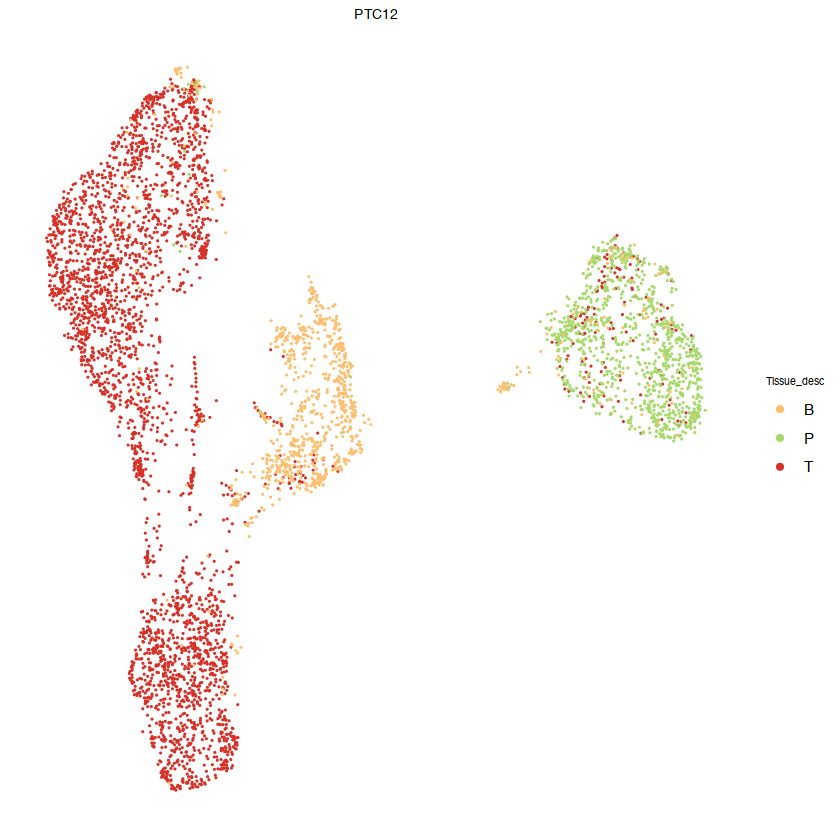

In [5]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
data_df = arrange(data_df, desc(Tissue_desc))
data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC12病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC12病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


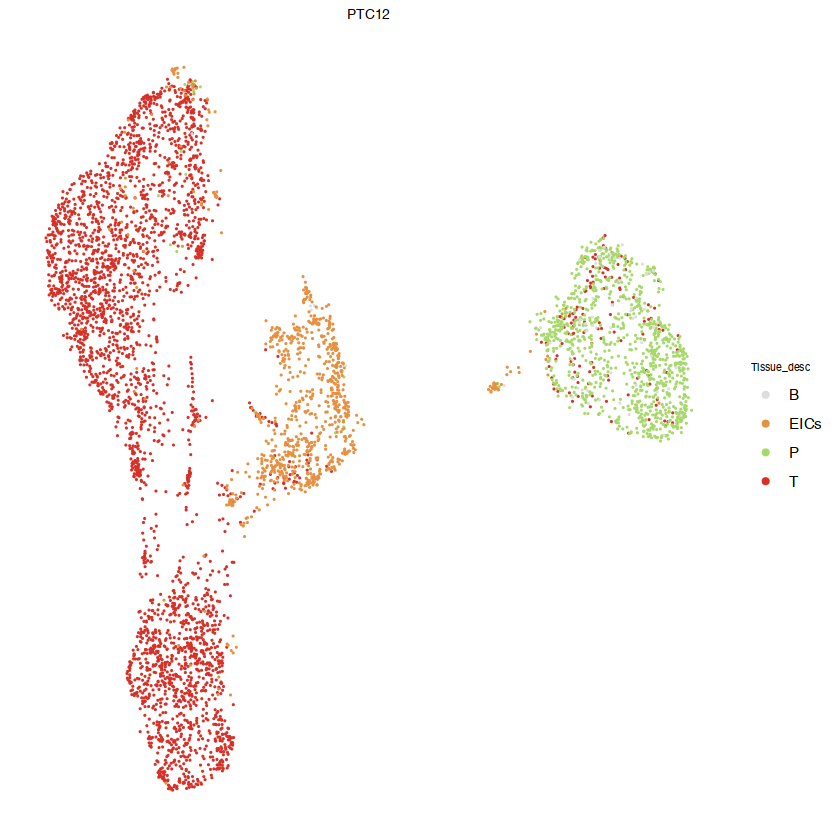

In [6]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
data_df = arrange(data_df, desc(Tissue_desc))
data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'
data_df[colnames(srt_B), 'Tissue_desc'] = srt_B$Type
data_df[data_df$Tissue_desc=='NB', 'Tissue_desc'] = 'B'


a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  #scale_fill_manual(values = tissue_colors)+
  scale_fill_manual(values = c(tissue_colors[c('P','T')],'B'="#dddddd", 'EICs'='#E69042' ))+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC12病人2.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC12病人(legend2).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


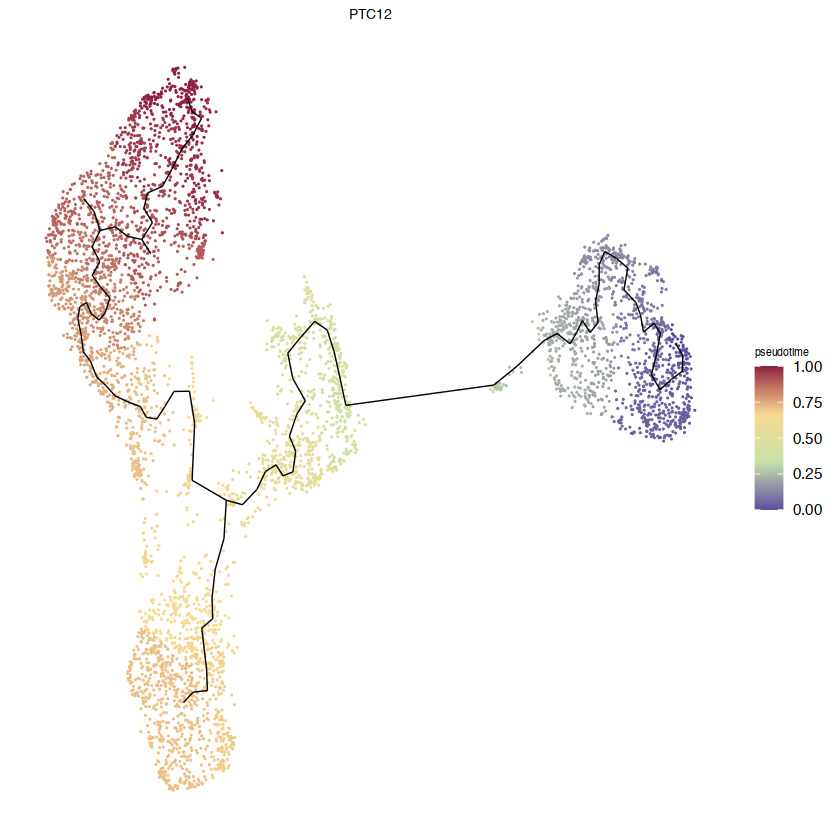

In [7]:
a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = "source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC12病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC12病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message:
“No shared levels found between `names(values)` of the manual scale and the data's fill values.”
Warning message:
“Removed 168 rows containing missing values or values outside the scale range (`geom_point()`).”


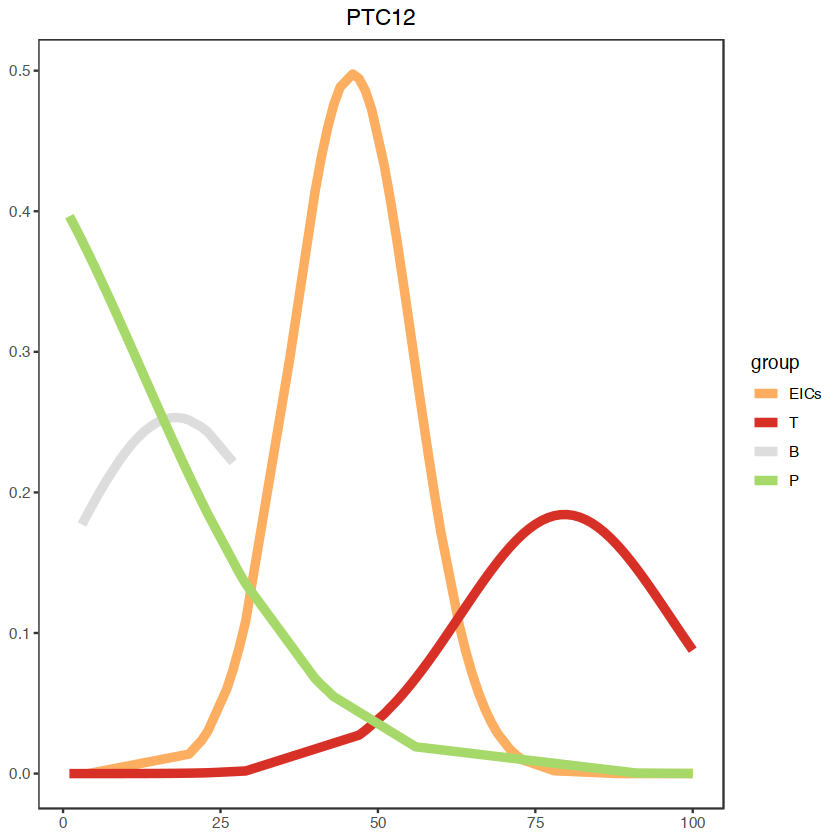

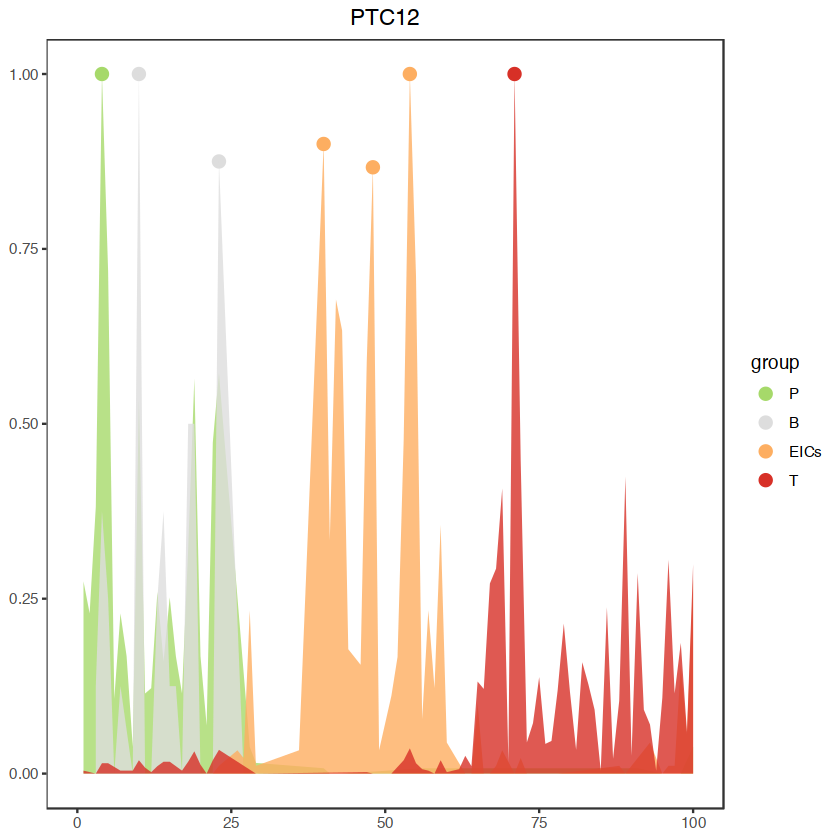

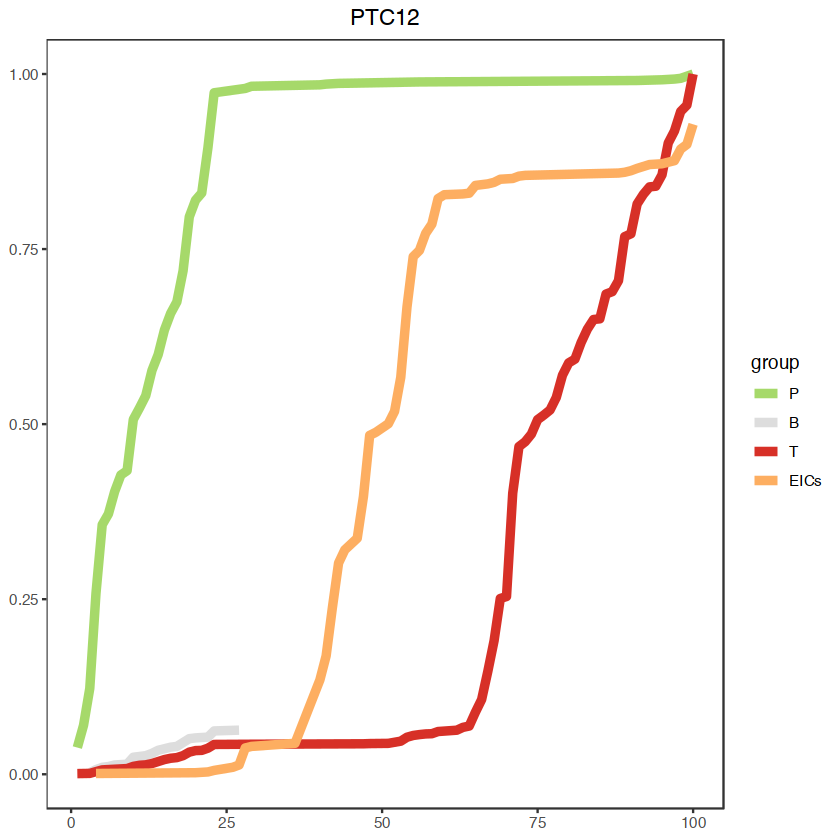

In [8]:
tmp_meta = cds@colData %>% as.data.frame()#srt@meta.data[srt$patient==p,]
tmp_meta[,'pseudotime'] = cds@principal_graph_aux$UMAP$pseudotime
tmp_meta[colnames(subset(srt_B, patient==p)), 'Tissue_desc'] = subset(srt_B, patient==p)$Type
tmp_meta$pseudotime_cut = cut(tmp_meta$pseudotime, breaks=100)
tmp_meta$pseudotime_cut = as.numeric(tmp_meta$pseudotime_cut)

d1 = tmp_meta %>%
  filter(Tissue_desc=='T') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n()) %>% as.data.frame()
d1$prop = d1$num / sum(d1$num)
d1$group = 'T'
d1$cm =cumsum(d1$prop)
d1$prop = (d1$prop-min(d1$prop)) / (max(d1$prop)-min(d1$prop))

tmp_d = d1
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d1$prop_smooth <- predict(fit_lm)

#d1$prop[d1$prop>0.02] = 0.02
d2 = tmp_meta %>%
  filter(Tissue_desc=='EICs') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d2$prop = d2$num / nrow(tmp_meta %>% filter(Tissue_desc%in%c('NB','EICs')))
d2$group = 'EICs'
d2$cm =cumsum(d2$prop)
d2$prop = (d2$prop-min(d2$prop)) / (max(d2$prop)-min(d2$prop))

tmp_d = d2
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d2$prop_smooth <- predict(fit_lm)

#d2$prop[d2$prop>0.02] = 0.02
d3 = tmp_meta %>%
  filter(Tissue_desc=='P') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d3$prop = d3$num / nrow(tmp_meta %>% filter(Tissue_desc=='P'))
d3$group = 'P'
d3$cm =cumsum(d3$prop)
d3$prop = (d3$prop-min(d3$prop)) / (max(d3$prop)-min(d3$prop))

tmp_d = d3
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d3$prop_smooth <- predict(fit_lm)


d4 = tmp_meta %>%
  filter(Tissue_desc=='NB') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d4$prop = d4$num / nrow(tmp_meta %>% filter(Tissue_desc%in%c('NB','EICs')))
d4$group = 'B'
d4$cm =cumsum(d4$prop)
d4$prop = (d4$prop-min(d4$prop)) / (max(d4$prop)-min(d4$prop))

tmp_d = d4
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d4$prop_smooth <- predict(fit_lm)
d4 = d4 %>% filter(pseudotime_cut<40)

dd = rbind(d1,d2,d3,d4)
dd$group = factor(dd$group, c('T','EICs','B','P'))

p1_sm = dd %>%
  mutate(group=factor(group, c('EICs','T','B','P')))%>%
  arrange(desc(group)) %>%
  ggplot(aes(x=pseudotime_cut, y=prop_smooth, color=group))+
  geom_line(size=2)+
  #geom_col(size=0.1, width = 0.1)+
  #geom_line(aes(y=tn),se=F,method = 'glm', formula = 'y ~ exp(poly(x, 3))')+
  #geom_smooth(se=F,method = 'loess', formula = 'y ~ x', size=1)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  scale_fill_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p1_sm

p1=dd %>%
  mutate(group=factor(group, c('P','B','EICs','T')))%>%
  ggplot(aes(x=pseudotime_cut, y=prop, color=group, fill=group))+
  geom_point(aes(y=ifelse(prop>0.75, prop, NA)), size=3)+
  #geom_line(size=0.5)+
  geom_ribbon(aes(xmin=0,xmax=pseudotime_cut, ymin=0,ymax=prop), alpha = 0.8, size=NA)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  scale_fill_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p1


p1_cum = dd %>%
  mutate(group=factor(group, c('P','B','T','EICs')))%>%
  ggplot(aes(x=pseudotime_cut,y=cm, color=group))+
  geom_line(size=2)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  labs(title=p)+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p1_cum


In [10]:
ggsave(glue('{output_dir}/monocle3_PTC12_EICdistribution.pdf'), plot = p1, 
       width=80, height=50, units='mm', dpi = 450, bg = 'transparent')

Warning message:
“Removed 168 rows containing missing values or values outside the scale range (`geom_point()`).”


## PTC30

In [2]:
p='PTC30'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}else{

    # colData(cds)$Tissue_desc2 = colData(cds)$Tissue_desc
    # colData(cds)[same_bc, 'Tissue_desc2'] = srt_B@meta.data[same_bc, 'Type']
    # #colData(cds)[colData(cds)$Tissue_desc2=='NB', "Tissue_desc2"] = 'P'
    # marker_test_res <- top_markers(cds, group_cells_by="Tissue_desc2"', 
    #                                genes_to_test_per_group=500,
    #                                reference_cells=1000, cores=8) 
    # top_specific_markers <- marker_test_res %>%
    #   #filter(fraction_expressing >= 0.10) %>%
    #   group_by(cell_group) %>%
    #   top_n(200, pseudo_R2)
    # x1 = top_specific_markers[top_specific_markers$cell_group=='T', ]%>% pull(gene_id)
    # x2 = top_specific_markers[top_specific_markers$cell_group=='EICs', ]%>% pull(gene_id)
    # x3 = top_specific_markers[top_specific_markers$cell_group=='NB', ]%>% pull(gene_id)
    # x4 = top_specific_markers[top_specific_markers$cell_group=='P', ]%>% pull(gene_id)
    # a1 = intersect(x1,x2)
    # a2 = setdiff(x2, x3)
    # a3 = setdiff(a2, x4)
    # a4 = head(setdiff(x1, x2), 100)
    # a5 = head(setdiff(x1, x3), 100)

    # top_specific_marker_ids <- unique(top_specific_markers %>% filter(cell_group%in%c('P')) %>% pull(gene_id))
    # top_specific_marker_ids = c(top_specific_marker_ids,a1,a2,a4)

    # saveRDS(top_specific_marker_ids, paste0('../output/良性结节monocle3/',p,'_2_marker.rds'))


    top_specific_marker_ids = readRDS(paste0('../output/良性结节monocle3/',p,'_2_marker.rds'))
    colData(cds)$Tissue_desc2 = colData(cds)$Tissue_desc
    colData(cds)[colData(cds)$Tissue_desc2=='P', '"Tissue_desc2"] = 'B'
    cds <- preprocess_cds(cds, num_dim = 10, use_genes = top_specific_marker_ids)
    cds <- align_cds(cds, alignment_group = "Tissue_desc2", alignment_k = 10)#2
    cds <- reduce_dimension(cds)

    plot_cells(cds, color_cells_by = "Tissue_desc", label_groups_by_cluster = F, 
            group_label_size = 0,
            cell_size = 1,
            trajectory_graph_color='black',
            cell_stroke = 1) + theme(legend.position = "right")+
    scale_color_manual(values = c(tissue_colors, 'root'='black'))+
    labs(title=p)
    cds <- cluster_cells(cds)
    cds = learn_graph(cds,use_partition=F, learn_graph_control=list(euclidean_distance_ratio=0.1,minimal_branch_len=10))
    cds <- order_cells(cds, root_pr_nodes='Y_57') 
    tmp_time = pseudotime(cds)
    tmp_time = max(tmp_time) - tmp_time
    tmp_time = (tmp_time-min(tmp_time)) / (max(tmp_time)-min(tmp_time))
    cds@principal_graph_aux$UMAP$pseudotime = tmp_time

    saveRDS(cds, paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
}


load



Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


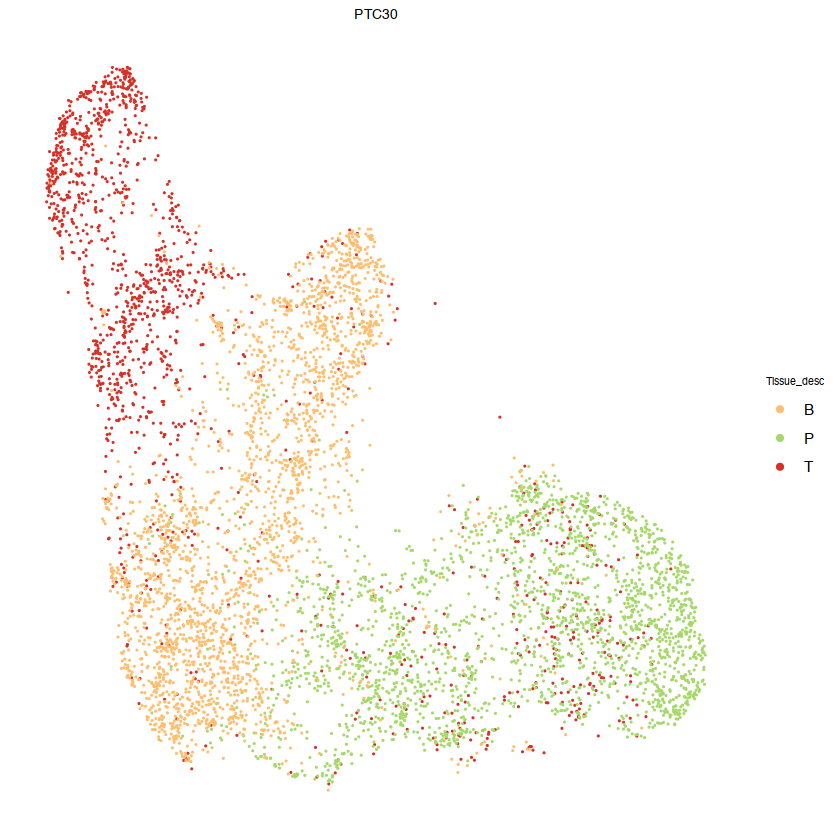

In [6]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
data_df = arrange(data_df, desc(Tissue_desc))
data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC30病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC30病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


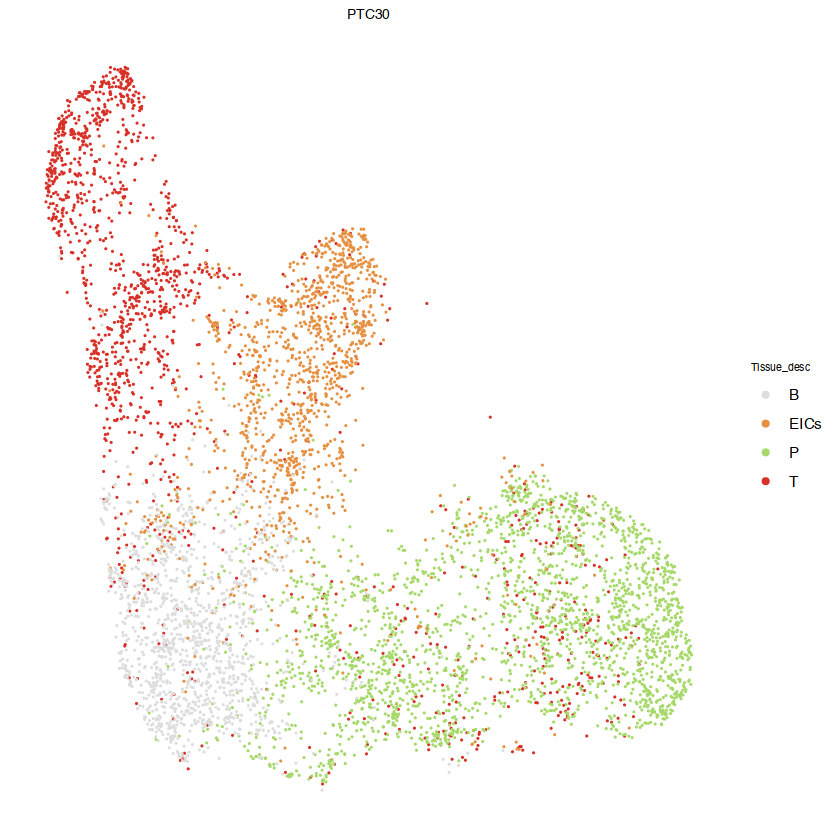

In [7]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
data_df = arrange(data_df, desc(Tissue_desc))
data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

data_df[colnames(srt_B), 'Tissue_desc'] = srt_B$Type
data_df[data_df$Tissue_desc=='NB', 'Tissue_desc'] = 'B'


a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = c(tissue_colors[c('P','T')],'B'="#dddddd", 'EICs'='#E69042' ))+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC30病人2.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC30病人(legend2).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


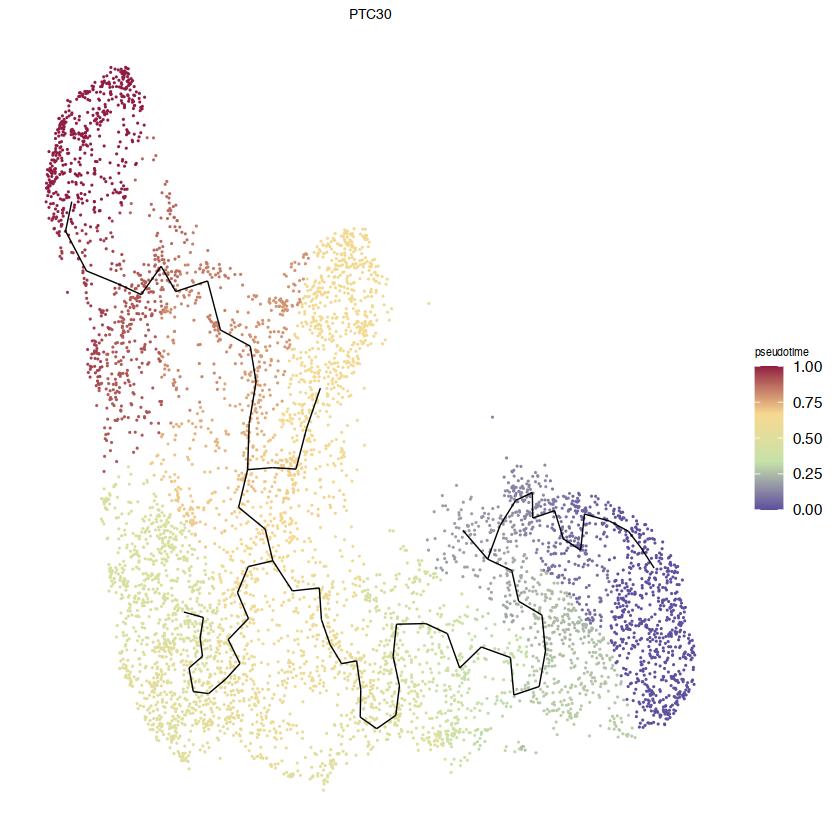

In [8]:
a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = "source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC30病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC30病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message:
“No shared levels found between `names(values)` of the manual scale and the data's fill values.”
Warning message:
“Removed 202 rows containing missing values or values outside the scale range (`geom_point()`).”


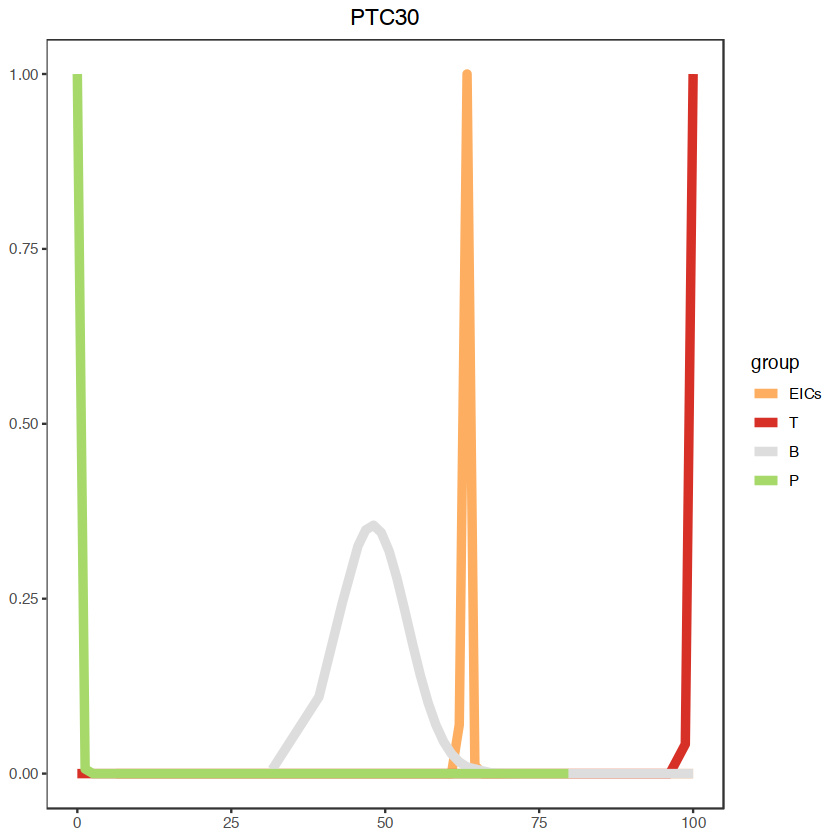

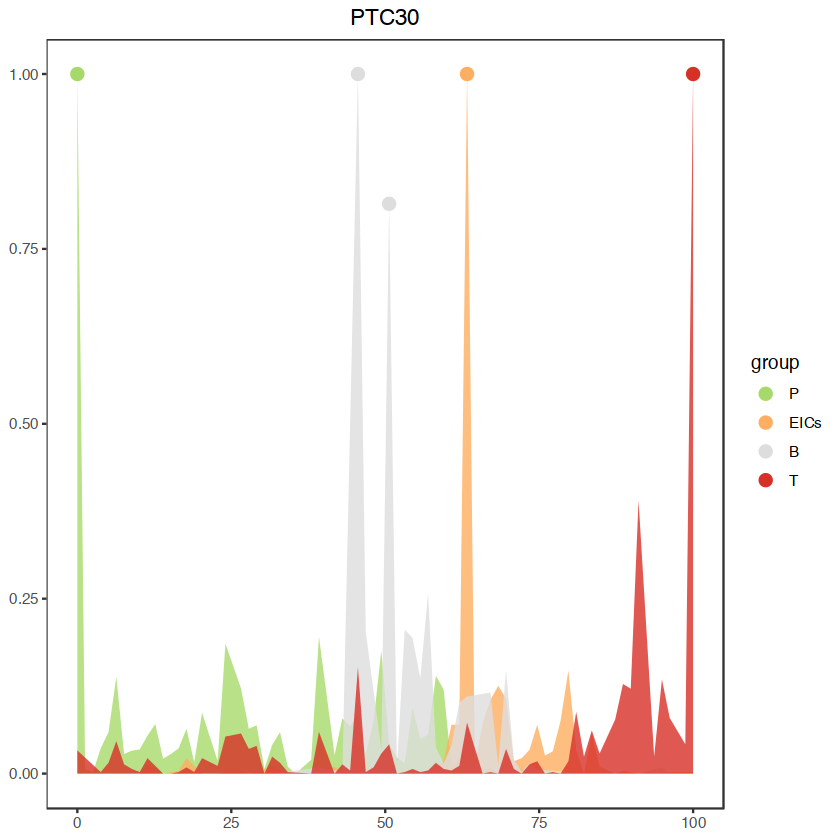

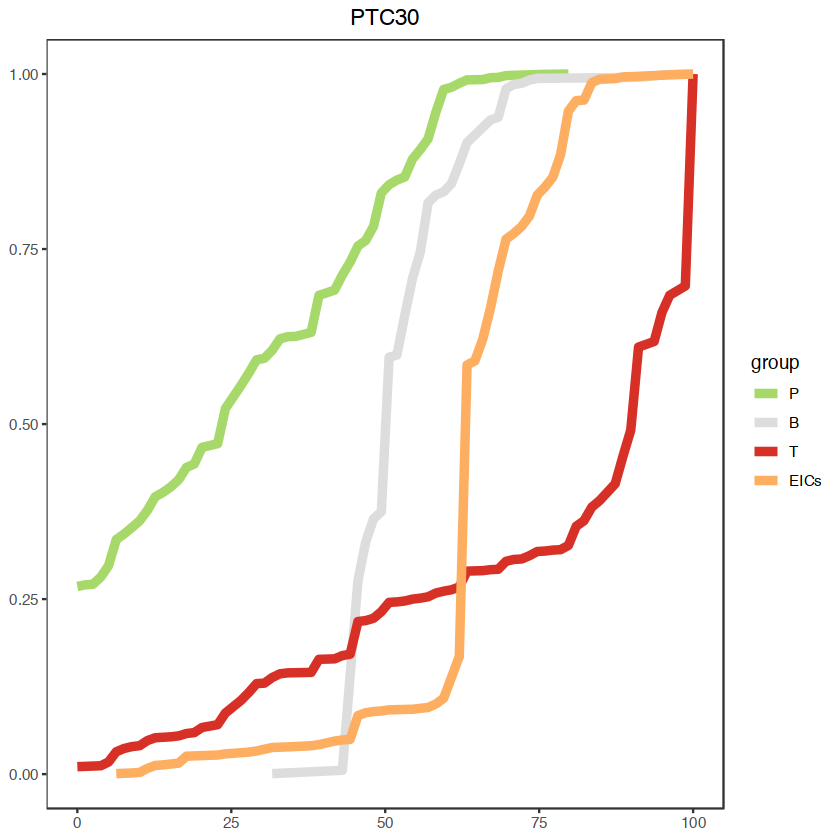

In [11]:
tmp_meta = cds@colData %>% as.data.frame()
tmp_meta[,'pseudotime'] = cds@principal_graph_aux$UMAP$pseudotime
tmp_meta[colnames(subset(srt_B, patient==p)), 'Tissue_desc'] = subset(srt_B, patient==p)$Type
tmp_meta$pseudotime_cut = cut(tmp_meta$pseudotime, breaks=80)
tmp_meta$pseudotime_cut = as.numeric(tmp_meta$pseudotime_cut)
tmp_meta$pseudotime_cut = (tmp_meta$pseudotime_cut-min(tmp_meta$pseudotime_cut)) / (max(tmp_meta$pseudotime_cut)-min(tmp_meta$pseudotime_cut))
tmp_meta$pseudotime_cut =tmp_meta$pseudotime_cut  *100

d1 = tmp_meta %>%
  filter(Tissue_desc=='T') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n()) %>% as.data.frame()
d1$prop = d1$num / sum(d1$num)
d1$group = 'T'
d1$cm =cumsum(d1$prop)
d1$prop = (d1$prop-min(d1$prop)) / (max(d1$prop)-min(d1$prop))
tmp_d = d1
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d1$prop_smooth <- predict(fit_lm)
#d1$prop[d1$prop>0.02] = 0.02
d2 = tmp_meta %>%
  filter(Tissue_desc=='EICs') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d2$prop = d2$num / nrow(tmp_meta %>% filter(Tissue_desc%in%c('EICs')))#sum(d2$num)#nrow(tmp_meta %>% filter(Tissue_desc=='B'))
d2$group = 'EICs'
d2$cm =cumsum(d2$prop)
d2$prop = (d2$prop-min(d2$prop)) / (max(d2$prop)-min(d2$prop))

tmp_d = d2
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d2$prop_smooth <- predict(fit_lm)
#d2$prop[d2$prop>0.02] = 0.02
d3 = tmp_meta %>%
  filter(Tissue_desc=='P') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d3$prop = d3$num / nrow(tmp_meta %>% filter(Tissue_desc=='P'))
d3$group = 'P'
d3$cm =cumsum(d3$prop)
d3$prop = (d3$prop-min(d3$prop)) / (max(d3$prop)-min(d3$prop))
tmp_d = d3
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d3$prop_smooth <- predict(fit_lm)

d4 = tmp_meta %>%
  filter(Tissue_desc=='NB') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d4$prop = d4$num / nrow(tmp_meta %>% filter(Tissue_desc%in%c('NB')))
d4$group = 'B'
d4$cm =cumsum(d4$prop)
d4$prop = (d4$prop-min(d4$prop)) / (max(d4$prop)-min(d4$prop))

tmp_d = d4
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d4$prop_smooth <- predict(fit_lm)

dd = rbind(d1,d2,d3,d4)
dd$group = factor(dd$group, c('T','EICs','B','P'))

p2_sm = dd %>%
  mutate(group=factor(group, c('EICs','T','B','P')))%>%
  arrange(desc(group)) %>%
  ggplot(aes(x=pseudotime_cut, y=prop_smooth, color=group))+
  geom_line(size=2)+
  #geom_col(size=0.1, width = 0.1)+
  #geom_line(aes(y=tn),se=F,method = 'glm', formula = 'y ~ exp(poly(x, 3))')+
  #geom_smooth(se=F,method = 'loess', formula = 'y ~ x', size=1)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  scale_fill_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p2_sm

p2=dd %>%
  mutate(group=factor(group, c('P','EICs','B','T')))%>%
  ggplot(aes(x=pseudotime_cut, y=prop, color=group, fill=group))+
  geom_point(aes(y=ifelse(prop>0.75, prop, NA)), size=3)+
  #geom_line(size=0.5)+
  geom_ribbon(aes(xmin=0,xmax=pseudotime_cut, ymin=0,ymax=prop), alpha = 0.8, size=NA)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  scale_fill_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p2


p2_cum = dd %>%
  mutate(group=factor(group, c('P','B','T','EICs')))%>%
  ggplot(aes(x=pseudotime_cut,y=cm, color=group))+
  geom_line(size=2)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A','B'="#dddddd"))+
  labs(title=p)+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p2_cum

In [12]:
ggsave(glue('{output_dir}/monocle3_PTC30_EICdistribution.pdf'), plot = p2, 
       width=80, height=50, units='mm', dpi = 450, bg = 'transparent')

Warning message:
“Removed 202 rows containing missing values or values outside the scale range (`geom_point()`).”


## PTC32

In [4]:
p='PTC32'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}else{

    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_monocle3.rds'))
    cds <- order_cells(cds, root_pr_nodes='Y_106')
    tmp_time = pseudotime(cds)
    tmp_time = max(tmp_time) - tmp_time
    tmp_time = (tmp_time-min(tmp_time)) / (max(tmp_time)-min(tmp_time))
    cds@principal_graph_aux$UMAP$pseudotime = tmp_time*100

    saveRDS(cds, paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
}


load



Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


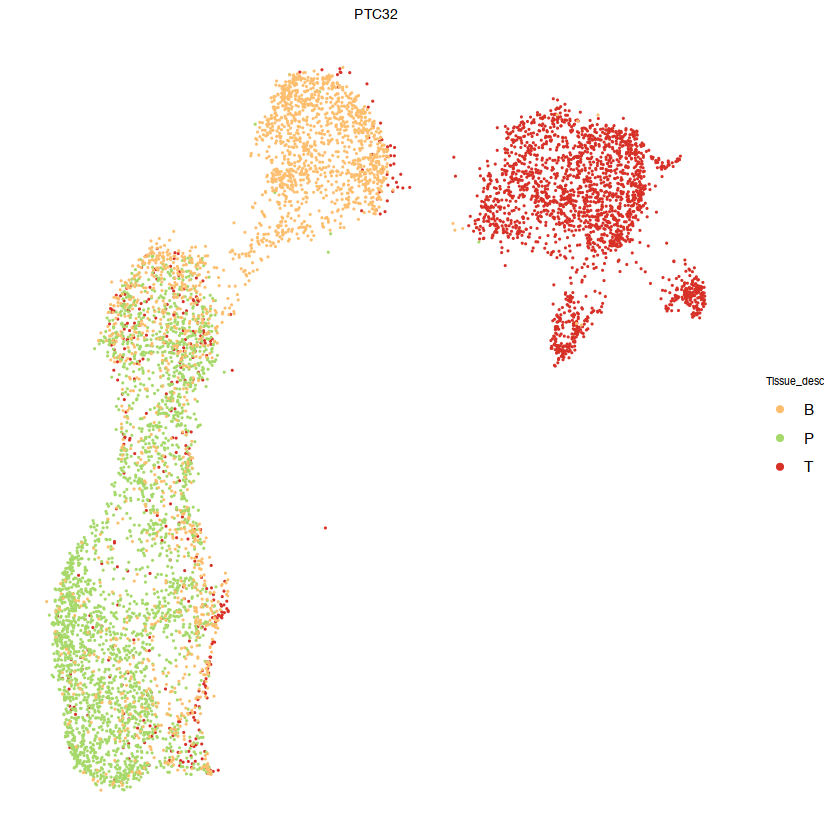

In [5]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
data_df = arrange(data_df, desc(Tissue_desc))
data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC32病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC32病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


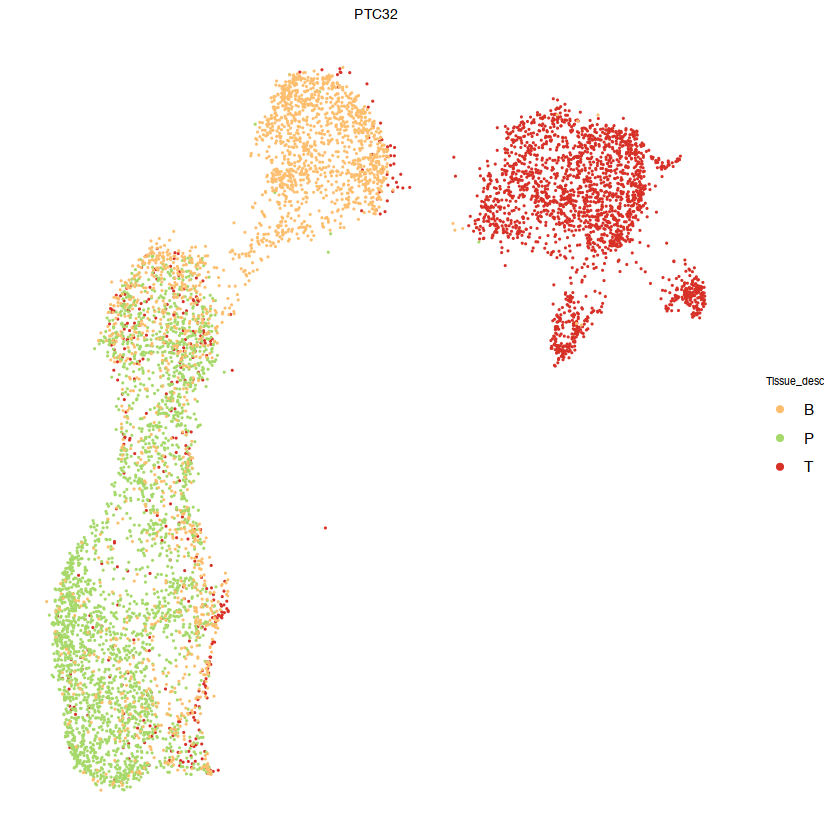

In [6]:

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC32病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC32病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


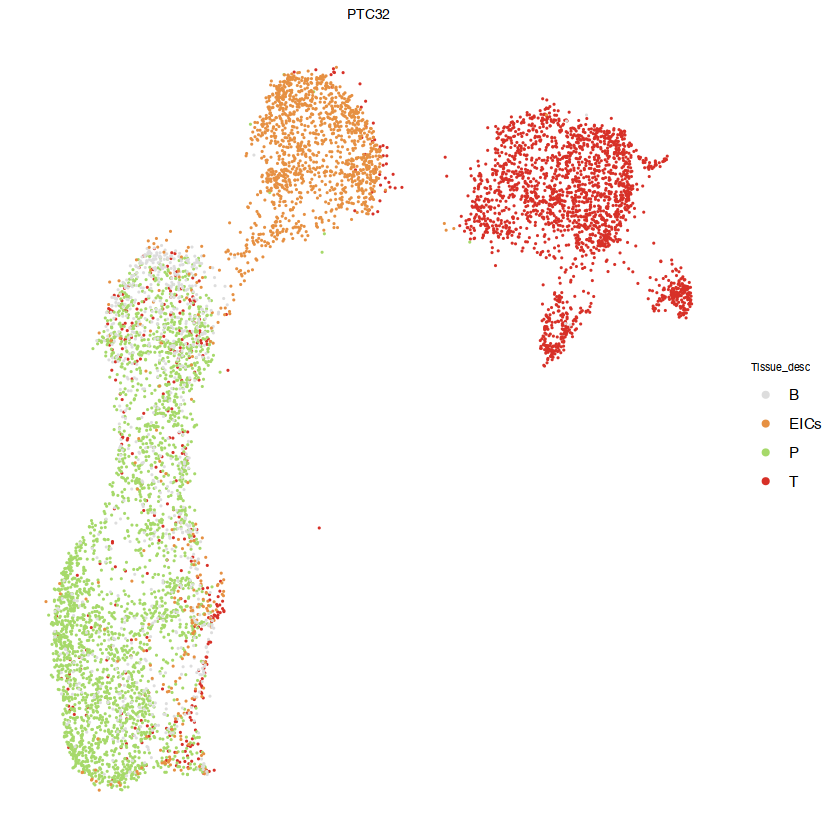

In [7]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
data_df = arrange(data_df, desc(Tissue_desc))
data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

data_df[colnames(srt_B), 'Tissue_desc'] = srt_B$Type
data_df[data_df$Tissue_desc=='NB', 'Tissue_desc'] = 'B'


a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = c(tissue_colors[c('P','T')],'B'="#dddddd", 'EICs'='#E69042' ))+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC32病人2.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC32病人(legend2).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


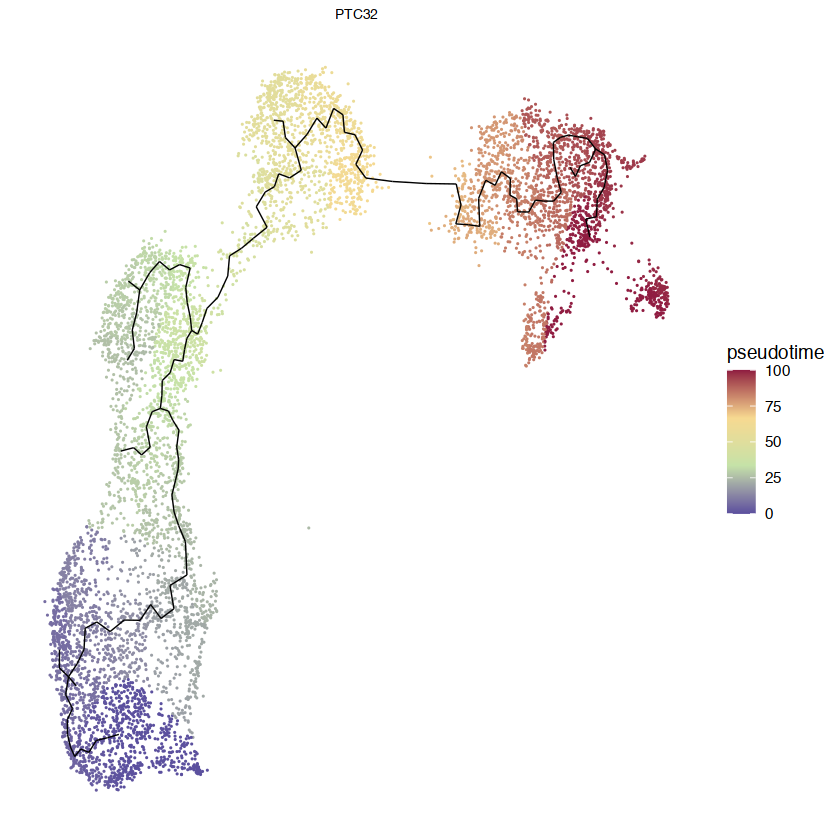

In [8]:
a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = "source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    #legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC32病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC32病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the data's fill values.”
Warning message:
“Removed 221 rows containing missing values or values outside the scale range (`geom_point()`).”


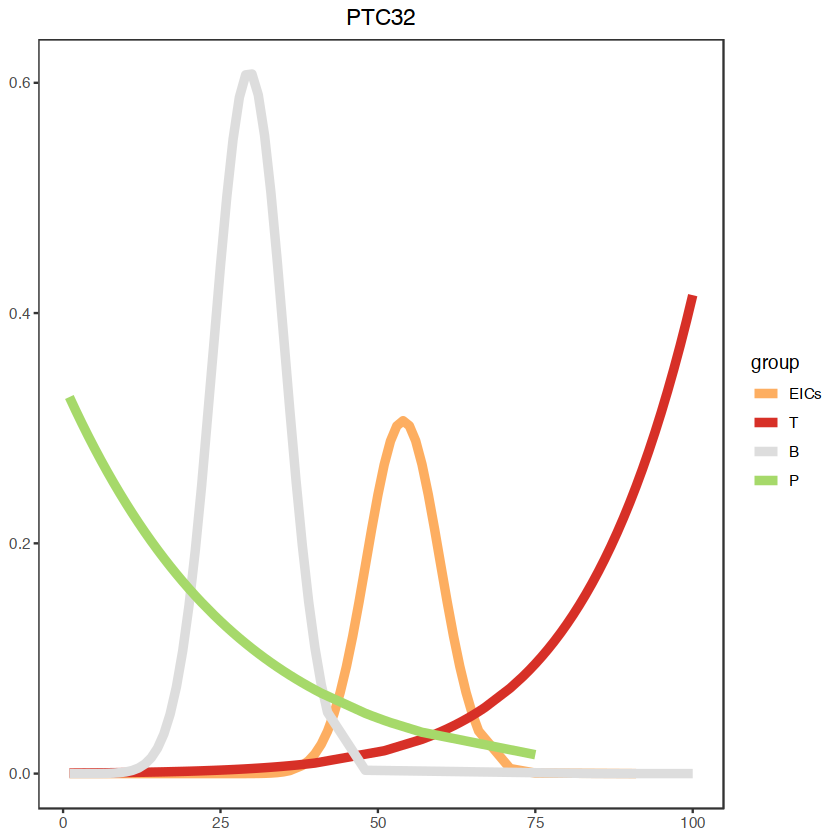

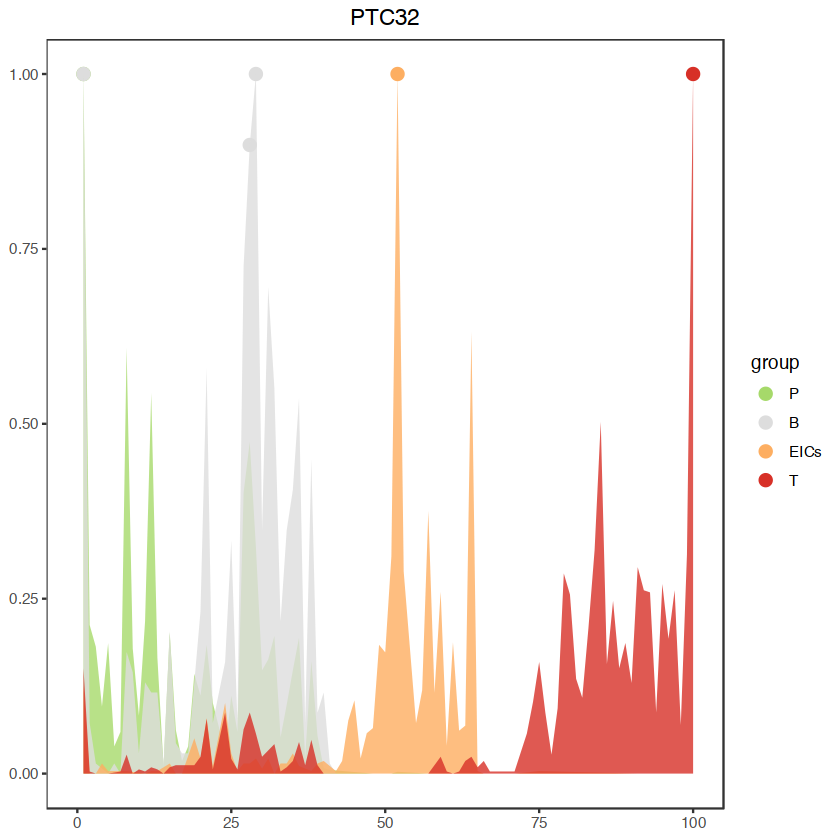

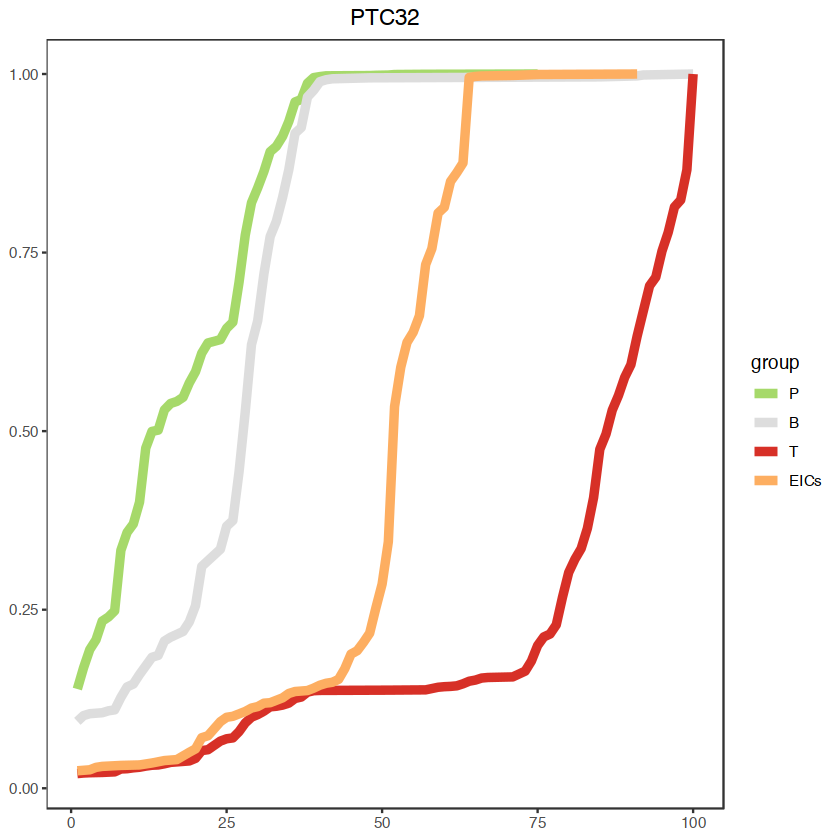

In [9]:
tmp_meta = cds@colData %>% as.data.frame()
tmp_meta[,'pseudotime'] = cds@principal_graph_aux$UMAP$pseudotime
tmp_meta[colnames(subset(srt_B, patient==p)), 'Tissue_desc'] = subset(srt_B, patient==p)$Type

tmp_meta$pseudotime_cut = cut(tmp_meta$pseudotime, breaks=100)
tmp_meta$pseudotime_cut = as.numeric(tmp_meta$pseudotime_cut)

d1 = tmp_meta %>%
  filter(Tissue_desc=='T') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n()) %>% as.data.frame()
d1$prop = d1$num / sum(d1$num)
d1$group = 'T'
d1$cm =cumsum(d1$prop)
d1$prop = (d1$prop-min(d1$prop)) / (max(d1$prop)-min(d1$prop))


tmp_d = d1
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d1$prop_smooth <- predict(fit_lm)

#d1$prop[d1$prop>0.02] = 0.02
d2 = tmp_meta %>%
  filter(Tissue_desc=='EICs') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d2$prop = d2$num / sum(d2$num)#nrow(tmp_meta %>% filter(Tissue_desc=='B'))
d2$group = 'EICs'
d2$cm =cumsum(d2$prop)
d2$prop = (d2$prop-min(d2$prop)) / (max(d2$prop)-min(d2$prop))

tmp_d = d2
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d2$prop_smooth <- predict(fit_lm)

#d2$prop[d2$prop>0.02] = 0.02
d3 = tmp_meta %>%
  filter(Tissue_desc=='P') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d3$prop = d3$num / sum(d3$num)#nrow(tmp_meta %>% filter(Tissue_desc=='B'))
d3$group = 'P'
d3$cm =cumsum(d3$prop)
d3$prop = (d3$prop-min(d3$prop)) / (max(d3$prop)-min(d3$prop))

tmp_d = d3
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d3$prop_smooth <- predict(fit_lm)


d4 = tmp_meta %>%
  filter(Tissue_desc=='NB') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d4$prop = d4$num / sum(d4$num)#nrow(tmp_meta %>% filter(Tissue_desc%in%c('NB')))
d4$group = 'B'
d4$cm =cumsum(d4$prop)
d4$prop = (d4$prop-min(d4$prop)) / (max(d4$prop)-min(d4$prop))

tmp_d = d4
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d4$prop_smooth <- predict(fit_lm)

dd = rbind(d1,d2,d3,d4)

dd$group = factor(dd$group, c('T','EICs','B','P'))

p3_sm = dd %>%
  mutate(group=factor(group, c('EICs','T','B','P')))%>%
  arrange(desc(group)) %>%
  ggplot(aes(x=pseudotime_cut, y=prop_smooth, color=group))+
  geom_line(size=2)+
  #geom_col(size=0.1, width = 0.1)+
  #geom_line(aes(y=tn),se=F,method = 'glm', formula = 'y ~ exp(poly(x, 3))')+
  #geom_smooth(se=F,method = 'loess', formula = 'y ~ x', size=1)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A', 'B'='#dddddd'))+
  scale_fill_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A', 'B'='#dddddd'))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p3_sm

p3=dd %>%
  mutate(group=factor(group, c('P','B','EICs','T')))%>%
  ggplot(aes(x=pseudotime_cut, y=prop, color=group, fill=group))+
  geom_point(aes(y=ifelse(prop>0.75, prop, NA)), size=3)+
  #geom_line(size=0.5)+
  geom_ribbon(aes(xmin=0,xmax=pseudotime_cut, ymin=0,ymax=prop), alpha = 0.8, size=NA)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A', 'B'='#dddddd'))+
  scale_fill_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A', 'B'='#dddddd'))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p3


p3_cum = dd %>%
  mutate(group=factor(group, c('P','B','T','EICs')))%>%
  ggplot(aes(x=pseudotime_cut,y=cm, color=group))+
  geom_line(size=2)+
  scale_color_manual(values = c('T'='#D73027','EICs'='#FDAE61','P'='#A6D96A', 'B'='#dddddd'))+
  labs(title=p)+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p3_cum

In [10]:
ggsave(glue('{output_dir}/monocle3_PTC32_EICdistribution.pdf'), plot = p3, 
       width=80, height=50, units='mm', dpi = 450, bg = 'transparent')

Warning message:
“Removed 221 rows containing missing values or values outside the scale range (`geom_point()`).”


## PTC34

In [4]:
p='PTC34'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}else{

    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_monocle3.rds'))
    colData(cds)$Tissue_desc2 = colData(cds)$Tissue_desc
    colData(cds)[colData(cds)$Tissue_desc2=='P', "Tissue_desc2"] = 'B'
    cds <- preprocess_cds(cds, num_dim = 5)
    cds <- align_cds(cds, alignment_group = "Tissue_desc", alignment_k = 5)#2
    cds <- reduce_dimension(cds)#, preprocess_method = 'PCA')

    plot_cells(cds, color_cells_by = "Tissue_desc", label_groups_by_cluster = F, 
            group_label_size = 0,
            cell_size = 1,
            trajectory_graph_color='black',
            cell_stroke = 1) + theme(legend.position = "right")+
    scale_color_manual(values = c(tissue_colors, 'root'='black'))+
    labs(title=p)
    cds <- cluster_cells(cds)
    cds = learn_graph(cds,use_partition=F)

    # cds@principal_graph_aux$UMAP$root_pr_nodes
    cds <- order_cells(cds, root_pr_nodes = 'Y_39')
    tmp_time = pseudotime(cds)
    #tmp_time = max(tmp_time) - tmp_time
    tmp_time = (tmp_time-min(tmp_time)) / (max(tmp_time)-min(tmp_time))
    cds@principal_graph_aux$UMAP$pseudotime = tmp_time

    saveRDS(cds, paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
}

load



Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


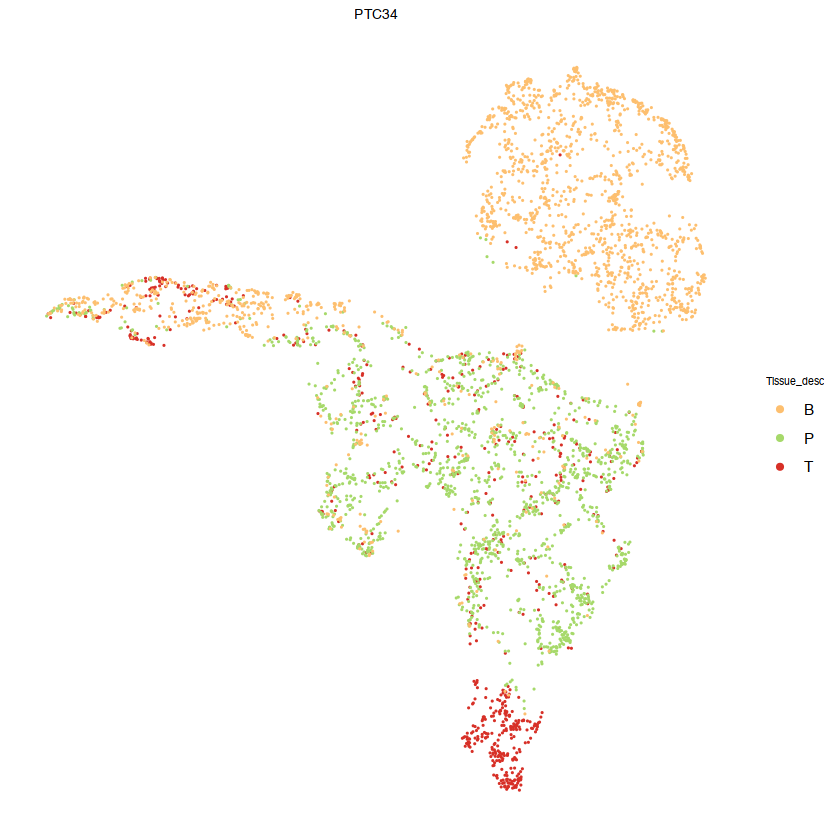

In [5]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
data_df = arrange(data_df, desc(Tissue_desc))
data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC34病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloringPTC34病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')


Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


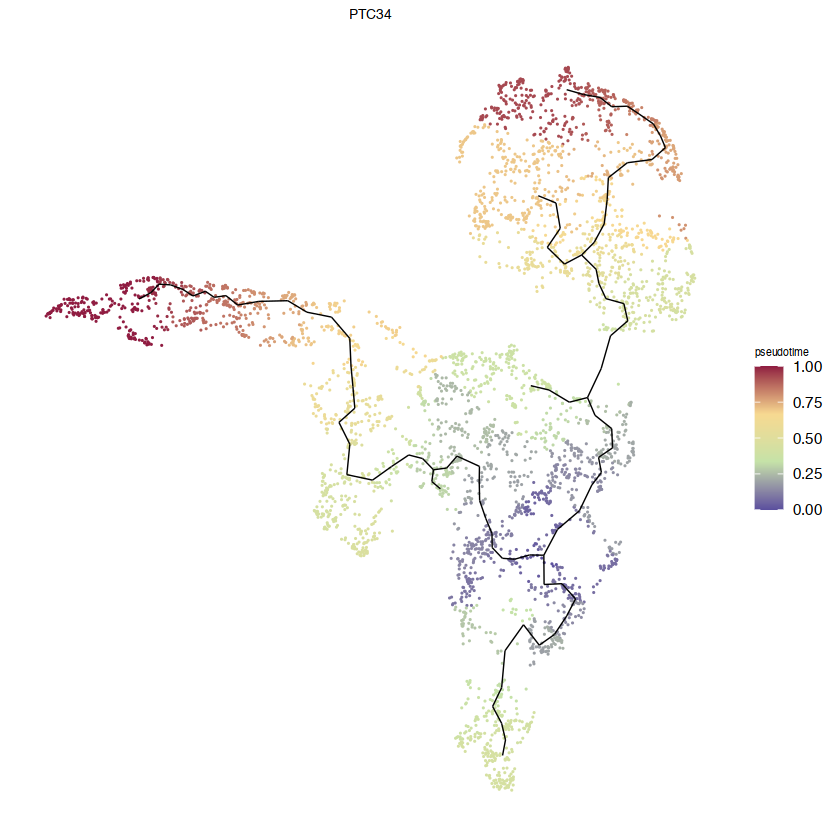

In [6]:
a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = "source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC34病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloringPTC34病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

Warning message:
“No shared levels found between `names(values)` of the manual scale and the data's fill values.”
Warning message:
“Removed 227 rows containing missing values or values outside the scale range (`geom_point()`).”


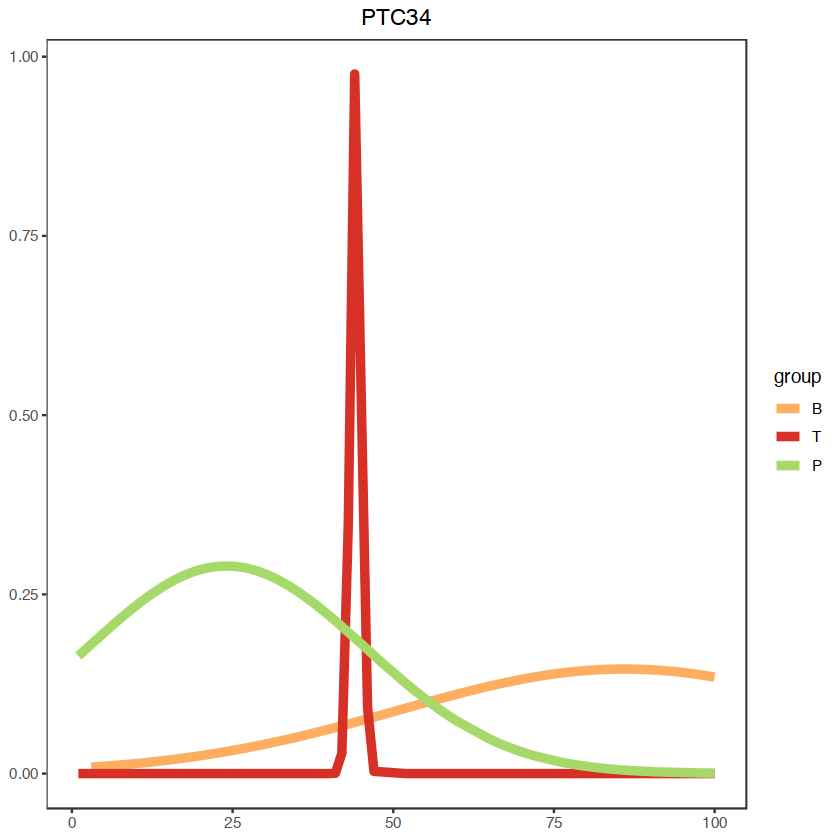

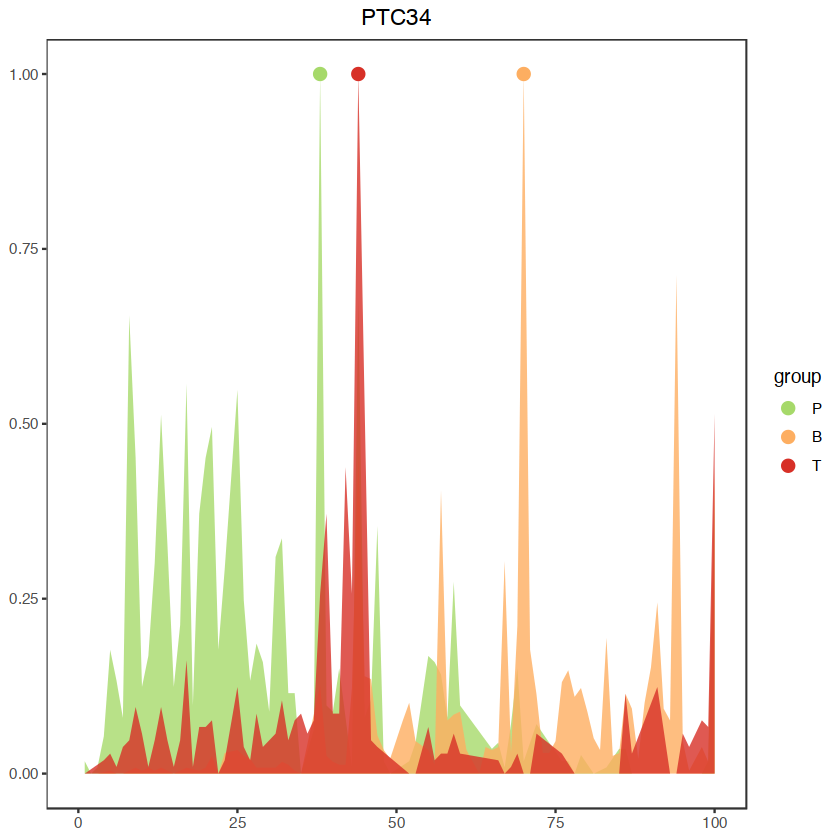

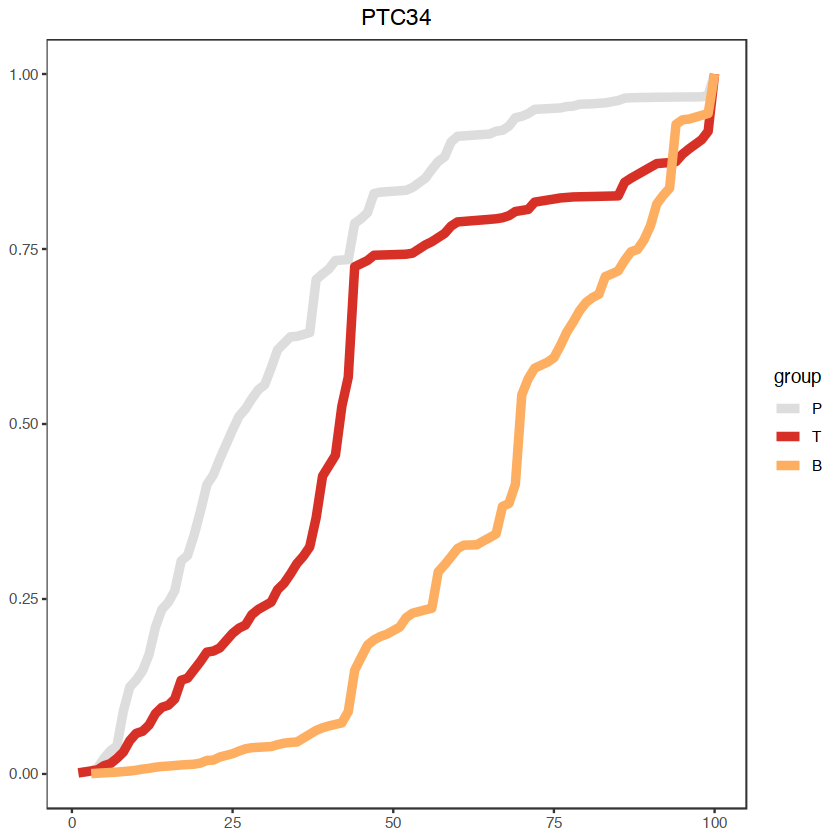

In [7]:
tmp_meta = cds@colData %>% as.data.frame()
tmp_meta[,'pseudotime'] = cds@principal_graph_aux$UMAP$pseudotime
tmp_meta[colnames(subset(srt_B, patient==p)), 'Type'] = subset(srt_B, patient==p)$Type
tmp_meta$pseudotime_cut = cut(tmp_meta$pseudotime, breaks=100)
tmp_meta$pseudotime_cut = as.numeric(tmp_meta$pseudotime_cut)

d1 = tmp_meta %>%
  filter(Tissue_desc=='T') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n()) %>% as.data.frame()
d1$prop = d1$num / sum(d1$num)
d1$group = 'T'
d1$cm =cumsum(d1$prop)
d1$prop = (d1$prop-min(d1$prop)) / (max(d1$prop)-min(d1$prop))


tmp_d = d1
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d1$prop_smooth <- predict(fit_lm)

#d1$prop[d1$prop>0.02] = 0.02
d2 = tmp_meta %>%
  filter(Tissue_desc=='B') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d2$prop = d2$num / sum(d2$num)#nrow(tmp_meta %>% filter(Tissue_desc=='B'))
d2$group = 'B'
d2$cm =cumsum(d2$prop)
d2$prop = (d2$prop-min(d2$prop)) / (max(d2$prop)-min(d2$prop))

tmp_d = d2
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d2$prop_smooth <- predict(fit_lm)

#d2$prop[d2$prop>0.02] = 0.02
d3 = tmp_meta %>%
  filter(Tissue_desc=='P') %>%
  group_by(pseudotime_cut) %>%
  summarise(num=n())%>% as.data.frame()
d3$prop = d3$num / sum(d3$num)#nrow(tmp_meta %>% filter(Tissue_desc=='B'))
d3$group = 'P'
d3$cm =cumsum(d3$prop)
d3$prop = (d3$prop-min(d3$prop)) / (max(d3$prop)-min(d3$prop))

tmp_d = d3
fit_lm <- nlsLM(prop ~ a * exp(-(pseudotime_cut - b)^2 / (2 * c^2)), 
                data = tmp_d,
                start = list(a = max(tmp_d$prop), 
                             b = tmp_d$pseudotime_cut[which.max(tmp_d$prop)], 
                             c = diff(range(tmp_d$pseudotime_cut))/4))
d3$prop_smooth <- predict(fit_lm)


dd = rbind(d1,d2,d3)
dd$group = factor(dd$group, c('T','B','P'))

p4_sm = dd %>%
  mutate(group=factor(group, c('B','T','P')))%>%
  arrange(desc(group)) %>%
  ggplot(aes(x=pseudotime_cut, y=prop_smooth, color=group))+
  geom_line(size=2)+
  #geom_col(size=0.1, width = 0.1)+
  #geom_line(aes(y=tn),se=F,method = 'glm', formula = 'y ~ exp(poly(x, 3))')+
  #geom_smooth(se=F,method = 'loess', formula = 'y ~ x', size=1)+
  scale_color_manual(values = c('T'='#D73027','B'='#FDAE61','P'='#A6D96A'))+
  scale_fill_manual(values = c('T'='#D73027','B'='#FDAE61','P'='#A6D96A'))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p4_sm

p4=dd %>%
  mutate(group=factor(group, c('P','B','T')))%>%
  ggplot(aes(x=pseudotime_cut, y=prop, color=group, fill=group))+
  geom_point(aes(y=ifelse(prop>0.75, prop, NA)), size=3)+
  #geom_line(size=0.5)+
  geom_ribbon(aes(xmin=0,xmax=pseudotime_cut, ymin=0,ymax=prop), alpha = 0.8, size=NA)+
  scale_color_manual(values = c('T'='#D73027','B'='#FDAE61','P'='#A6D96A'))+
  scale_fill_manual(values = c('T'='#D73027','B'='#FDAE61','P'='#A6D96A'))+
  labs(title=p)+
  #lims(y=c(0,0.6))+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p4


p4_cum = dd %>%
  mutate(group=factor(group, c('P','T','B')))%>%
  ggplot(aes(x=pseudotime_cut,y=cm, color=group))+
  geom_line(size=2)+
  scale_color_manual(values = c('T'='#D73027','B'='#FDAE61','P'='#dddddd'))+
  labs(title=p)+
  theme_bw()+
  theme(panel.grid = element_blank(),
        plot.title = element_text(hjust=0.5),
        axis.title = element_blank())
p4_cum


In [8]:
ggsave(glue('{output_dir}/monocle3_PTC34_EICdistribution.pdf'), plot = p4, 
       width=80, height=50, units='mm', dpi = 450, bg = 'transparent')

Warning message:
“Removed 227 rows containing missing values or values outside the scale range (`geom_point()`).”


## 合并展示

In [40]:
#cum_p = p1_cum/p2_cum/p3_cum/p4_sum
#cum_p = p1_sm/p2_sm/p3_sm/p4_sm
all_p = p1/p2/p3/p4
ggsave(glue('{output_dir}/EIC_在monocle轨迹distribution.pdf'), plot = all_p,  
       width=6, height=7.5, dpi = 450, bg = 'transparent')


Warning message:
“Removed 168 rows containing missing values or values outside the scale range (`geom_point()`).”


ERROR: Error in Ops.data.frame(guide_loc, panel_loc): ‘==’ only defined for equally-sized data frames


In [236]:
all_p = p1/p2/p3
ggsave(glue('{output_dir}/EIC_在monocle轨迹distribution(New).pdf'), plot = all_p,  
       width=3.5, height=5.5, dpi = 450, bg = 'transparent')


Warning message:
“Removed 168 rows containing missing values or values outside the scale range (`geom_point()`).”


ERROR: Error in Ops.data.frame(guide_loc, panel_loc): ‘==’ only defined for equally-sized data frames


In [237]:
all_p = p1/p2/p3/p4
ggsave(glue('{output_dir}/EIC_在monocle轨迹distribution(New带对比).pdf'), plot = all_p,  
       width=3.5, height=7.5, dpi = 450, bg = 'transparent')

Warning message:
“Removed 168 rows containing missing values or values outside the scale range (`geom_point()`).”


ERROR: Error in Ops.data.frame(guide_loc, panel_loc): ‘==’ only defined for equally-sized data frames


# 基因marker在monocle3的表达distribution

## PTC12

In [3]:
library(monocle3)

Loading required package: Biobase

Warning message:
“package ‘Biobase’ was built under R version 4.2.3”
Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()

In [4]:
p='PTC12'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}

load



In [22]:
a=plot_cells(cds, genes='ZCCHC12',
            label_groups_by_cluster = F, 
            group_label_size = 0,
            trajectory_graph_segment_size=0.2,
            cell_size = 0.1,
            trajectory_graph_color='black',
            label_branch_points = F,
            label_leaves=F,
            cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,50))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
b=plot_cells(cds, genes='CLDN1',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,25))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
c=plot_cells(cds, genes='NPC2',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


In [23]:
pl=a+b+c
ggsave(glue('{output_dir}/PTC12_基因marker在monocle轨迹distributionPTC12.pdf'), plot = pl,  
       width=12, height=4, dpi = 450, bg = 'transparent')

## PTC30

In [24]:
p='PTC30'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}

load



In [34]:
a=plot_cells(cds, genes='ZCCHC12',
            label_groups_by_cluster = F, 
            group_label_size = 0,
            trajectory_graph_segment_size=0.2,
            cell_size = 0.1,
            trajectory_graph_color='black',
            label_branch_points = F,
            label_leaves=F,
            cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
b=plot_cells(cds, genes='CLDN1',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
c=plot_cells(cds, genes='NPC2',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


In [35]:
pl=a+b+c
ggsave(glue('{output_dir}/PTC30_基因marker在monocle轨迹distributionPTC30.pdf'), plot = pl,  
       width=12, height=4, dpi = 450, bg = 'transparent')

## PTC32

In [36]:
p='PTC32'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}

load



In [37]:
a=plot_cells(cds, genes='ZCCHC12',
            label_groups_by_cluster = F, 
            group_label_size = 0,
            trajectory_graph_segment_size=0.2,
            cell_size = 0.1,
            trajectory_graph_color='black',
            label_branch_points = F,
            label_leaves=F,
            cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
b=plot_cells(cds, genes='CLDN1',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
c=plot_cells(cds, genes='NPC2',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


In [38]:
pl=a+b+c
ggsave(glue('{output_dir}/PTC32_基因marker在monocle轨迹distributionPTC32.pdf'), plot = pl,  
       width=12, height=4, dpi = 450, bg = 'transparent')

## PTC32

In [39]:
p='PTC34'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}

load



In [40]:
a=plot_cells(cds, genes='ZCCHC12',
            label_groups_by_cluster = F, 
            group_label_size = 0,
            trajectory_graph_segment_size=0.2,
            cell_size = 0.1,
            trajectory_graph_color='black',
            label_branch_points = F,
            label_leaves=F,
            cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
b=plot_cells(cds, genes='CLDN1',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))
c=plot_cells(cds, genes='NPC2',
              label_groups_by_cluster = F, 
              group_label_size = 0,
              trajectory_graph_segment_size=0.2,
              cell_size = 0.1,
              trajectory_graph_color='black',
              label_branch_points = F,
              label_leaves=F,
              cell_stroke = 1) + theme(legend.position = "right")+
  scale_color_gradientn(colours = c('white','#ff0000ff'), limits=c(0,100))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    legend.text = element_text(size=6),
    #legend.position = 'none',
    plot.title = element_text(hjust = 0.5, size=6))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


In [41]:
pl=a+b+c
ggsave(glue('{output_dir}/PTC34_基因marker在monocle轨迹distributionPTC34.pdf'), plot = pl,  
       width=12, height=4, dpi = 450, bg = 'transparent')

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


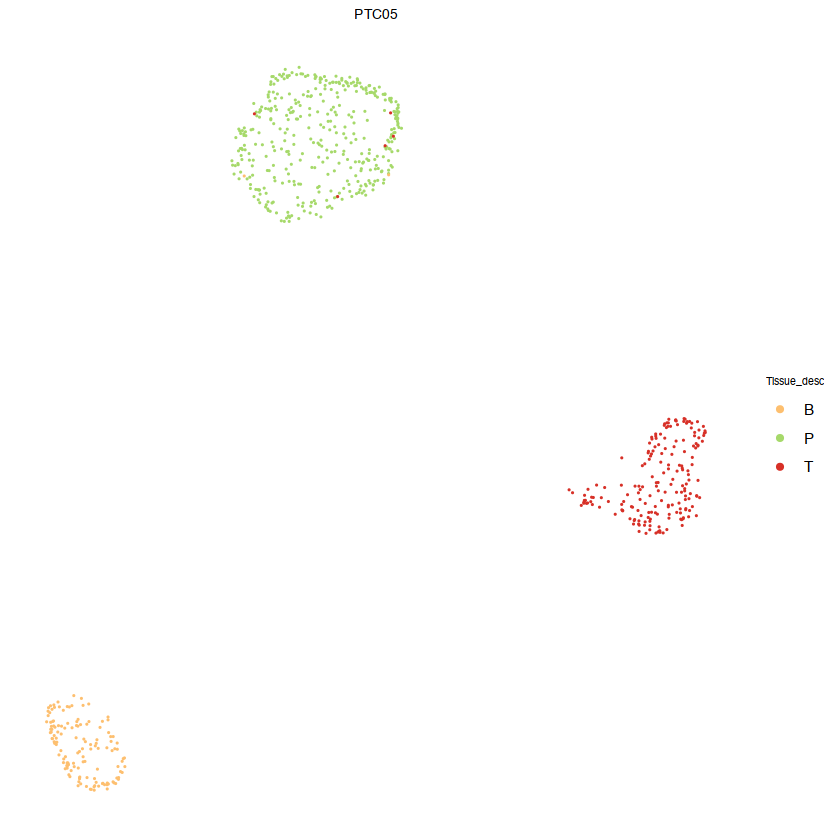

In [71]:
p='PTC05'
cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
# data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
# data_df = arrange(data_df, desc(Tissue_desc))
# data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
# data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
# data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid"', 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = '"source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


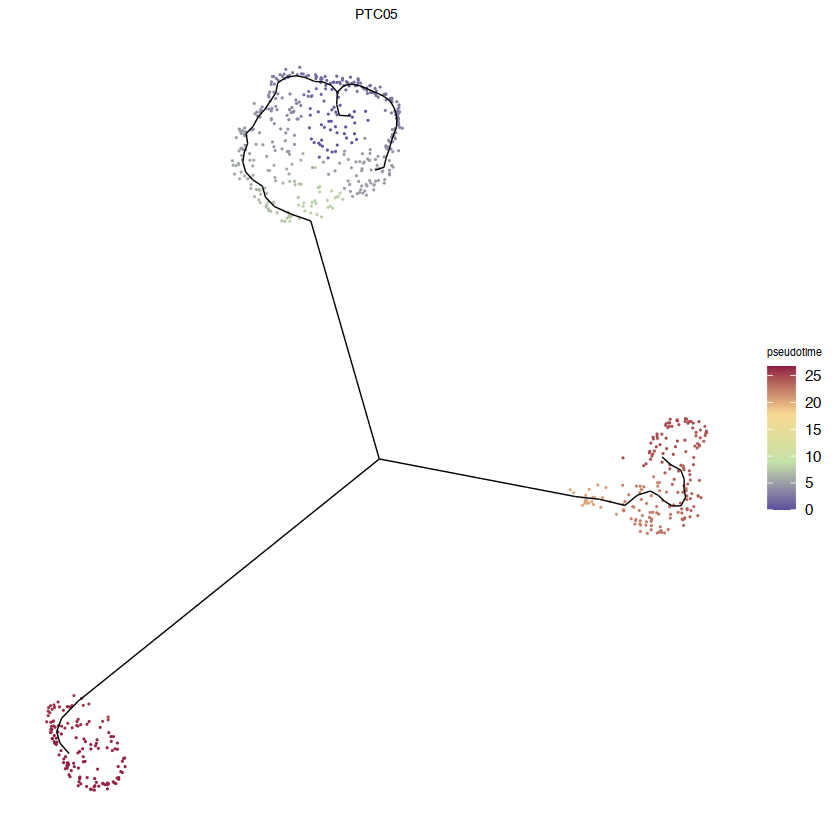

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


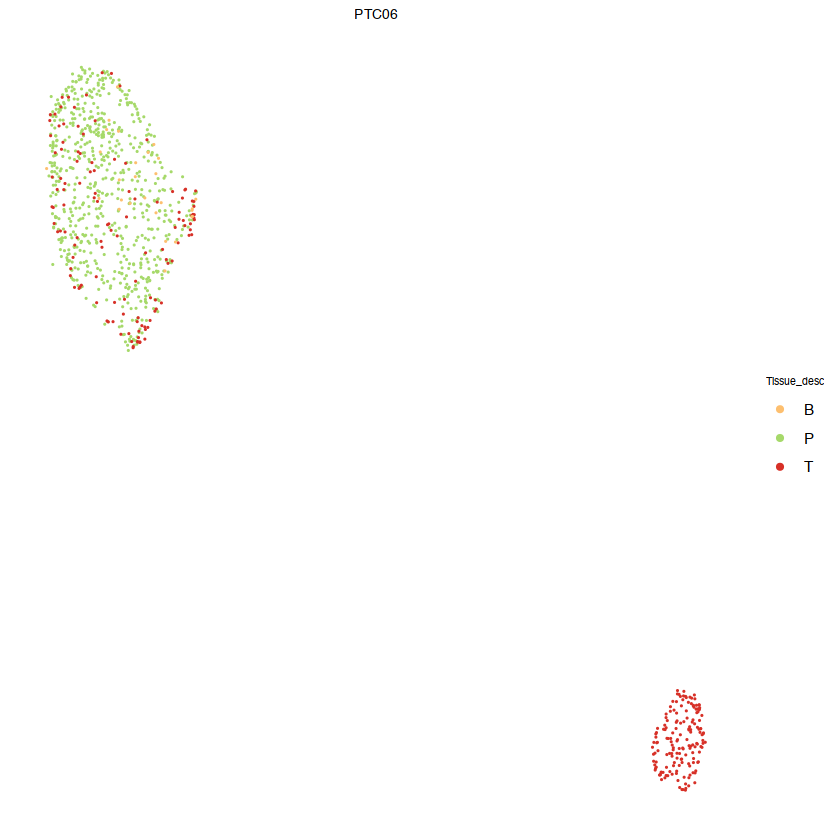

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


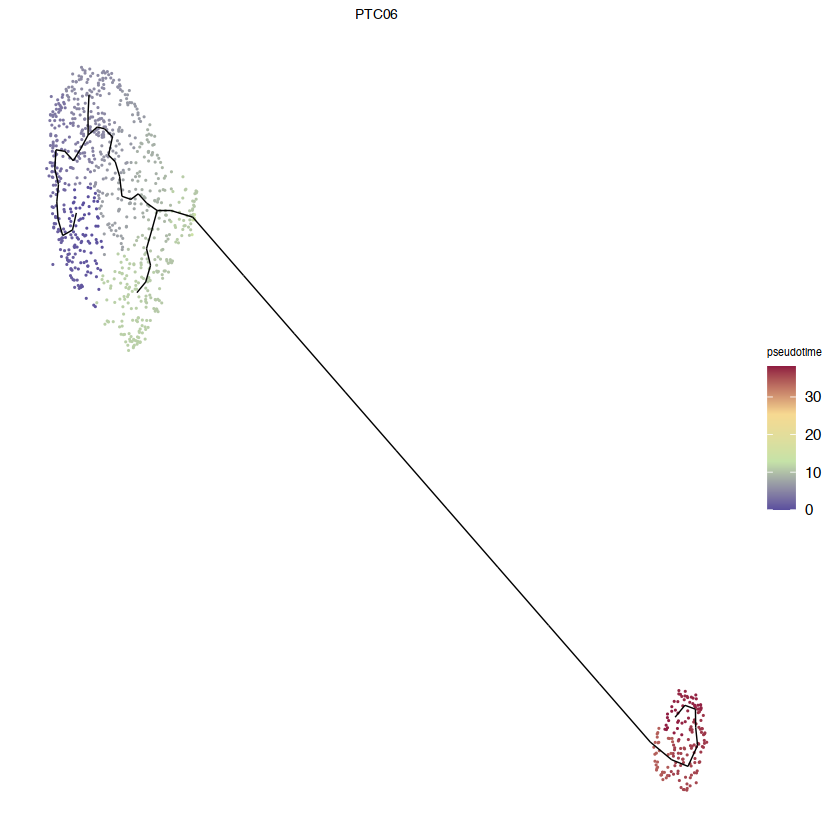

In [72]:
p='PTC06'
cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
# data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
# data_df = arrange(data_df, desc(Tissue_desc))
# data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
# data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
# data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid"', 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = '"source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


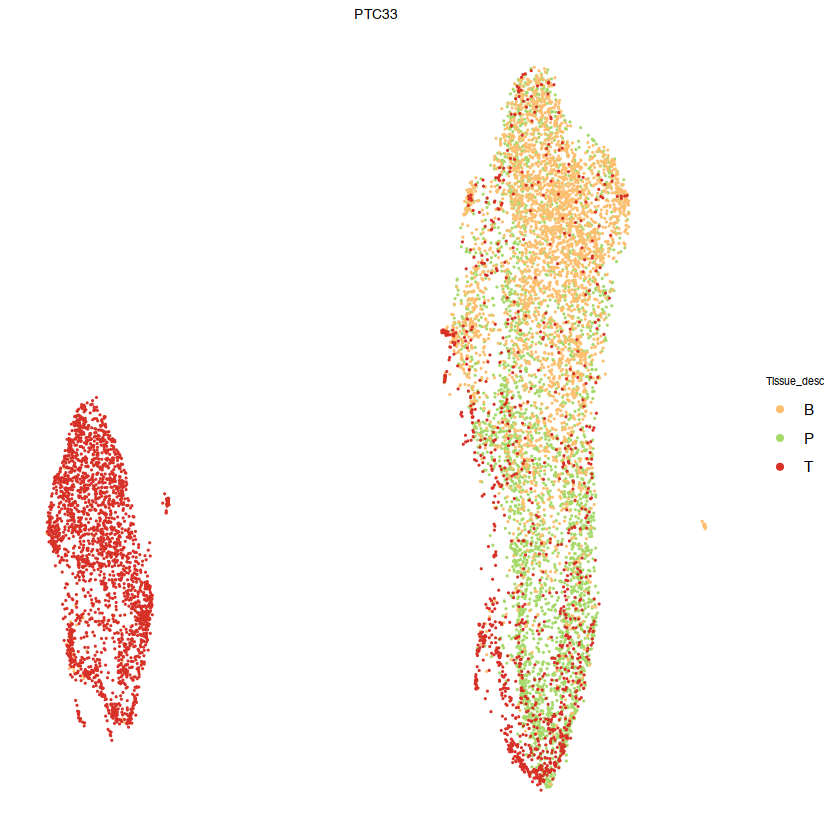

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


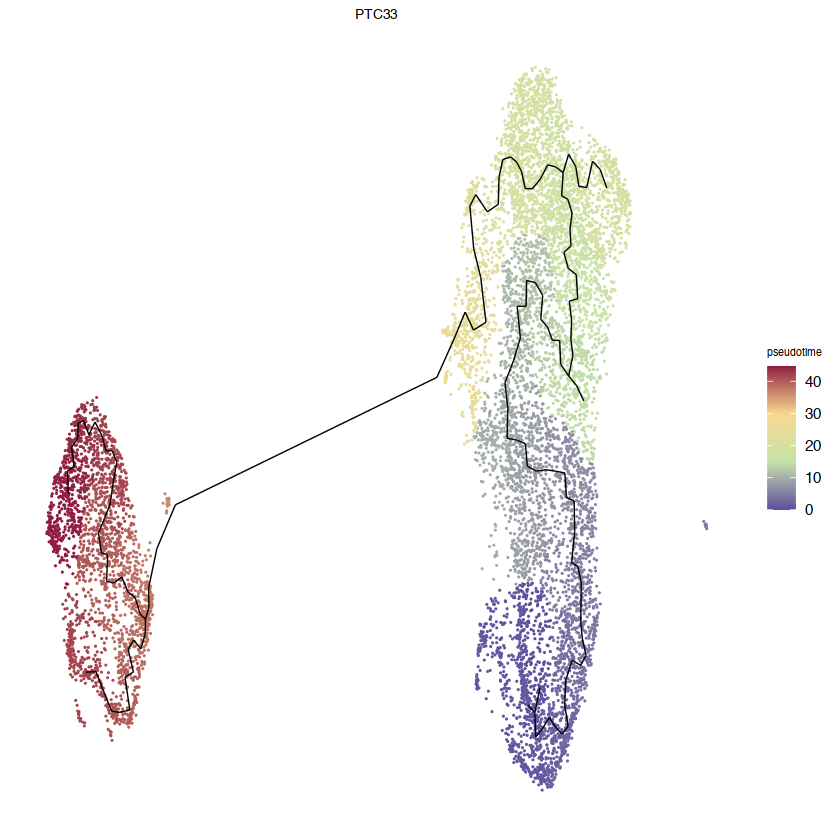

In [73]:
p='PTC33'
cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
# data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
# data_df = arrange(data_df, desc(Tissue_desc))
# data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
# data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
# data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid"', 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = '"source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


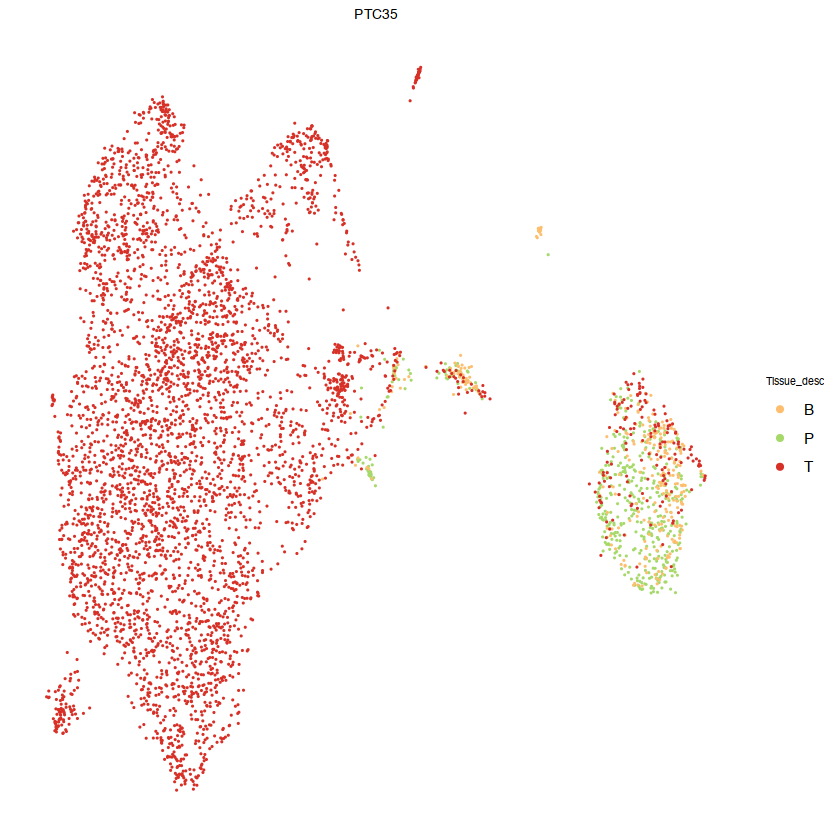

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


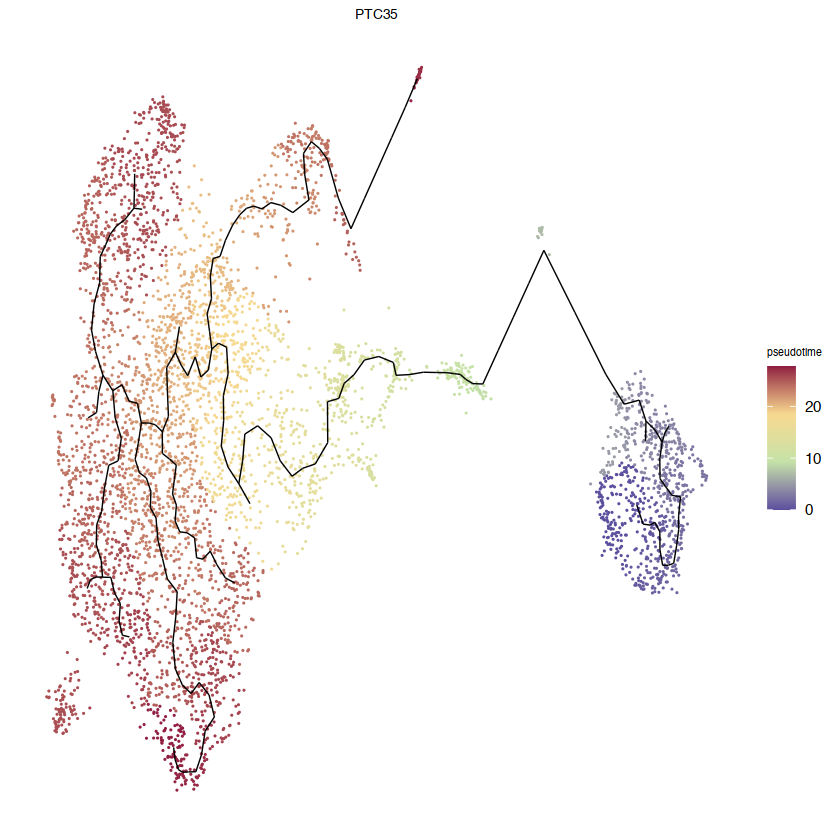

In [74]:
p='PTC35'
cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
# data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
# data_df = arrange(data_df, desc(Tissue_desc))
# data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
# data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
# data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid"', 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = '"source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

This graph was created by an old(er) igraph version.
  Call upgrade_graph() on it to use with the current igraph version
  For now we convert it on the fly...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


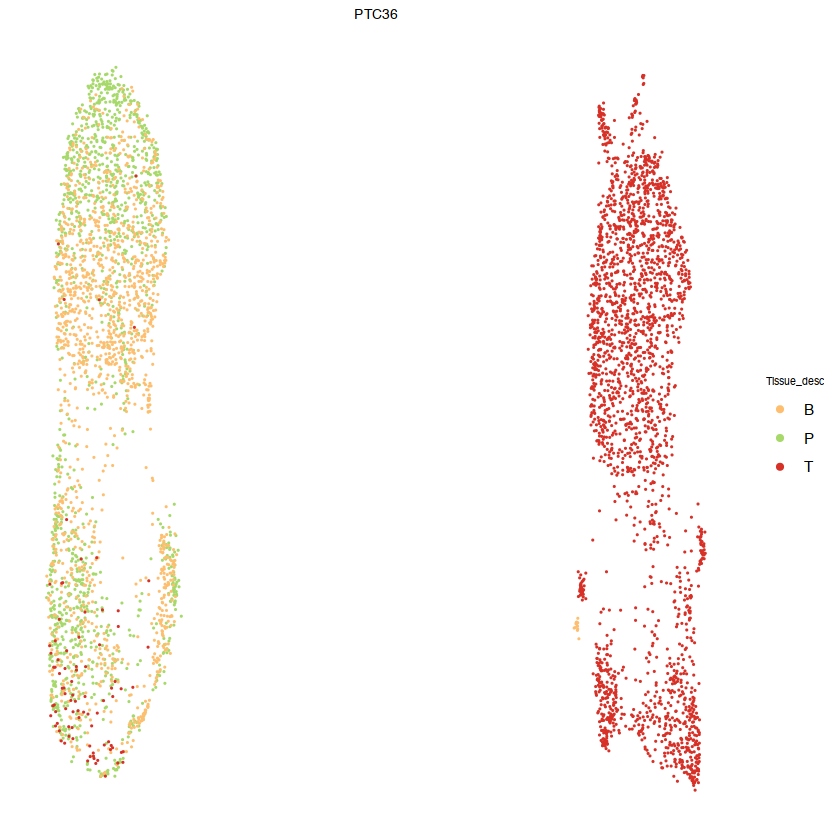

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


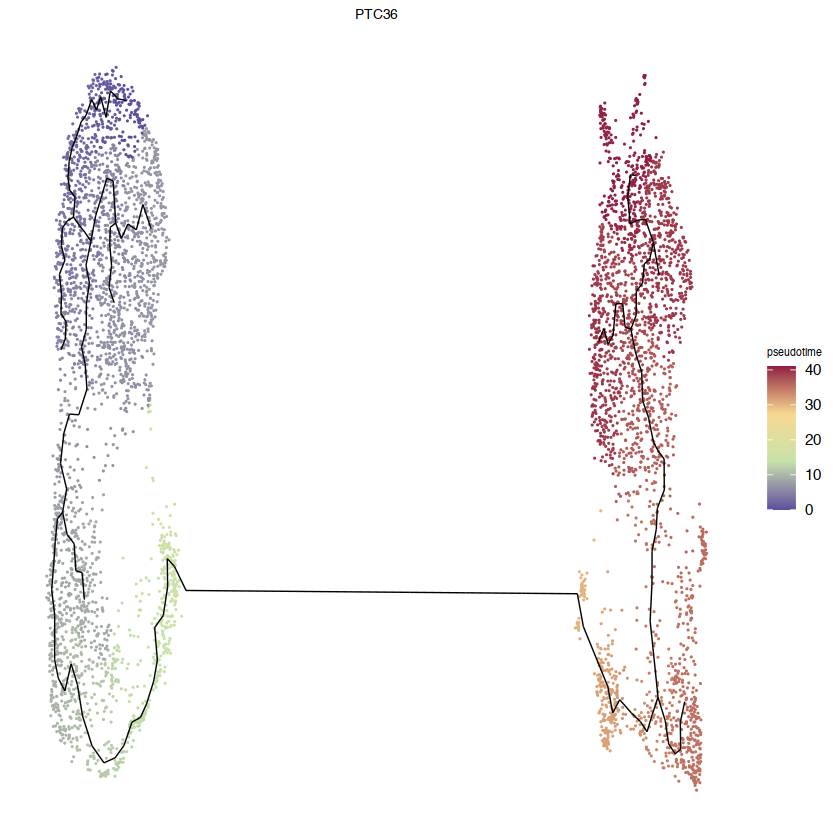

In [75]:
p='PTC36'
cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df$Tissue_desc = cds@colData$Tissue_desc
ica_space_df <- t(cds@principal_graph_aux[['UMAP']]$dp_mst) %>% 
  as.data.frame() %>% dplyr::select(prin_graph_dim_1 = 1, 
                                    prin_graph_dim_2 = 2) %>% dplyr::mutate(sample_name = rownames(.), 
                                                                            sample_state = rownames(.))
dp_mst <- cds@principal_graph[['UMAP']]
edge_df <- dp_mst %>% 
  igraph::as_data_frame() %>%
  dplyr::select(source = "from", target = "to") %>%
  dplyr::left_join(ica_space_df %>% 
                     dplyr::select(source = "sample_name", 
                                   source_prin_graph_dim_1 = "prin_graph_dim_1", 
                                   source_prin_graph_dim_2 = "prin_graph_dim_2"), 
                   by = "source") %>% dplyr::left_join(ica_space_df %>% 
                                                         dplyr::select(target = "sample_name", 
                                                                       target_prin_graph_dim_1 = "prin_graph_dim_1", 
                                                                       target_prin_graph_dim_2 = "prin_graph_dim_2"), 
                                                       by = "target")
data_df$pseudotime = pseudotime(cds)[rownames(data_df)]
# data_df$Tissue_desc = as.vector(data_df$Tissue_desc)
# data_df = arrange(data_df, desc(Tissue_desc))
# data_df$Tissue_desc = sapply(rownames(data_df), function(x)strsplit(x, '_')[[1]][2])
# data_df$Tissue_desc[data_df$Tissue_desc=='T3'] = 'B'
# data_df$Tissue_desc[data_df$Tissue_desc%in%c('T1', 'T2')] = 'T'

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=Tissue_desc))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid"', 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = tissue_colors)+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_tissuecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

a=ggplot(data = data_df, aes(x = data_dim_1, y = data_dim_2, fill=pseudotime))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  geom_segment(aes_string(x = '"source_prin_graph_dim_1", 
                          y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
                          yend = "target_prin_graph_dim_2"), size = 0.3, 
               color = 'black', linetype = "solid", 
               na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_gradientn(colours = c('#5b509e','#c5e2a8','#f7d991','#901c41'))+
  #viridis::scale_fill_viridis(name='Pseudotime')+
  #scale_fill_manual(values = tissue_colors)+
  #guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人.pdf'), plot = a+NoLegend(), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')
ggsave(glue('{output_dir}/monocle3_pseudotimecoloring{p}病人(legend).pdf'), plot = get_legend(a), 
       width=50, height=50, units='mm', dpi = 450, bg = 'transparent')

# SNV在monocle3

## PTC12

In [2]:
snv_list2 = readRDS('./SNV/SComatic/output/snv_filter_genome_pos.rds')

In [3]:
p='PTC12'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}
cds@colData[['bc']] = sapply(rownames(cds@colData), function(x)strsplit(x,'_')[[1]][3])

load

Loading required package: monocle3

Loading required package: Biobase

Warning message:
“package ‘Biobase’ was built under R version 4.2.3”
Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Welcome to Bioconductor

    Vignettes contain introductory 

In [4]:
p='PTC12-T1'
tmp_snv=snv_list2[[p]]
show_snv = 'chr15_24954986_C_G'
tmp_all_snv = rbind(tmp_snv$snv_T_filter[,tmp_snv$same_snv, drop=F], tmp_snv$snv_B_filter[,tmp_snv$same_snv, drop=F])
p='PTC12-T2'
tmp_snv=snv_list2[[p]]
show_snv = 'chr15_24954986_C_G'
tmp_all_snv2 = rbind(tmp_snv$snv_T_filter[,tmp_snv$same_snv, drop=F], tmp_snv$snv_B_filter[,tmp_snv$same_snv, drop=F])


In [5]:
snv_count = c(tmp_all_snv[, show_snv], tmp_all_snv2[, show_snv])
snv_count = data.frame(snv_count)

In [6]:
snv_count$bc = c(rownames(tmp_all_snv), rownames(tmp_all_snv2))
snv_count = snv_count %>% group_by(bc) %>% summarise(freq=sum(snv_count)) %>% as.data.frame()
rownames(snv_count) = snv_count$bc
cds@colData[, show_snv]=snv_count[cds@colData$bc, 'freq']
cds@colData[, show_snv] = cds@colData[, show_snv]>0
cds@colData[, show_snv][is.na(cds@colData[, show_snv])] = FALSE

In [7]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df[,show_snv] = ifelse(cds@colData[,show_snv]=='TRUE','Share', 'No')
data_df[,'Tissue_desc'] = cds@colData[,'Tissue_desc']


In [9]:
data_df %>%
    filter(chr15_24954986_C_G=='Share') %>%
    group_by(Tissue_desc) %>%
    summarise(n())

Tissue_desc,n()
<chr>,<int>
B,578
P,4
T,1581


In [10]:
(578+1581)/(578+1581+4)

[1] 0.9981507

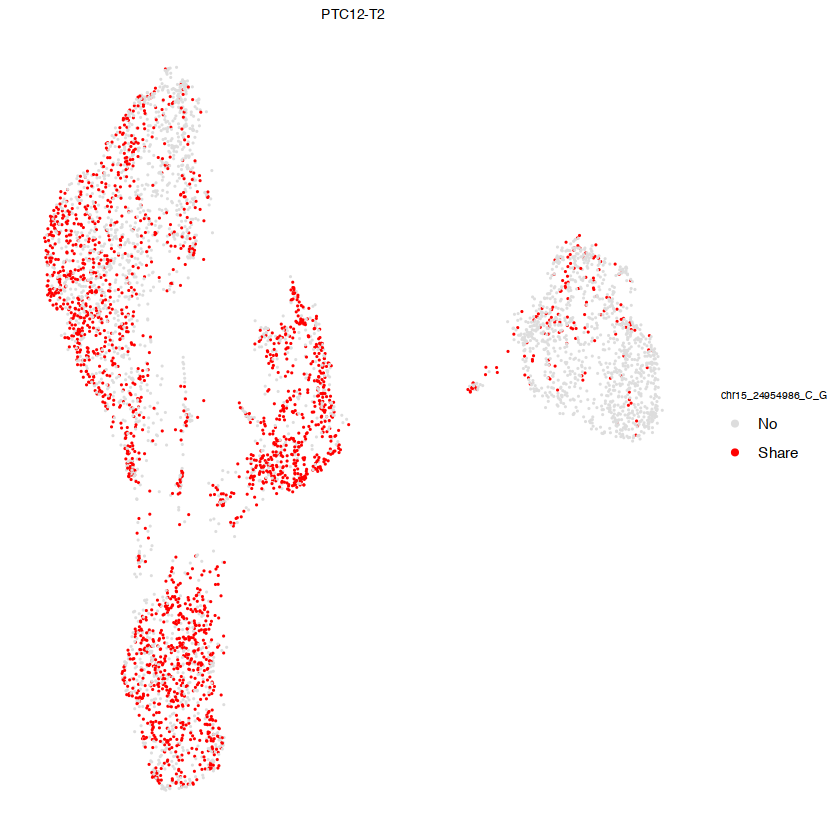

In [25]:
data_df$Tissue_desc = factor(data_df$Tissue_desc, levels = c('B','T','P'))
data_df = arrange(data_df,Tissue_desc)
a=ggplot(data = data_df, aes_string(x = 'data_dim_1', y = 'data_dim_2', fill=show_snv))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = c('Share'='#ff0000ff','No'='#dddddd'))+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/PTC12_SNV在monocle轨迹distribution.pdf'), plot = a,  
       width=70, height=50, units='mm', dpi = 450, bg = 'transparent')

## PTC30

In [11]:
p='PTC30'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}

load



In [12]:
cds@colData[['bc']] = sapply(rownames(cds@colData), function(x)strsplit(x,'_')[[1]][3])

In [13]:
p='PTC30'
tmp_snv=snv_list2[[p]]
show_snv = 'chr16_21953360_C_G'
tmp_all_snv = rbind(tmp_snv$snv_T_filter[,tmp_snv$same_snv, drop=F], tmp_snv$snv_B_filter[,tmp_snv$same_snv, drop=F])
tmp_all_snv2 = rbind(tmp_snv$snv_T_filter[,tmp_snv$same_snv, drop=F], tmp_snv$snv_B_filter[,tmp_snv$same_snv, drop=F])
snv_count = c(tmp_all_snv[, show_snv], tmp_all_snv2[, show_snv])
snv_count = data.frame(snv_count)
snv_count$bc = c(rownames(tmp_all_snv), rownames(tmp_all_snv2))
snv_count = snv_count %>% group_by(bc) %>% summarise(freq=sum(snv_count)) %>% as.data.frame()
rownames(snv_count) = snv_count$bc

In [14]:
cds@colData[, show_snv]=snv_count[cds@colData$bc, 'freq']
cds@colData[, show_snv] = cds@colData[, show_snv]>0
cds@colData[, show_snv][is.na(cds@colData[, show_snv])] = FALSE

In [15]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df[,show_snv] = ifelse(cds@colData[,show_snv]=='TRUE','Share', 'No')
data_df[,'Tissue_desc'] = cds@colData[,'Tissue_desc']

In [17]:
data_df %>%
    filter(chr16_21953360_C_G=='Share') %>%
    group_by(Tissue_desc) %>%
    summarise(n())

Tissue_desc,n()
<chr>,<int>
B,686
P,3
T,268


In [18]:
(686+268) / (686+268+3)

[1] 0.9968652

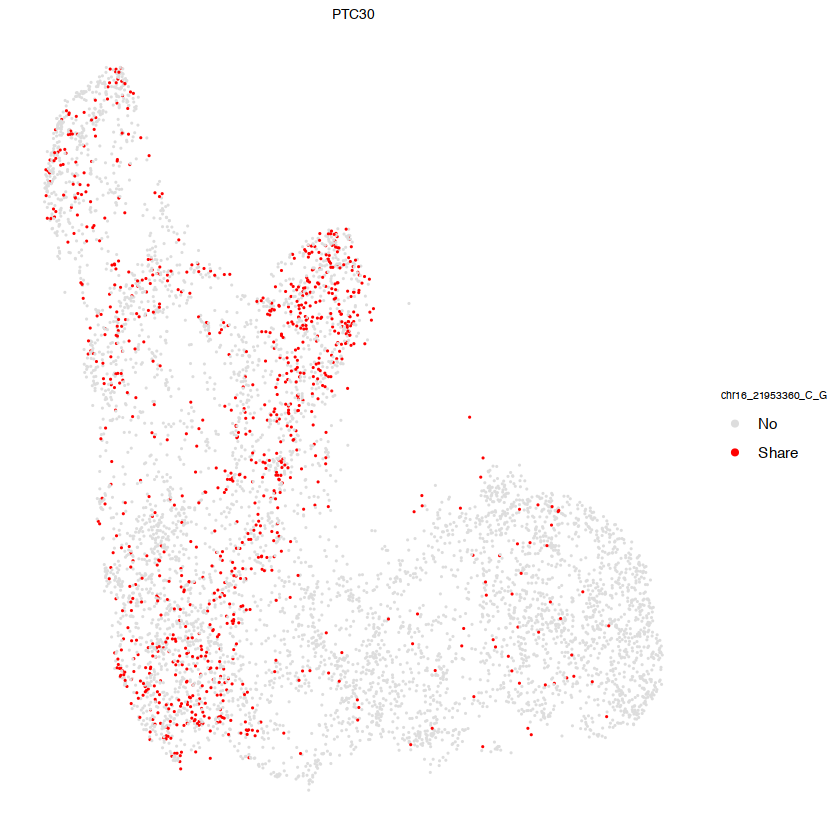

In [34]:
data_df$Tissue_desc = factor(data_df$Tissue_desc, levels = c('P','T','B'))
data_df = arrange(data_df,Tissue_desc)
a=ggplot(data = data_df, aes_string(x = 'data_dim_1', y = 'data_dim_2', fill=show_snv))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = c('Share'='#ff0000ff','No'='#dddddd'))+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=p)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/PTC30_SNV在monocle轨迹distribution.pdf'), plot = a,  
       width=70, height=50, units='mm', dpi = 450, bg = 'transparent')

# mtDNA在monocle3

In [19]:
mtDNA_list = readRDS('./SNV/mtDNA/output/mtDNA_list.rds')
mtDNA_df = readRDS('./SNV/mtDNA/output/mtDNA_df.rds')


## PTC12

In [20]:
p='PTC12'
tmp_mtDNA = mtDNA_df[[p]]
tmp_af = as.data.frame(tmp_mtDNA$af)

In [21]:
p='PTC12'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}
cds@colData[['bc']] = sapply(rownames(cds@colData), function(x)strsplit(x,'_')[[1]][3])

load



In [22]:
mt='2285T>C'
cds@colData[, 'mtDNA']=tmp_af[cds@colData$bc,mt]

In [23]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df[,'mtDNA'] = ifelse(cds@colData[, 'mtDNA']>0.3, 'Share', 'No')
data_df[,'Tissue_desc'] = cds@colData[,'Tissue_desc']

In [25]:
data_df %>%
    filter(mtDNA=='Share') %>%
    group_by(Tissue_desc) %>%
    summarise(n())

Tissue_desc,n()
<chr>,<int>
B,76
P,26
T,275


In [26]:
(76+275)/(76+275+26)

[1] 0.9310345

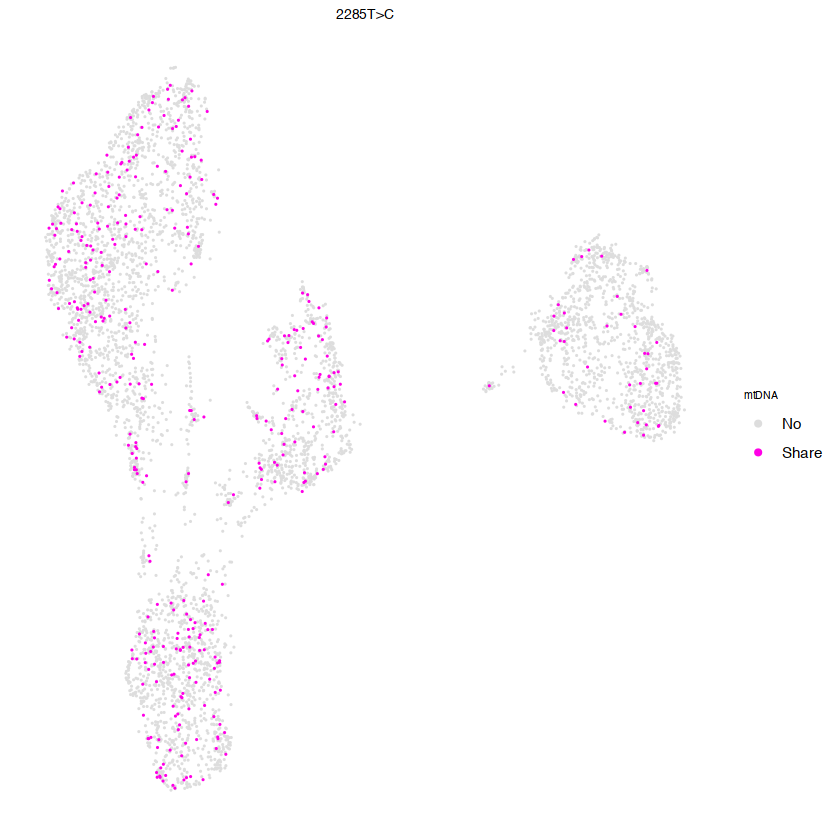

In [54]:
data_df$mtDNA = factor(data_df$mtDNA, levels = c('No','Share'))
data_df = arrange(data_df,mtDNA)
a=data_df %>% na.omit() %>% ggplot(aes_string(x = 'data_dim_1', y = 'data_dim_2', fill='mtDNA'))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = c('Share'='#ff00e6ff','No'='#dddddd'))+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=mt)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/PTC12_mtDNA在monocle轨迹distribution.pdf'), plot = a,  
       width=70, height=50, units='mm', dpi = 450, bg = 'transparent')

## PTC30

In [27]:
p='PTC30'
if(file.exists(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))){
    message('load')
    cds = readRDS(paste0('../output/良性结节monocle3/',p,'_2_monocle3.rds'))

}
cds@colData[['bc']] = sapply(rownames(cds@colData), function(x)strsplit(x,'_')[[1]][3])

load



In [28]:
p='PTC30'
tmp_mtDNA = mtDNA_df[[p]]
tmp_af = as.data.frame(tmp_mtDNA$af)

In [29]:
mt='2285T>C'
cds@colData[, 'mtDNA']=tmp_af[cds@colData$bc,mt]

In [30]:
S_matrix <- SingleCellExperiment::reducedDims(cds)[['UMAP']]
data_df <- data.frame(S_matrix[, c(1, 2)])
colnames(data_df) = c('data_dim_1', 'data_dim_2')
data_df[,'mtDNA'] = ifelse(cds@colData[, 'mtDNA']>0.3, 'Share', 'No')
data_df[,'Tissue_desc'] = cds@colData[,'Tissue_desc']

In [31]:
data_df %>%
    filter(mtDNA=='Share') %>%
    group_by(Tissue_desc) %>%
    summarise(n())

Tissue_desc,n()
<chr>,<int>
B,212
P,86
T,186


In [32]:
(212+186)/(212+186+86)

[1] 0.822314

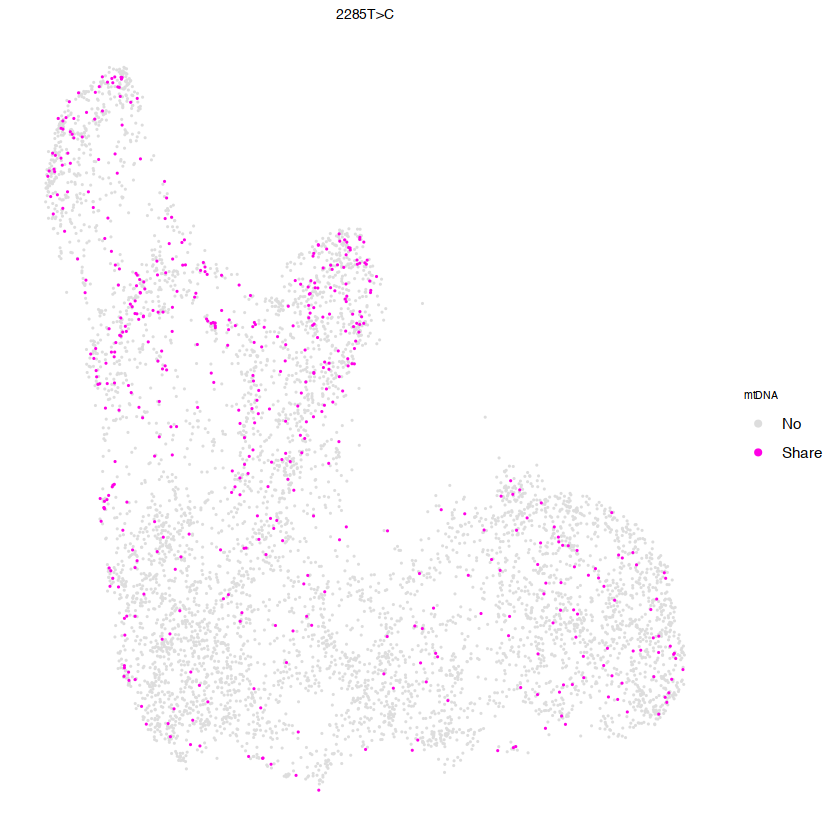

In [59]:
data_df$mtDNA = factor(data_df$mtDNA, levels = c('No','Share'))
data_df = arrange(data_df,mtDNA)
a=data_df %>% na.omit() %>% ggplot(aes_string(x = 'data_dim_1', y = 'data_dim_2', fill='mtDNA'))+ 
  geom_point(shape=21,size = 0.6,na.rm = TRUE, stroke=NA)+
  #geom_segment(aes_string(x = "source_prin_graph_dim_1", 
  #                        y = "source_prin_graph_dim_2", xend = "target_prin_graph_dim_1", 
  #                        yend = "target_prin_graph_dim_2"), size = 0.3, 
  #             color = 'black', linetype = "solid", 
  #             na.rm = TRUE, data = edge_df, inherit.aes = F)+
  scale_fill_manual(values = c('Share'='#ff00e6ff','No'='#dddddd'))+
  guides(fill = guide_legend(override.aes = list(size=2, stroke=NA,shape=21)))+
  labs(title=mt)+
  theme_minimal()+
  theme(#panel.border = element_rect(color='black', fill=NA),
    panel.grid = element_blank(),
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.text = element_blank(),
    legend.title = element_text(size=6),
    plot.title = element_text(hjust = 0.5, size=8))
a
ggsave(glue('{output_dir}/PTC30_mtDNA在monocle轨迹distribution.pdf'), plot = a,  
       width=70, height=50, units='mm', dpi = 450, bg = 'transparent')